# Análisis de 20 años de datos históricos: Eficiencia y rentabilidad por cliente #

Autor: Ingeniero Agrónomo Marcelo López Castro

---------------

Proyecto: Transformación de Datos Históricos para Análisis de Eficiencia Empresarial
Contexto:
Los registros históricos de la empresa están almacenados en planillas de Excel acumuladas durante 20 años.
Estos datos carecían de estructura estándar y presentaban inconsistencias (fechas, nombres de columnas, métricas faltantes).
El objetivo principal es consolidar estos datos en una base robusta para analizar la eficiencia operativa y apoyar la toma de decisiones estratégicas.
Objetivos:
Digitalización y Estandarización de Datos:

Convertir registros históricos en archivos CSV normalizados.
Garantizar la calidad de los datos mediante corrección de formatos y validaciones.
Consolidación de Datos:

Integrar los 20 archivos CSV anuales en un único DataFrame en Python.
Crear una tabla maestra que permita análisis eficientes.
Diseño de una Tabla Maestra en Formato Largo:

Reestructurar los datos para que sean fáciles de filtrar, agregar y visualizar.
Incluir métricas clave: REAL/SERVICIO y VALOR/SERVICIO por cliente y por fecha.
Preparación para Análisis:

Exportar los datos en formato largo para integrarlos con herramientas como Power BI.
Asegurar que las métricas estén disponibles por cliente y por período (2003-2023).
Visualización y Análisis Avanzado:

Crear gráficos representativos de tendencias históricas.
Demostrar las capacidades del modelo para analizar eficiencia, detectar patrones y proponer optimizaciones.
Habilidades Demostradas:
Limpieza y transformación de datos con Python (Pandas, Seaborn, Matplotlib).
Creación de bases de datos y diseño eficiente de tablas para análisis.
Integración con herramientas de visualización como Power BI.
Uso de técnicas de análisis descriptivo para interpretar la eficiencia histórica de la empresa.


-----------------------

Etapas del Proyecto
1. Recopilación y Organización Inicial de Datos (Excel → CSV)
Acción: Reuní y consolidé datos históricos de 20 años provenientes de múltiples fuentes en archivos de Excel.
Estrategia: Clasifiqué los registros por año, mes, cliente y métricas clave como:
REAL (consumo real)
VALOR (facturación)
REAL/SERVICIO (eficiencia)
VALOR/SERVICIO (rentabilidad relativa)
Resultado: Generé 20 archivos CSV limpios y uniformes, un archivo por año, como base para el análisis.
2. Preparación e Integración de Datos (Python)
Acción: Desarrollé un pipeline automatizado en Python para integrar, limpiar y estandarizar los datos:
Corrección de formatos inconsistentes (fechas, métricas, valores nulos).
Transformación a tablas maestras en formato largo y ancho, según las necesidades del análisis.
Generación de métricas adicionales como proporciones y acumulados.
Resultado: Consolidé los datos en una tabla principal de 66 clientes y 20 años de información, optimizada para consultas y visualizaciones.
3. Consolidación y Almacenamiento en SQL
Acción: Migré los datos finales a una base de datos SQL centralizada:
Diseño de esquema eficiente para consultas.
Automatización de actualizaciones periódicas.
Estrategia: Este enfoque permitió integrar los datos con herramientas como Power BI para análisis visual avanzado.
Resultado: Creé una base de datos escalable, accesible y lista para análisis interactivo.
4. Análisis y Visualización de Datos (Python y Power BI)
Acción: Analicé la evolución de métricas clave, identificando tendencias y oportunidades por cliente y período:
Usé Python para análisis exploratorio y gráficos personalizados (tendencias, eficiencias).
Construí dashboards interactivos en Power BI para una exploración más accesible.
Resultado: Proporcioné insights clave sobre la eficiencia operativa y la rentabilidad histórica de la empresa, facilitando la toma de decisiones informadas.


--------------------

## Introducción
La empresa "Ideas en Verde" cuenta con registros históricos de 20 años sobre su consumo real, facturación y eficiencia operativa por cliente. Este proyecto busca transformar estos datos en insights clave, consolidando los registros, generando métricas adicionales y visualizando su evolución.

## Objetivos
1. Consolidar datos históricos de 20 años (2003-2023) en un único dataset en formato largo.
2. Crear métricas clave: proporciones, acumulados, y tendencias por cliente.
3. Realizar análisis detallados y generar visualizaciones interactivas.
4. Exportar los datos para su análisis en Power BI.


-------------------

# 1. Carga e inspección de los datos #

Cargar los archivos CSV

In [2]:
import pandas as pd
import os

# Ruta a la carpeta con los archivos CSV
folder_path = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data"

# Crear una lista para almacenar los DataFrames individuales
dataframes = []

# Leer todos los archivos CSV en la carpeta
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_csv(file_path)
        dataframes.append(df)

# Concatenar todos los DataFrames en uno solo
data_ancha = pd.concat(dataframes, ignore_index=True)

# Mostrar un resumen inicial
print(f"Datos cargados correctamente. Total de registros: {data_ancha.shape[0]}")
print(f"Columnas disponibles: {data_ancha.columns}")


Datos cargados correctamente. Total de registros: 252
Columnas disponibles: Index(['Date', 'REAL_1', 'REAL_1/SERV_1', 'VALOR_1', 'VALOR_1/SERV_1',
       'REAL_2', 'REAL_2/SERV_2', 'VALOR_2', 'VALOR_2/SERV_2', 'REAL_3',
       ...
       'VALOR_64', 'VALOR_64/SERV_64', 'REAL_65', 'REAL_65/SERV_65',
       'VALOR_65', 'VALOR_65/SERV_65', 'REAL_66', 'REAL_66/SERV_66',
       'VALOR_66', 'VALOR_66/SERV_66'],
      dtype='object', length=266)


---------------------------

# 2. Preparación e Integración de Datos (Python) #

2.1 Validación de Fechas

In [3]:
# Convertir la columna 'Date' a formato datetime
data_ancha['Date'] = pd.to_datetime(data_ancha['Date'], errors='coerce')

# Identificar y mostrar filas con fechas nulas
fechas_nulas = data_ancha[data_ancha['Date'].isnull()]
if not fechas_nulas.empty:
    print(f"Fechas nulas encontradas: {len(fechas_nulas)} filas")
    print(fechas_nulas)
else:
    print("Todas las fechas se han cargado correctamente.")

# Mostrar el rango de fechas
print(f"Rango de fechas: Desde {data_ancha['Date'].min()} hasta {data_ancha['Date'].max()}")


Fechas nulas encontradas: 24 filas
   Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
24  NaT     8.5           0.02      8.5            0.02    0.00   
25  NaT     0.0           0.00     30.0            0.08    6.50   
26  NaT    23.0           0.06     38.0            0.10    0.00   
27  NaT     0.0           0.00      6.5            0.02    1.75   
28  NaT    35.7           0.10     35.7            0.10    0.00   
29  NaT    30.0           0.08     36.0            0.10    0.00   
30  NaT     0.0           0.00      0.0            0.00    0.00   
31  NaT   119.0           0.32    123.0            0.33   55.50   
32  NaT     5.5           0.01      5.5            0.01    4.00   
33  NaT     0.0           0.00      0.0            0.00   12.00   
34  NaT    17.5           0.05     17.5            0.05    0.00   
35  NaT     0.0           0.00      0.0            0.00    0.00   
36  NaT     0.0           0.00      0.0            0.00    5.90   
37  NaT     0.0           0

Este paso asegura que todas las fechas en la tabla están correctamente formateadas y no contienen valores nulos. También se muestra el rango de fechas para confirmar la cobertura temporal de los datos.

----------------------

# 3. Transformación de los datos #

Paso 3.1: Convertir la Tabla Ancha a Formato Largo

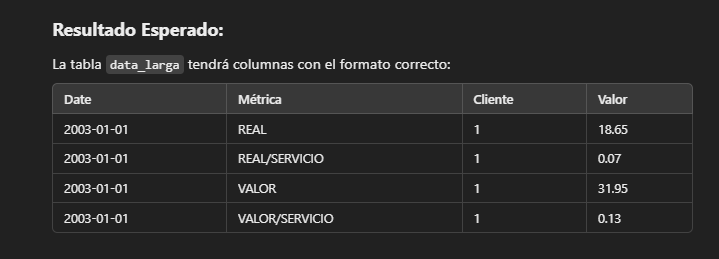

In [4]:
# Transformar la tabla ancha a formato largo
data_larga = data_ancha.melt(
    id_vars=['Date'],  # Mantener la columna 'Date' fija
    var_name='Variable',  # Crear una columna 'Variable' con los nombres de las columnas originales
    value_name='Valor'  # Los valores de las columnas originales irán en 'Valor'
)

# Extraer Métrica y Cliente considerando si hay '/' en el nombre
data_larga['Métrica'] = data_larga['Variable'].apply(lambda x: x.split('_')[0])  # Primera parte (REAL o VALOR)
data_larga['Cliente'] = data_larga['Variable'].apply(
    lambda x: x.split('_')[1] if '/' not in x else x.split('_')[1].split('/')[0]  # Manejar los casos con '/'
)
data_larga['Métrica'] = data_larga['Variable'].apply(
    lambda x: x.split('_')[0] if '/' not in x else x.split('_')[0] + '/' + x.split('_')[1].split('/')[1]
)

# Eliminar la columna 'Variable' original si ya no es necesaria
data_larga = data_larga.drop(columns=['Variable'])

# Reorganizar columnas
data_larga = data_larga[['Date', 'Cliente', 'Métrica', 'Valor']]

# Vista previa
print("Vista previa de la tabla larga ajustada:")
print(data_larga.head(10))

# Confirmar métricas y clientes únicos
print("\nMétricas únicas en la tabla:")
print(data_larga['Métrica'].unique())

print("\nClientes únicos en la tabla:")
print(data_larga['Cliente'].unique())


Vista previa de la tabla larga ajustada:
        Date Cliente Métrica  Valor
0 2003-01-01       1    REAL  18.65
1 2003-02-01       1    REAL   5.90
2 2003-03-01       1    REAL   0.00
3 2003-04-01       1    REAL   0.00
4 2003-05-01       1    REAL   0.00
5 2003-06-01       1    REAL   3.90
6 2003-07-01       1    REAL   0.00
7 2003-08-01       1    REAL   0.00
8 2003-09-01       1    REAL   0.00
9 2003-10-01       1    REAL   0.00

Métricas únicas en la tabla:
['REAL' 'REAL/SERV' 'VALOR' 'VALOR/SERV']

Clientes únicos en la tabla:
['1' '2' '3' '4' '5' '6' '7' '8' '9' '10' '11' '12' '13' '14' '15' '16'
 '17' '18' '19' '20' '21' '22' '23' '24' '25' '26' '27' '28' '29' '30'
 '31' '32' '33' '32.1' '34' '35' '36' '37' '38' '39' '40' '41' '42' '43'
 '44' '45' '46' '47' '48' '49' '50' '51' '52' '53' '54' '55' '56' '57'
 '58' '59' '60' '61' '62' '63' '64' '65' '66']


1. **Transformación a formato largo:** Las métricas de cada cliente se combinan en una columna común llamada `Métrica`. 
2. **Separación de cliente y métrica:** Extraemos el nombre del cliente y la métrica, ajustando los nombres de las métricas que contienen divisores `/`.
3. **Reorganización de columnas:** Aseguramos un formato limpio con las columnas en el orden: `Date`, `Cliente`, `Métrica`, `Valor`.


Verificación:

In [5]:
# Mostrar métricas y clientes únicos
print("Métricas únicas en la tabla larga:")
print(data_larga['Métrica'].unique())

print("\nClientes únicos en la tabla larga:")
print(data_larga['Cliente'].unique())

# Vista previa final
print("\nVista previa final de la tabla larga:")
print(data_larga.head(20))


Métricas únicas en la tabla larga:
['REAL' 'REAL/SERV' 'VALOR' 'VALOR/SERV']

Clientes únicos en la tabla larga:
['1' '2' '3' '4' '5' '6' '7' '8' '9' '10' '11' '12' '13' '14' '15' '16'
 '17' '18' '19' '20' '21' '22' '23' '24' '25' '26' '27' '28' '29' '30'
 '31' '32' '33' '32.1' '34' '35' '36' '37' '38' '39' '40' '41' '42' '43'
 '44' '45' '46' '47' '48' '49' '50' '51' '52' '53' '54' '55' '56' '57'
 '58' '59' '60' '61' '62' '63' '64' '65' '66']

Vista previa final de la tabla larga:
         Date Cliente Métrica  Valor
0  2003-01-01       1    REAL  18.65
1  2003-02-01       1    REAL   5.90
2  2003-03-01       1    REAL   0.00
3  2003-04-01       1    REAL   0.00
4  2003-05-01       1    REAL   0.00
5  2003-06-01       1    REAL   3.90
6  2003-07-01       1    REAL   0.00
7  2003-08-01       1    REAL   0.00
8  2003-09-01       1    REAL   0.00
9  2003-10-01       1    REAL   0.00
10 2003-11-01       1    REAL   0.00
11 2003-12-01       1    REAL   0.00
12 2004-01-01       1    REAL   0

----------------------------

# 4. Análisis Exploratorio #

Paso 4.1: Filtrar Datos para un Cliente Específico

In [6]:
# Filtrar datos de un cliente específico (Cliente 1) entre 2003 y 2023
cliente1_data = data_larga[
    (data_larga['Cliente'] == '1') & 
    (data_larga['Date'].between('2003-01-01', '2023-12-31'))
]

# Validar si se encontraron datos
if cliente1_data.empty:
    print("No se encontraron datos para Cliente 1.")
else:
    print(f"Datos de Cliente 1: {cliente1_data.shape[0]} registros encontrados")
    print(cliente1_data.head(10))

    # Mostrar métricas únicas para el cliente específico
    print("\nMétricas disponibles para Cliente 1:")
    print(cliente1_data['Métrica'].unique())


Datos de Cliente 1: 912 registros encontrados
        Date Cliente Métrica  Valor
0 2003-01-01       1    REAL  18.65
1 2003-02-01       1    REAL   5.90
2 2003-03-01       1    REAL   0.00
3 2003-04-01       1    REAL   0.00
4 2003-05-01       1    REAL   0.00
5 2003-06-01       1    REAL   3.90
6 2003-07-01       1    REAL   0.00
7 2003-08-01       1    REAL   0.00
8 2003-09-01       1    REAL   0.00
9 2003-10-01       1    REAL   0.00

Métricas disponibles para Cliente 1:
['REAL' 'REAL/SERV' 'VALOR' 'VALOR/SERV']


Qué hace este código:
Filtrado: Extrae las filas correspondientes al Cliente 1 y dentro del rango de fechas entre 2003 y 2023.
Validación: Comprueba si el dataframe resultante (cliente1_data) está vacío.
Resumen:
Muestra la cantidad de registros encontrados.
Muestra las primeras 10 filas de los datos.
Imprime las métricas únicas disponibles para ese cliente (por ejemplo, REAL/SERVICIO, VALOR/SERVICIO, etc.).

-----------------------

Paso 4.2: Generar Gráfico de Tendencias - Gráficos de REAL_x/SERV_x y VALOR_x/SERV_x para cada cliente

Objetivo: Visualizar la evolución de métricas clave ('REAL/SERV' y 'VALOR/SERV') para un cliente específico a lo largo del tiempo. Nota: descubriré más adelante una falla en la carga de los años 2005 y 2006, que corregiré.

In [7]:
print("Métricas únicas en la tabla larga:")
print(data_larga['Métrica'].unique())


Métricas únicas en la tabla larga:
['REAL' 'REAL/SERV' 'VALOR' 'VALOR/SERV']


In [17]:
cliente1_data = data_larga[
    (data_larga['Cliente'] == '1') &
    (data_larga['Métrica'].isin(['REAL/SERV', 'VALOR/SERV']))
]
print(f"Datos de Cliente 1: {cliente1_data.shape[0]} registros")
print(cliente1_data.head(10))


Datos de Cliente 1: 504 registros
          Date Cliente    Métrica  Valor
252 2003-01-01       1  REAL/SERV   0.07
253 2003-02-01       1  REAL/SERV   0.02
254 2003-03-01       1  REAL/SERV   0.00
255 2003-04-01       1  REAL/SERV   0.00
256 2003-05-01       1  REAL/SERV   0.00
257 2003-06-01       1  REAL/SERV   0.02
258 2003-07-01       1  REAL/SERV   0.00
259 2003-08-01       1  REAL/SERV   0.00
260 2003-09-01       1  REAL/SERV   0.00
261 2003-10-01       1  REAL/SERV   0.00


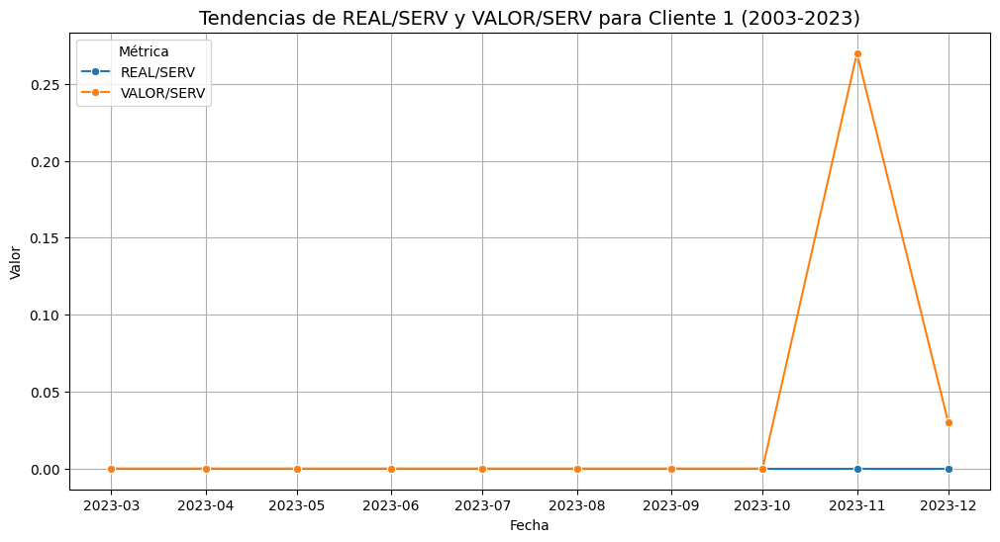

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Crear el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(data=cliente_data, x='Date', y='Valor', hue='Métrica', marker='o')
plt.title('Tendencias de REAL/SERV y VALOR/SERV para Cliente 1 (2003-2023)', fontsize=14)
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.legend(title='Métrica')
plt.grid()
plt.show()


# Gráficos de Real/Servicio y Valor/Servicio para todos los clientes del período. Descubriré luego y corregiré una falla en los años 2005 y 2006 #

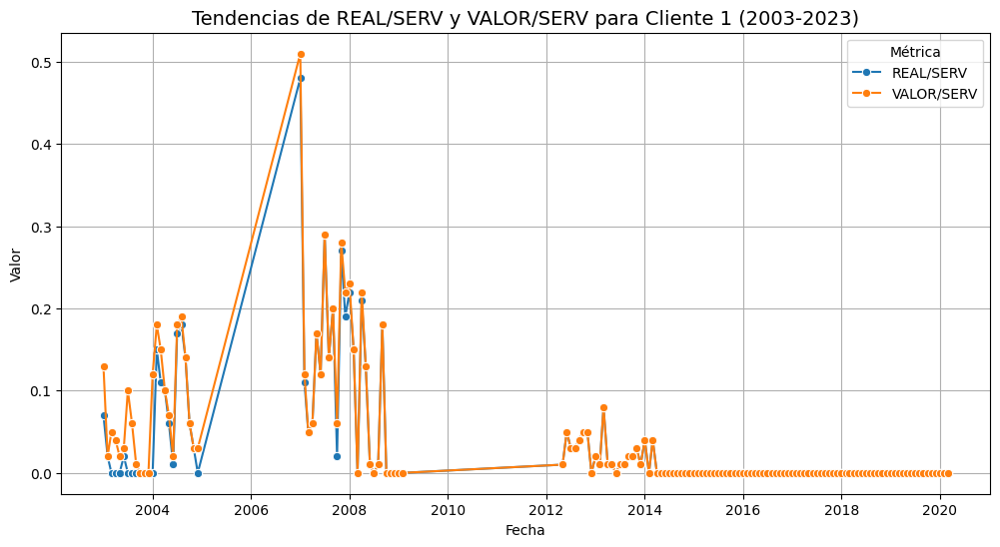

Gráfico generado para Cliente 1.


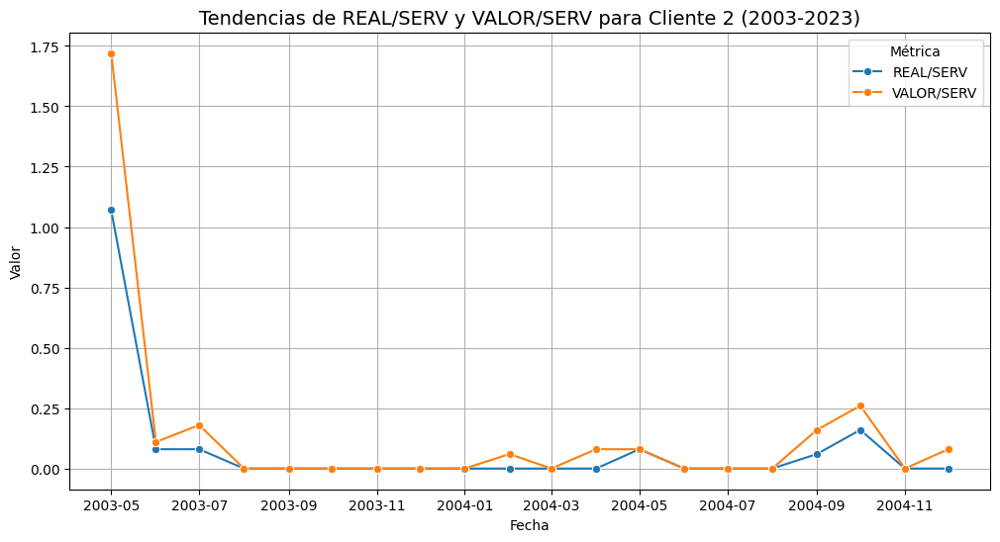

Gráfico generado para Cliente 2.


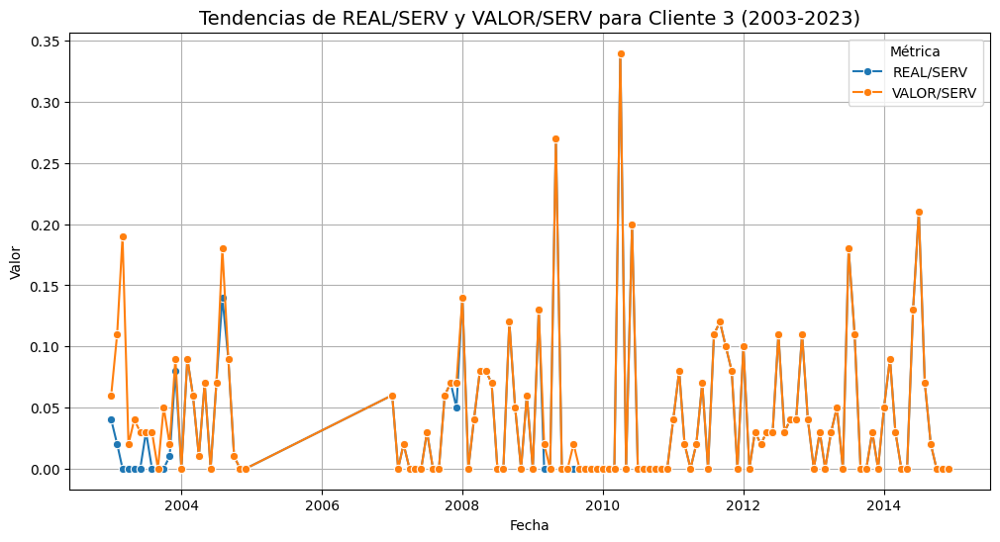

Gráfico generado para Cliente 3.


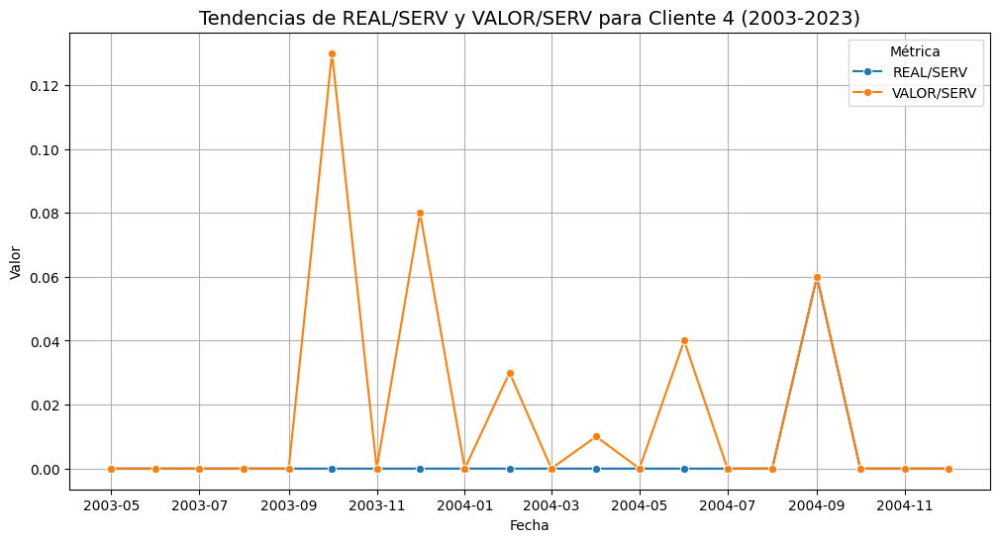

Gráfico generado para Cliente 4.


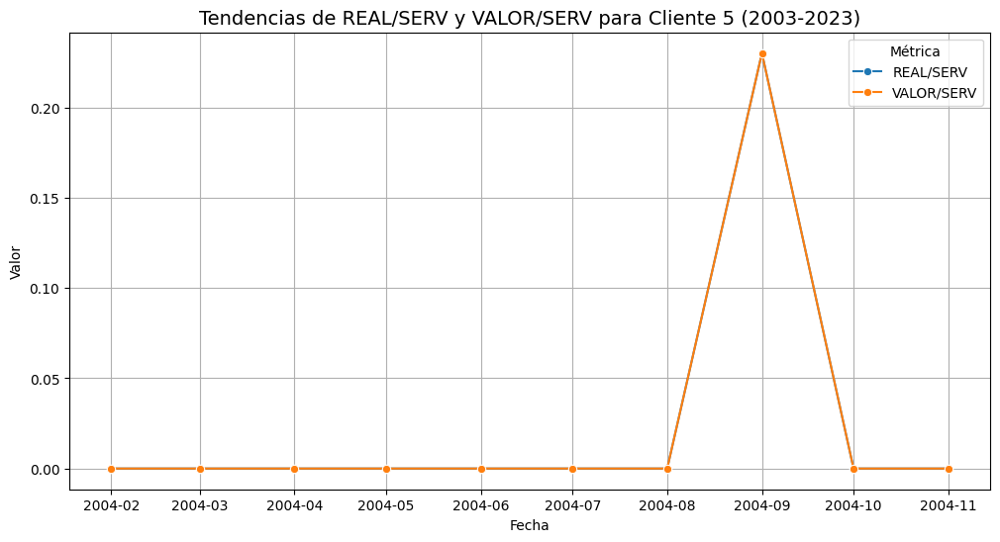

Gráfico generado para Cliente 5.


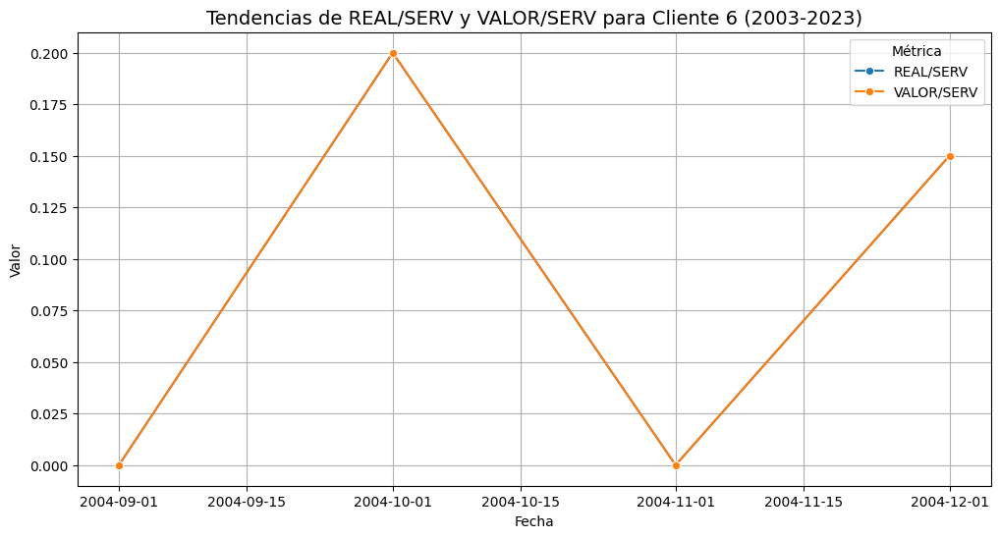

Gráfico generado para Cliente 6.


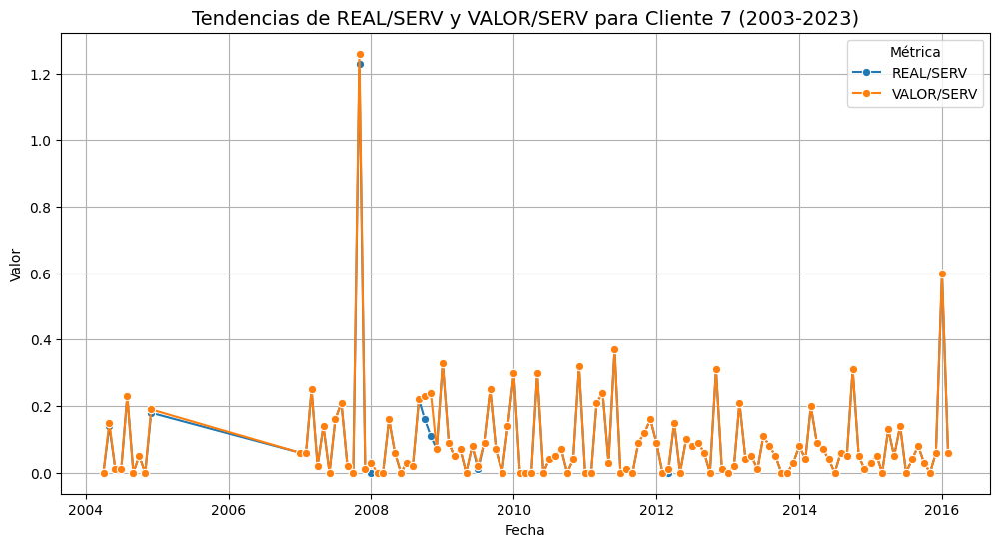

Gráfico generado para Cliente 7.


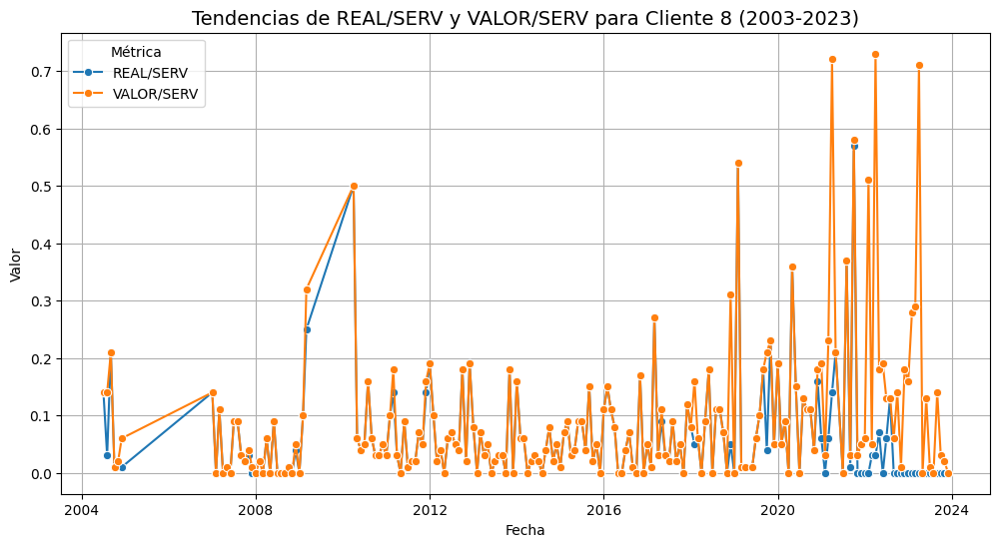

Gráfico generado para Cliente 8.


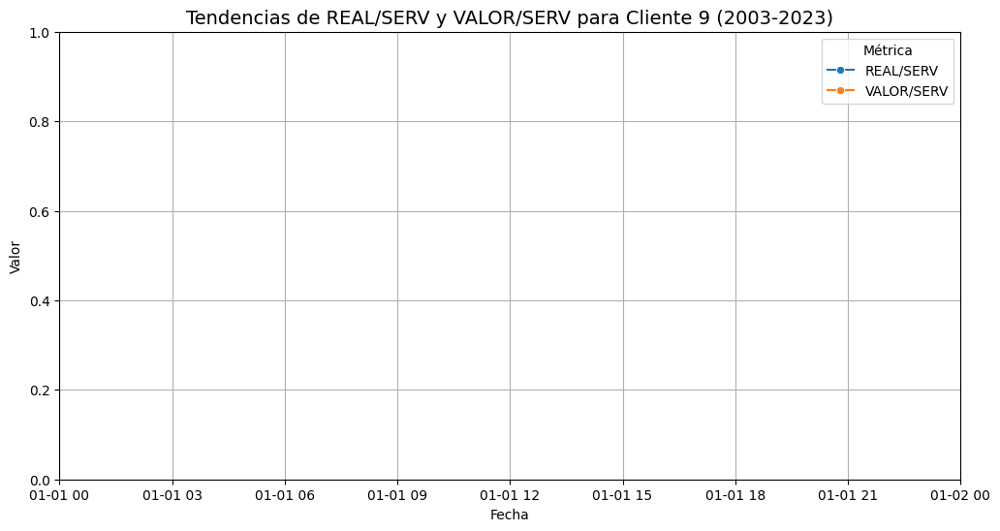

Gráfico generado para Cliente 9.


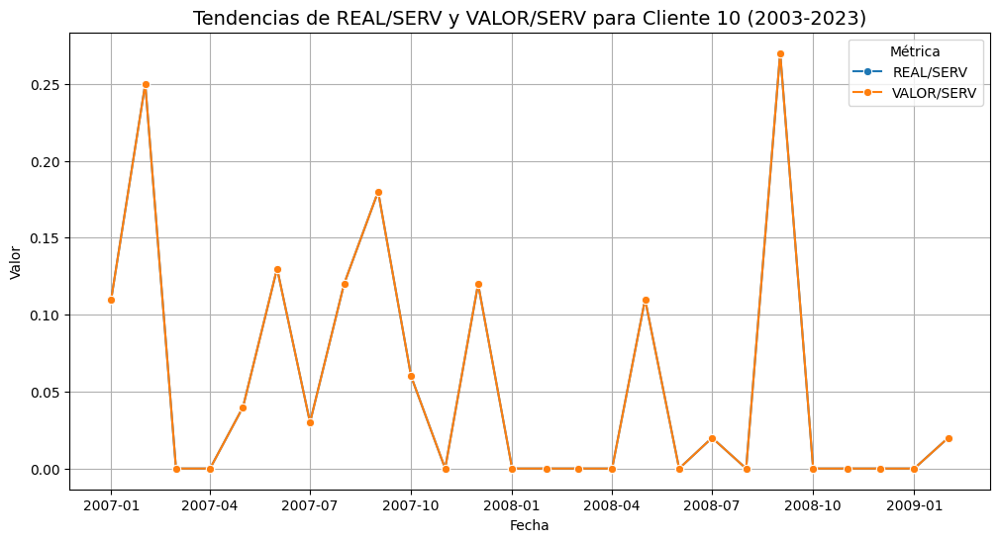

Gráfico generado para Cliente 10.


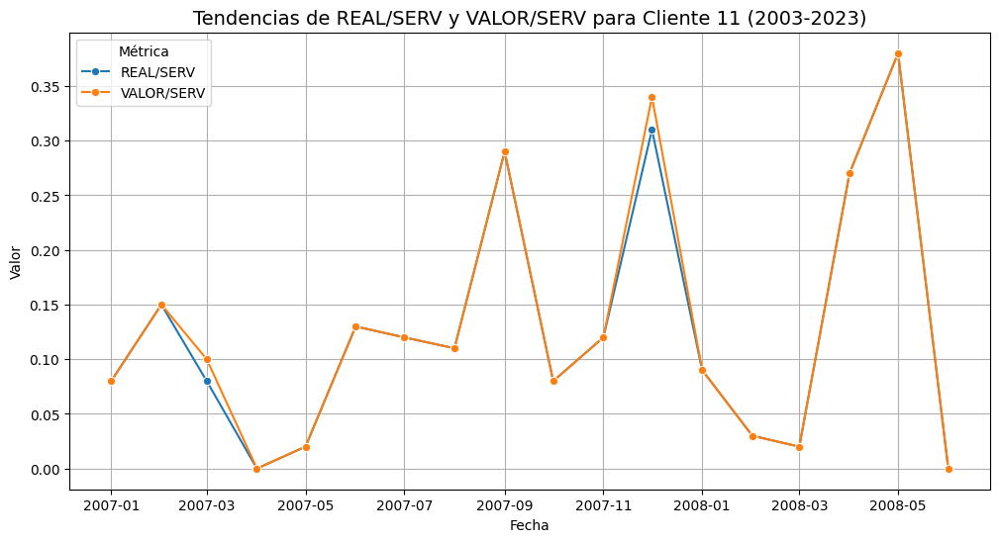

Gráfico generado para Cliente 11.


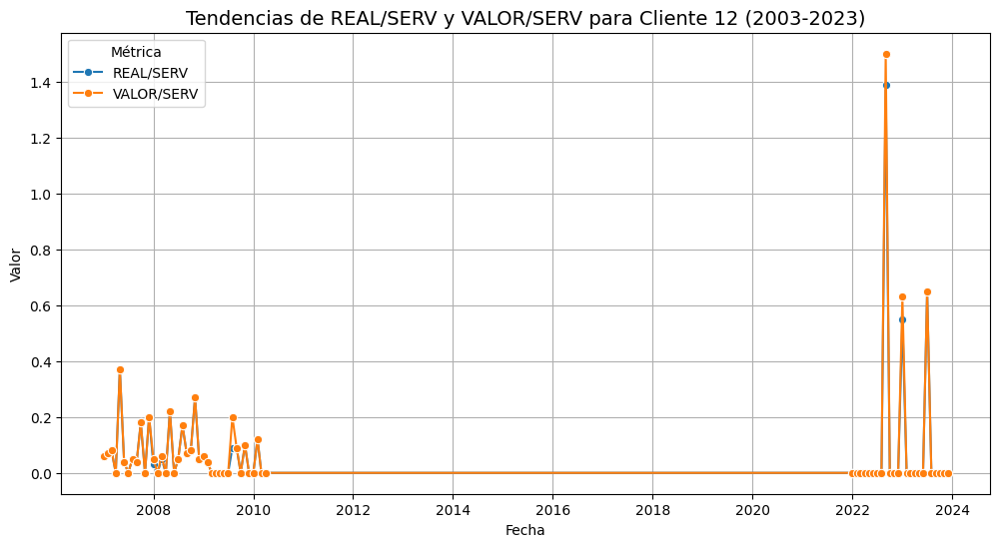

Gráfico generado para Cliente 12.


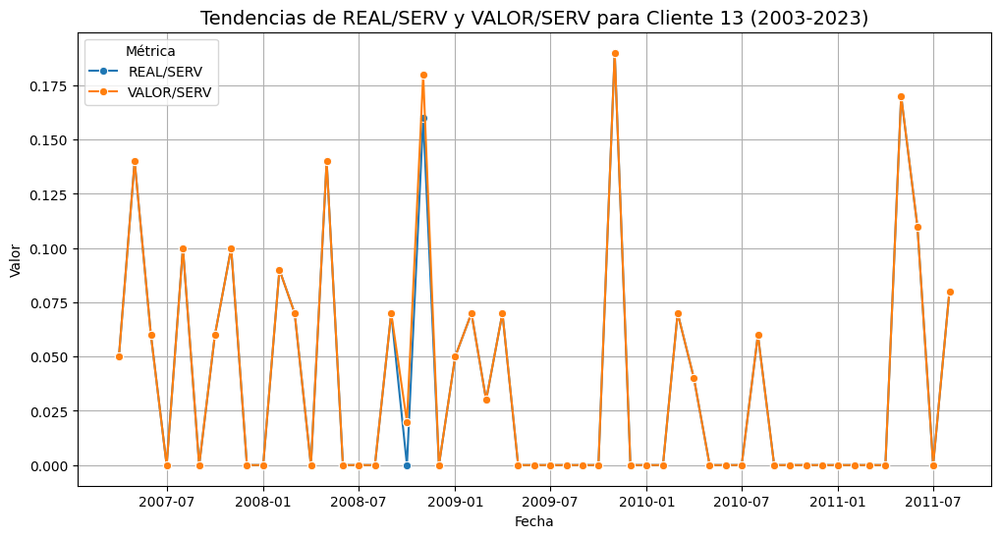

Gráfico generado para Cliente 13.


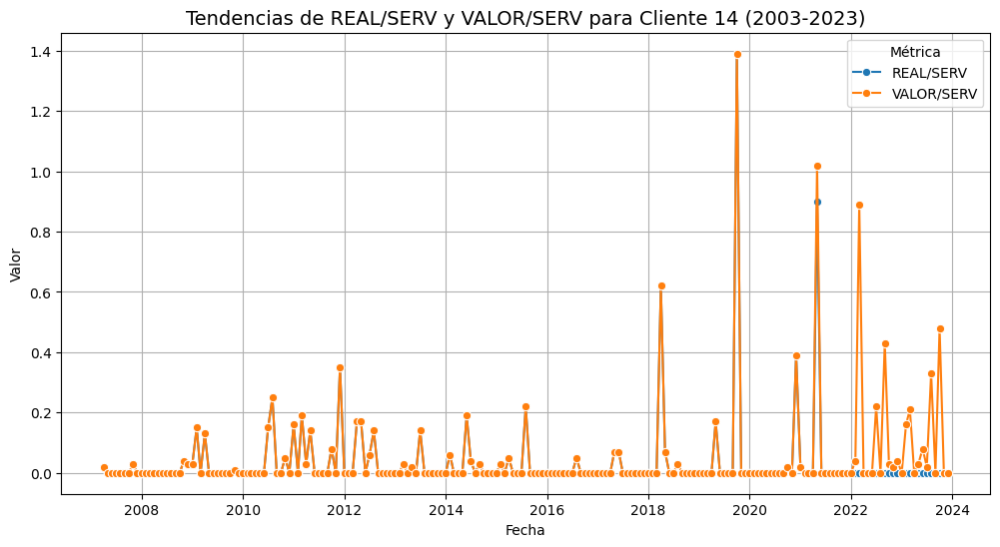

Gráfico generado para Cliente 14.


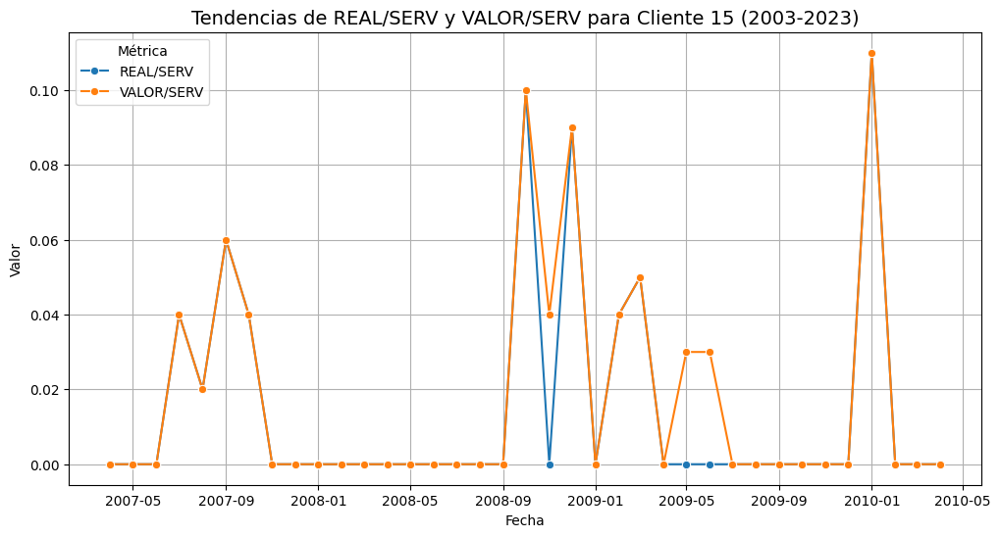

Gráfico generado para Cliente 15.


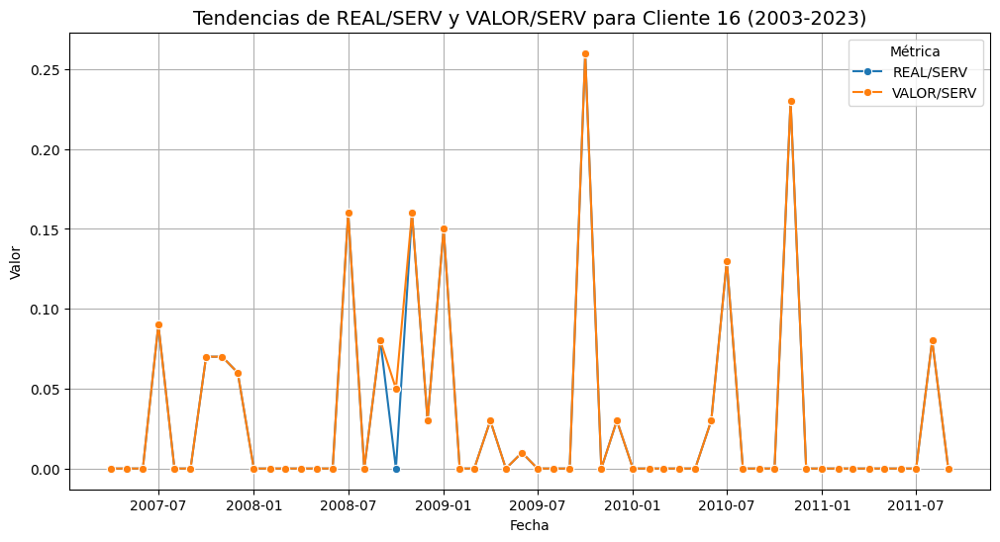

Gráfico generado para Cliente 16.


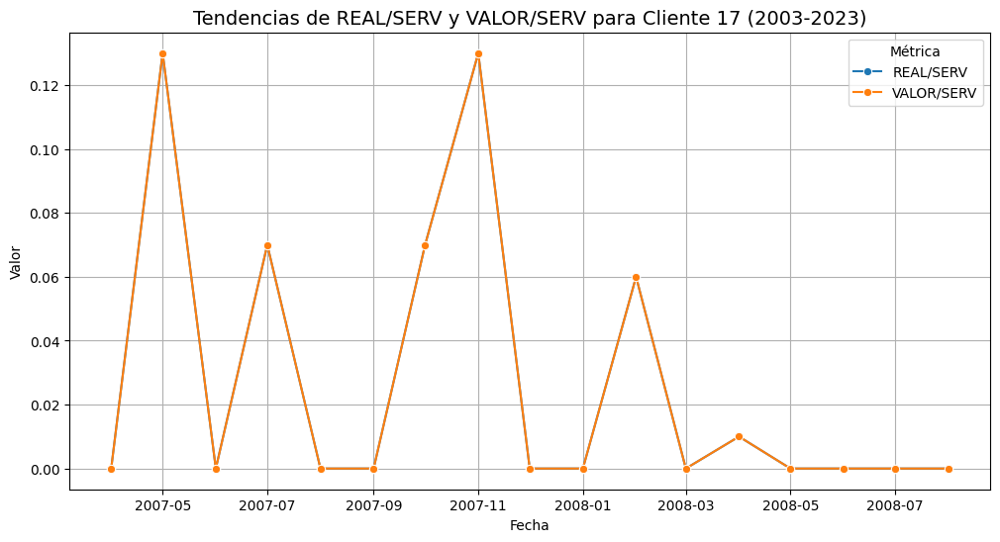

Gráfico generado para Cliente 17.


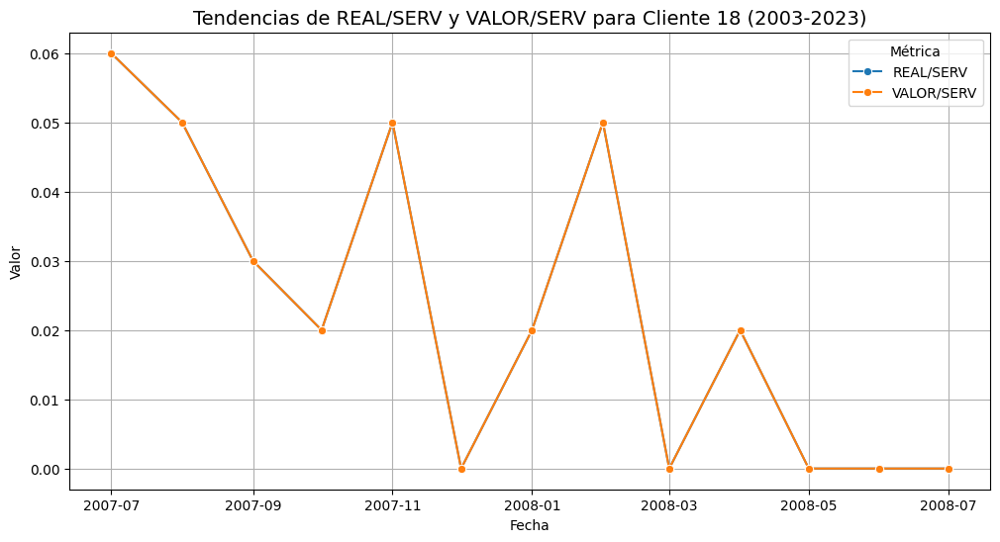

Gráfico generado para Cliente 18.


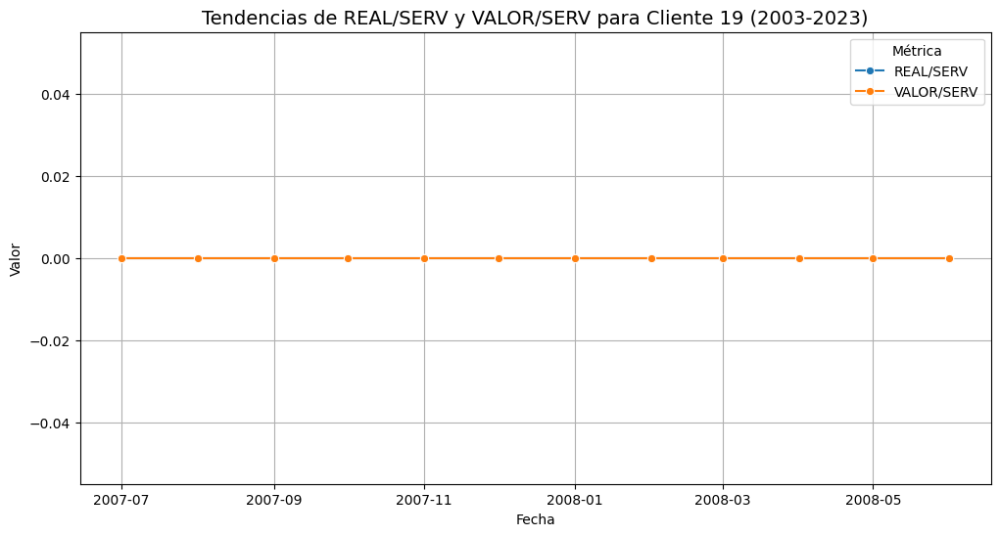

Gráfico generado para Cliente 19.


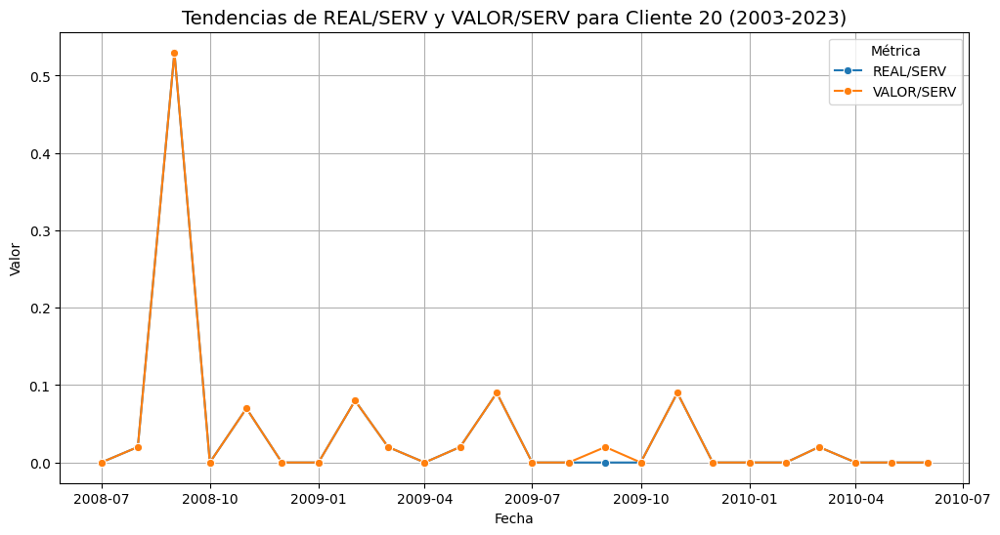

Gráfico generado para Cliente 20.


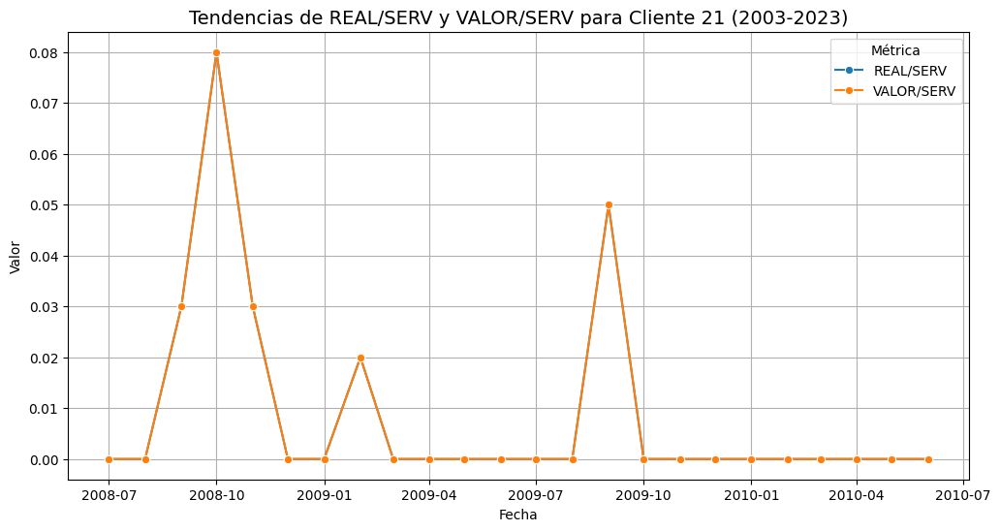

Gráfico generado para Cliente 21.


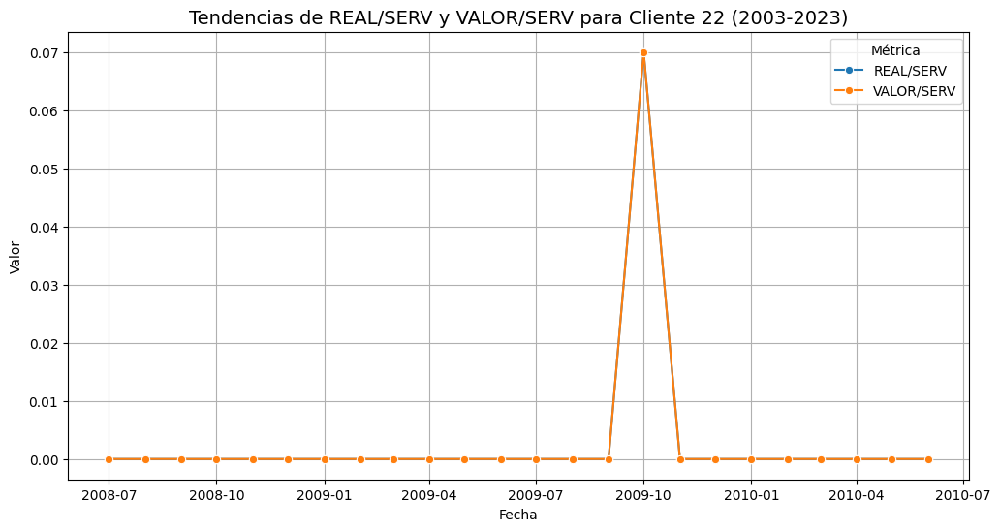

Gráfico generado para Cliente 22.


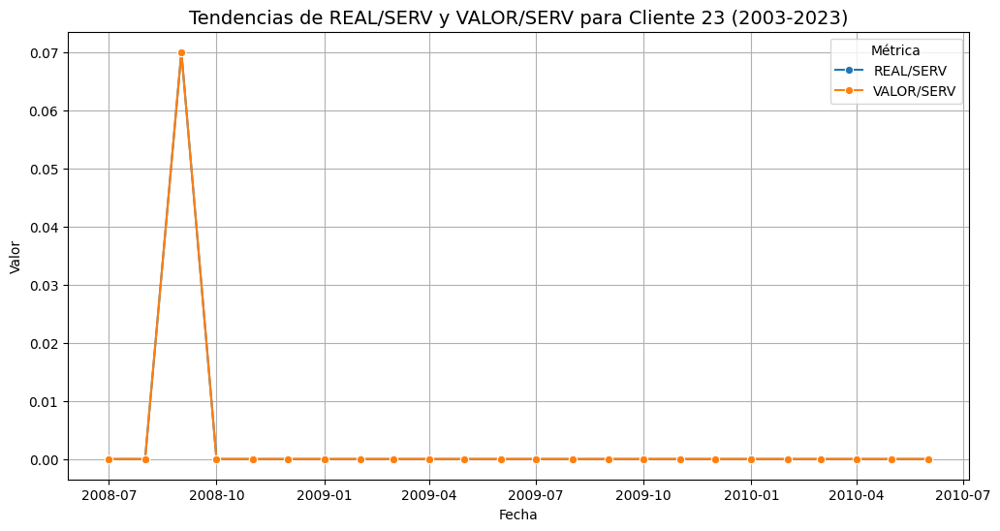

Gráfico generado para Cliente 23.


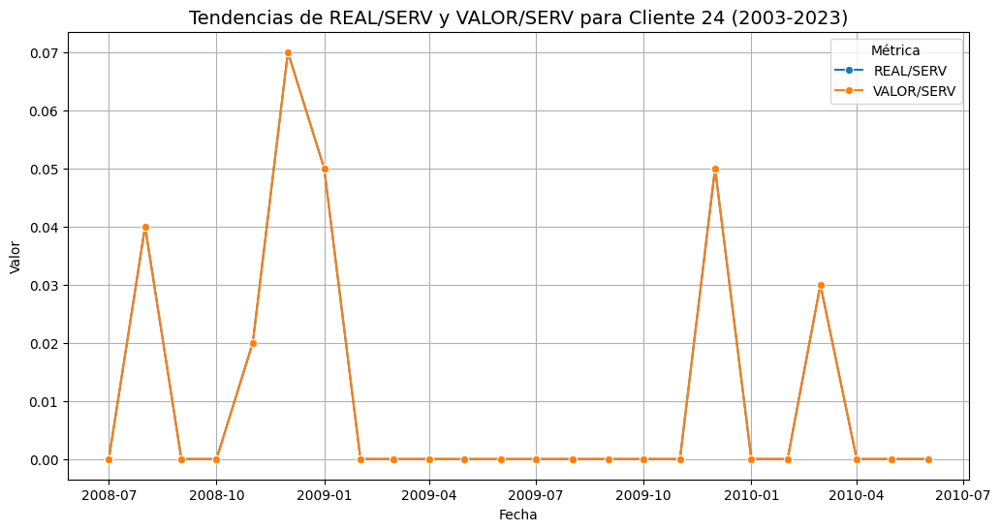

Gráfico generado para Cliente 24.


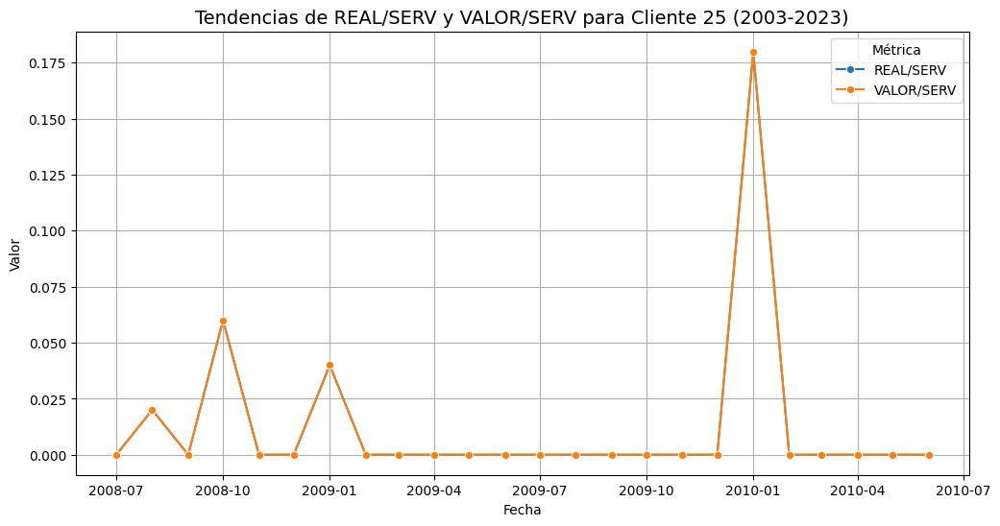

Gráfico generado para Cliente 25.


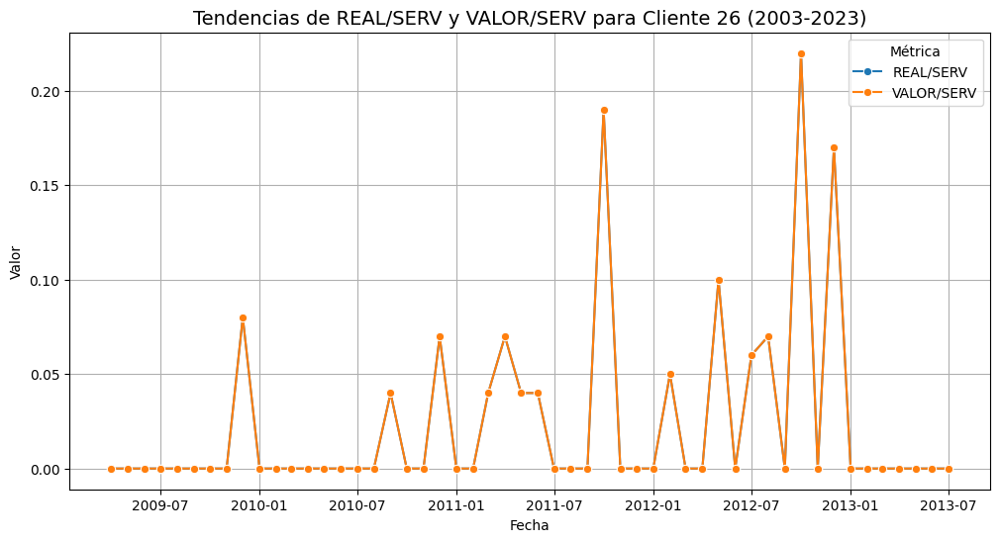

Gráfico generado para Cliente 26.


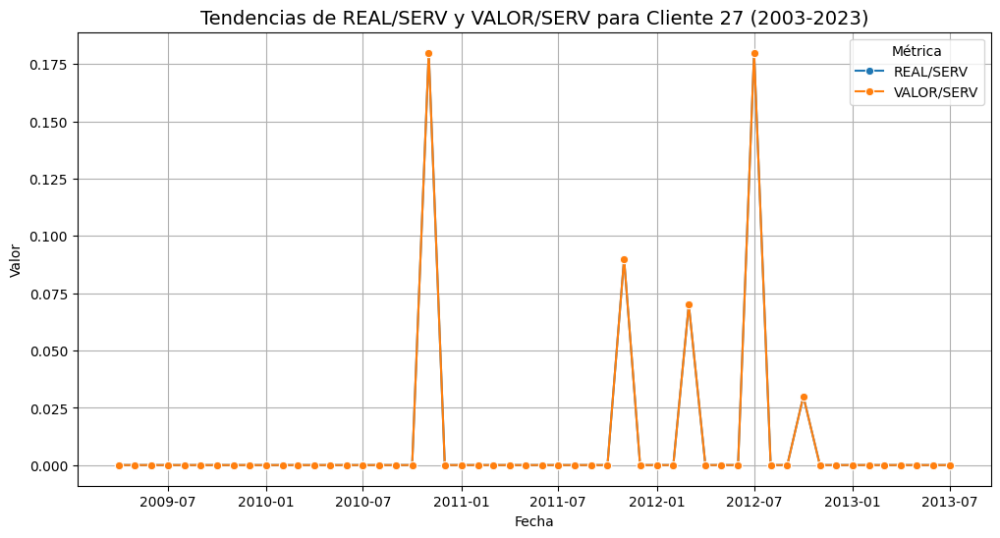

Gráfico generado para Cliente 27.


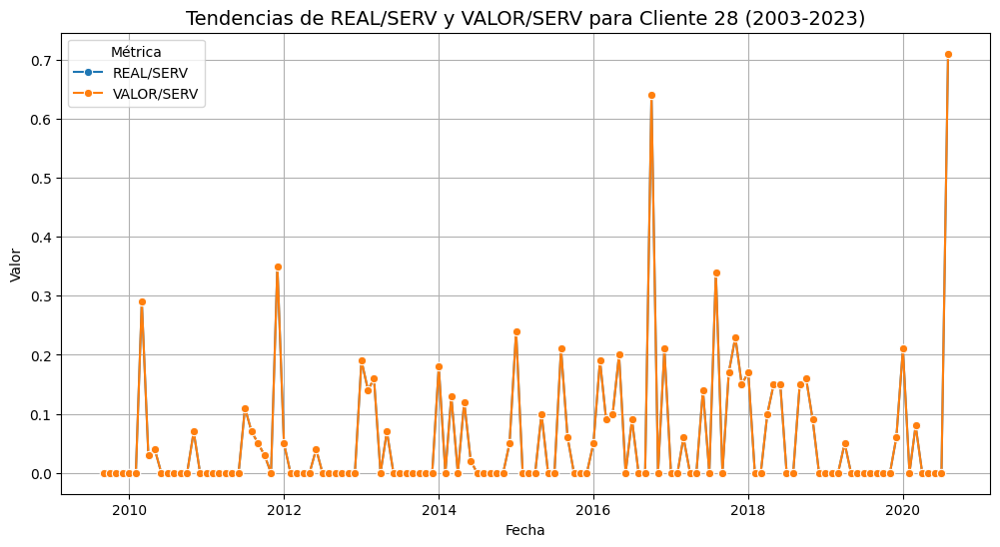

Gráfico generado para Cliente 28.


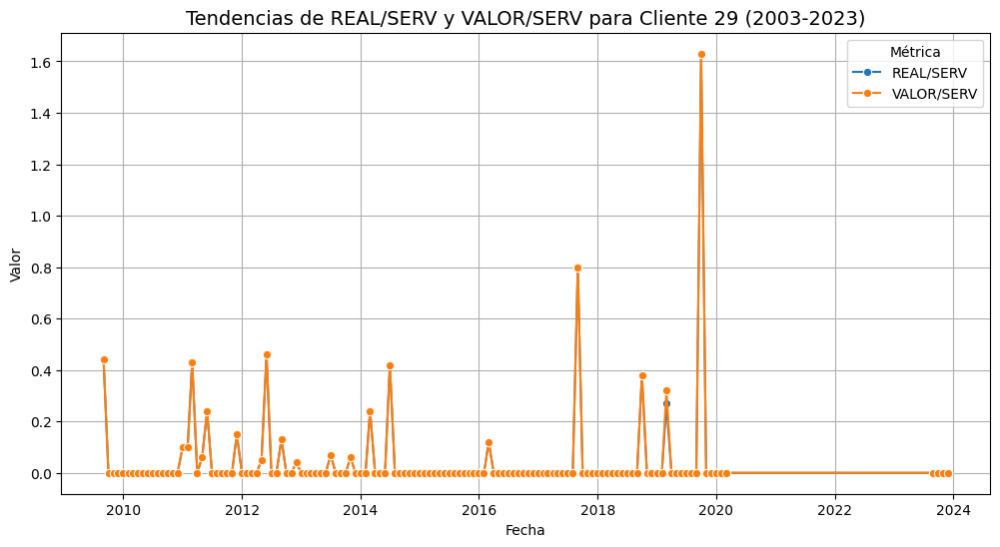

Gráfico generado para Cliente 29.


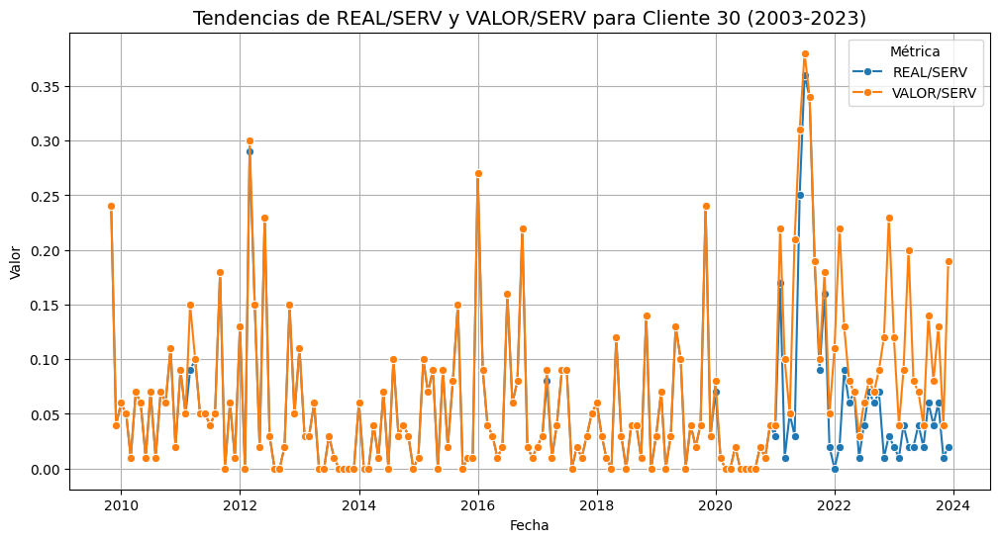

Gráfico generado para Cliente 30.


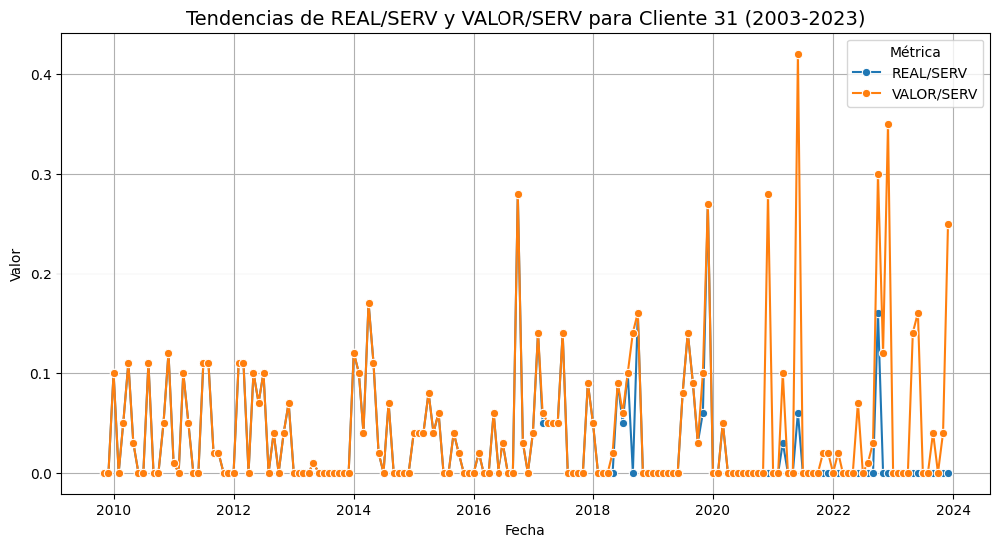

Gráfico generado para Cliente 31.


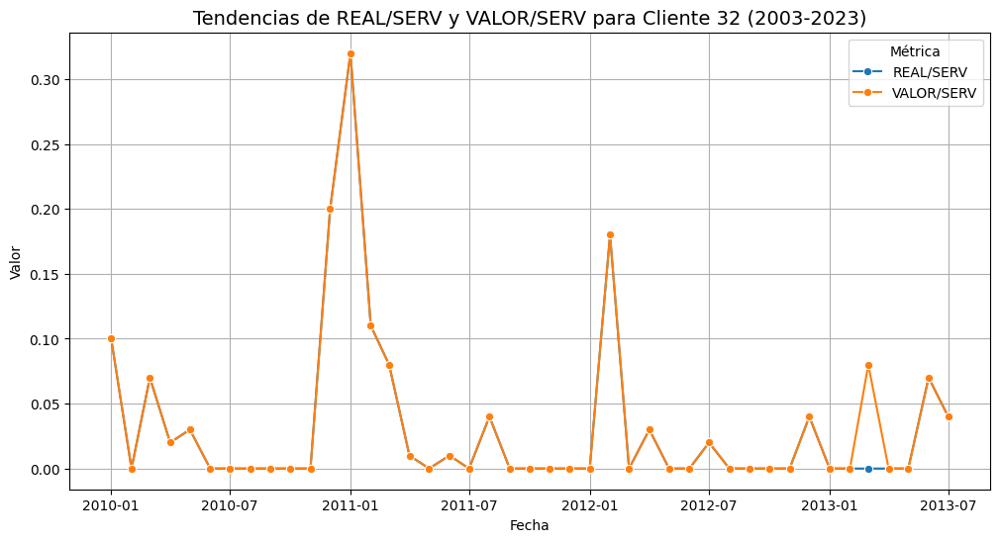

Gráfico generado para Cliente 32.


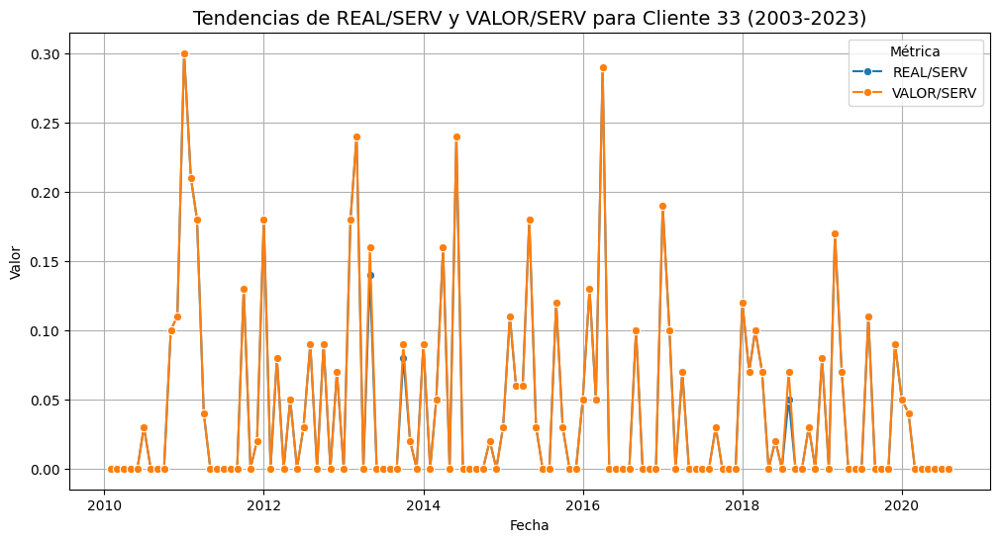

Gráfico generado para Cliente 33.
No se encontraron datos válidos para el Cliente 32.1.


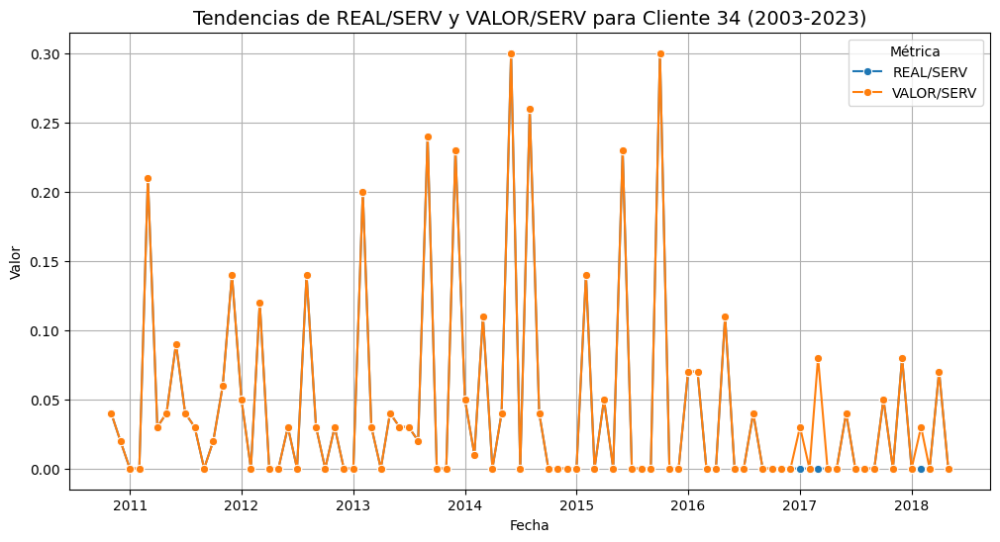

Gráfico generado para Cliente 34.


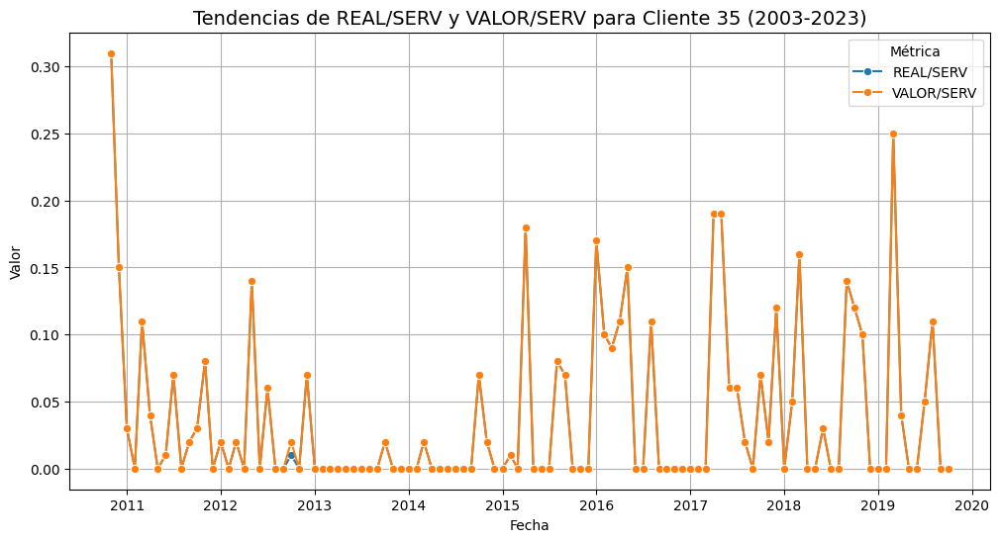

Gráfico generado para Cliente 35.


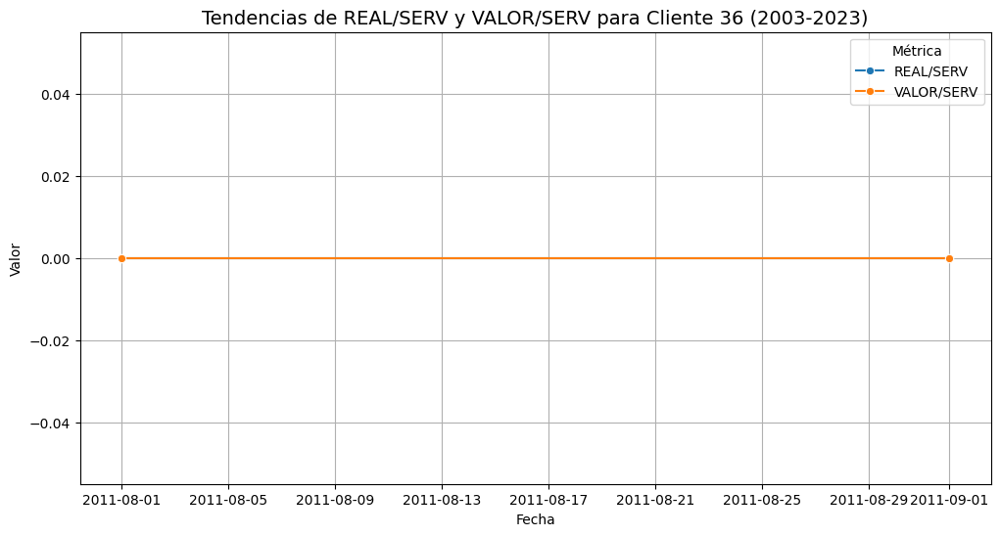

Gráfico generado para Cliente 36.


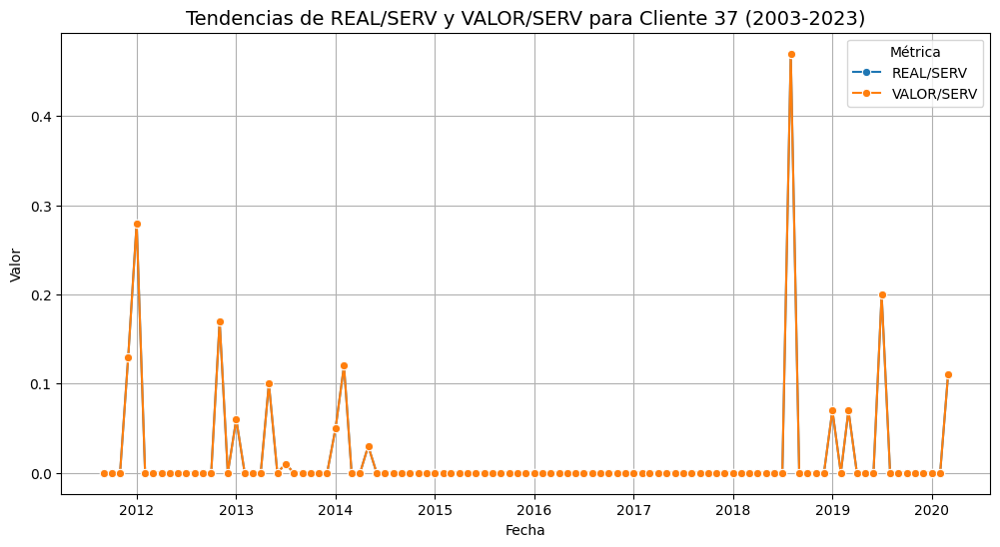

Gráfico generado para Cliente 37.


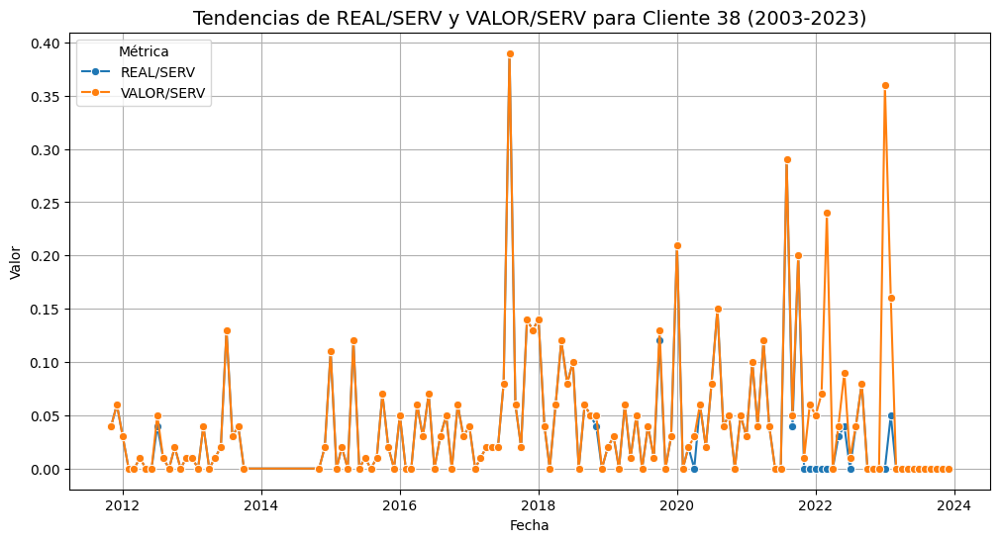

Gráfico generado para Cliente 38.


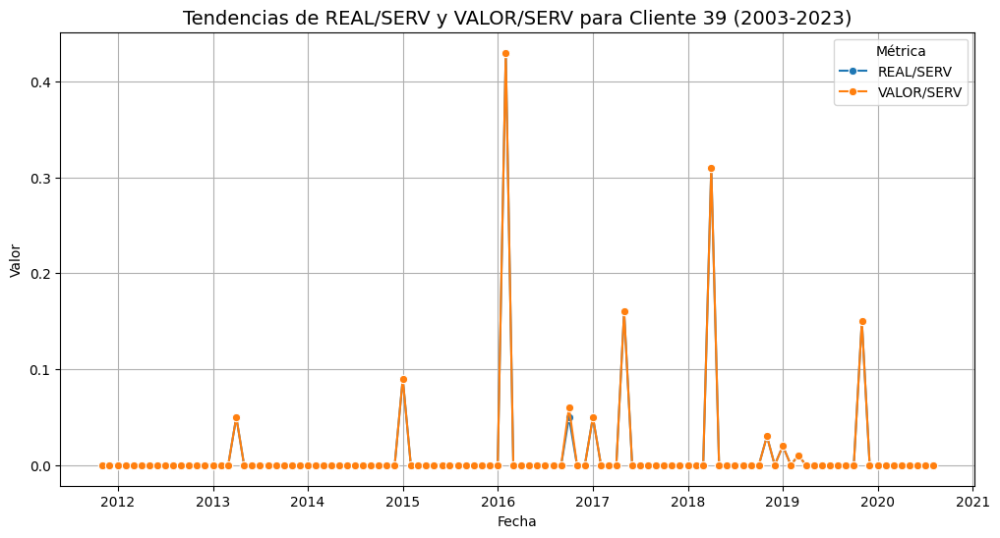

Gráfico generado para Cliente 39.


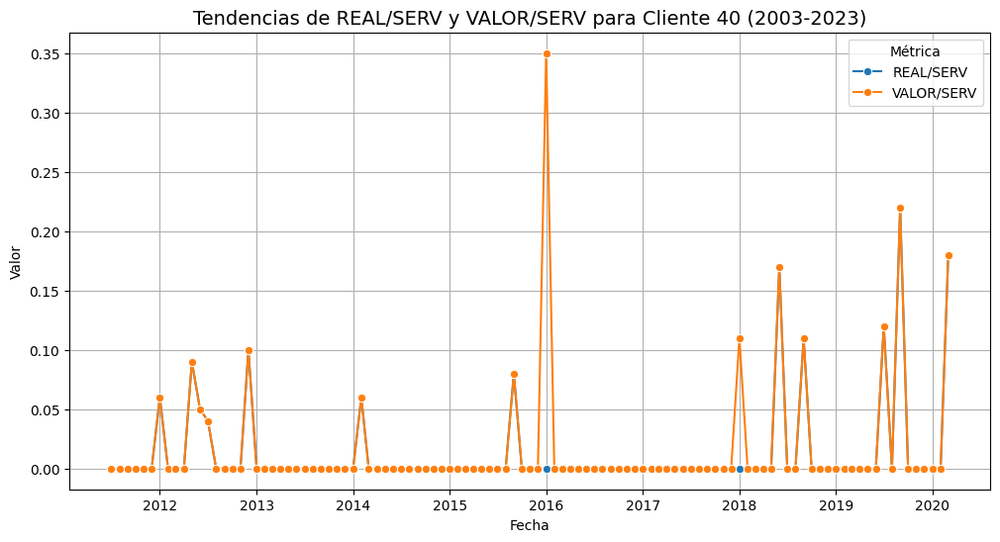

Gráfico generado para Cliente 40.


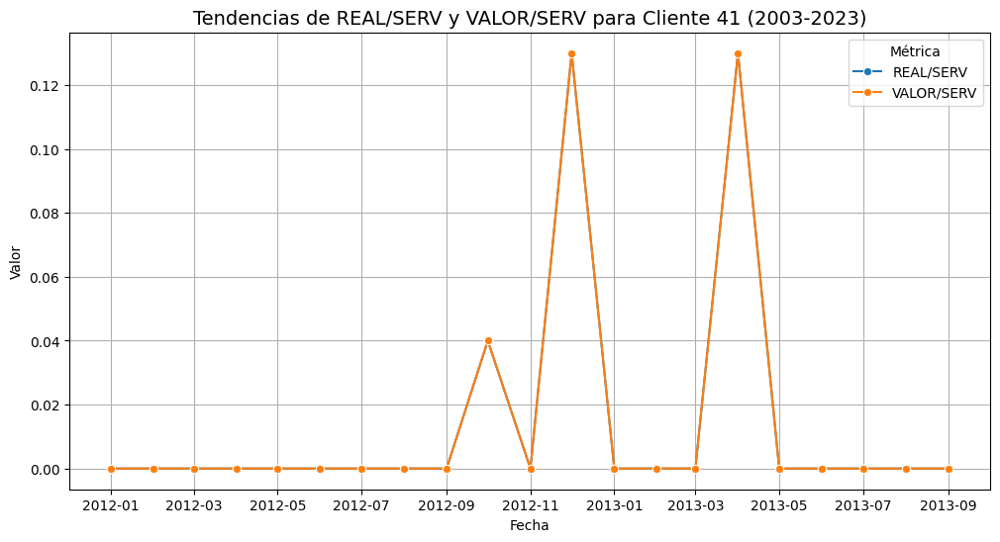

Gráfico generado para Cliente 41.


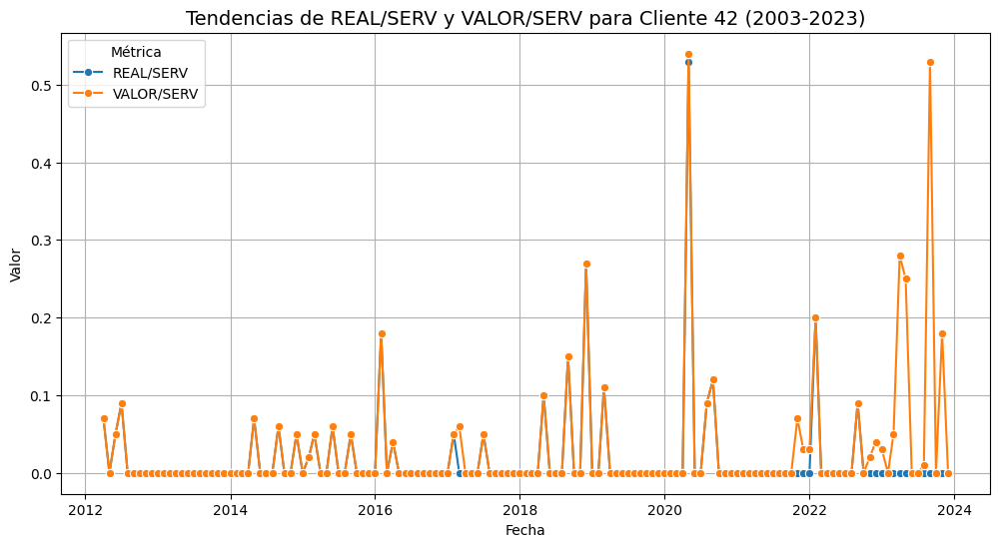

Gráfico generado para Cliente 42.


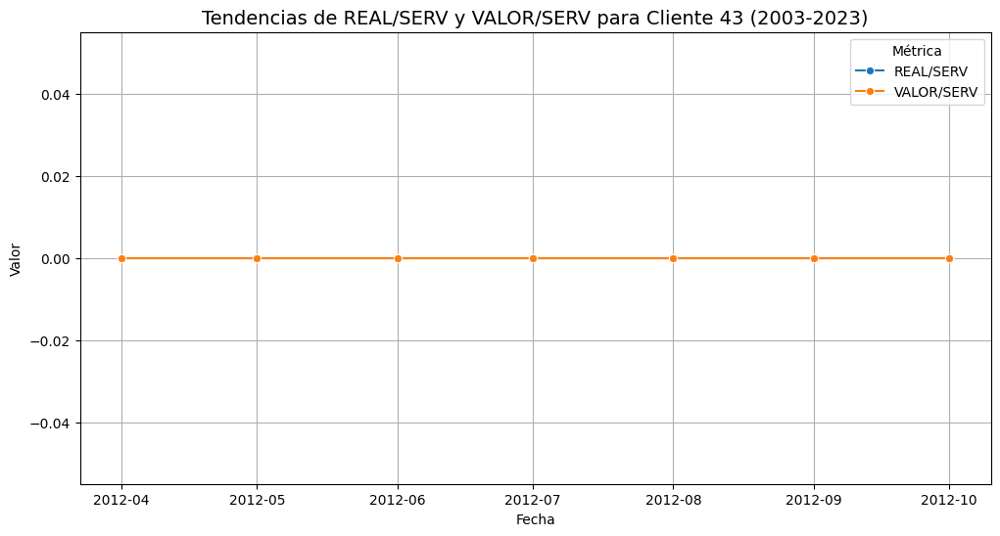

Gráfico generado para Cliente 43.


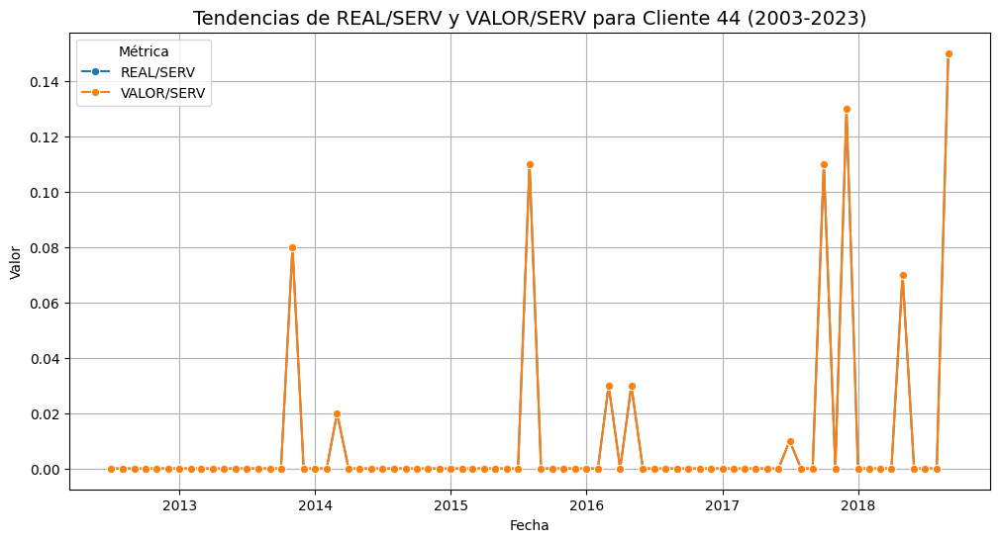

Gráfico generado para Cliente 44.


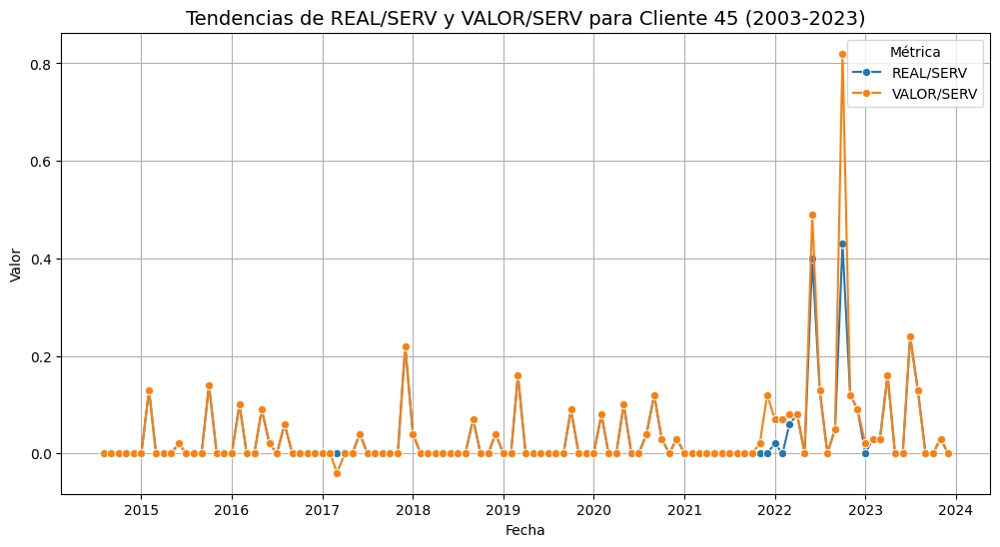

Gráfico generado para Cliente 45.


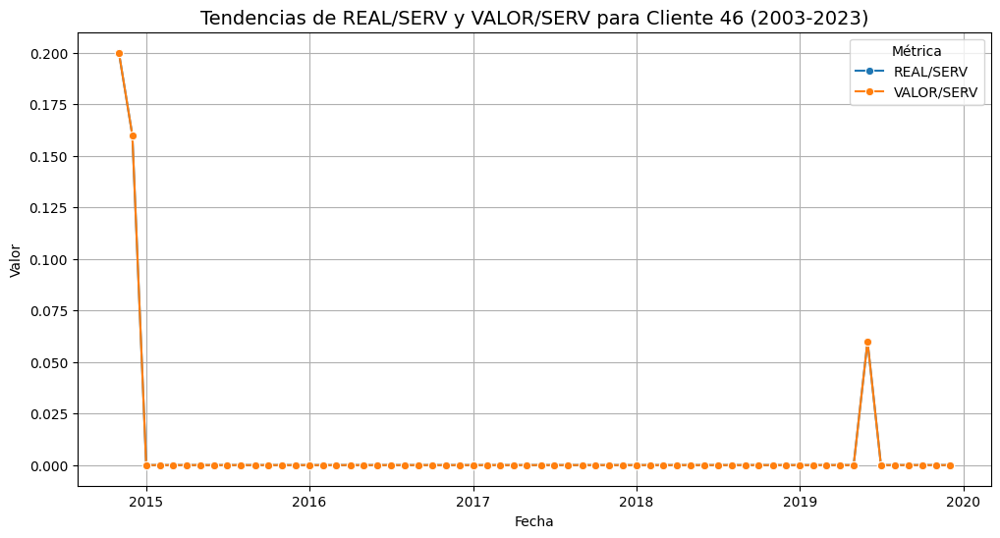

Gráfico generado para Cliente 46.


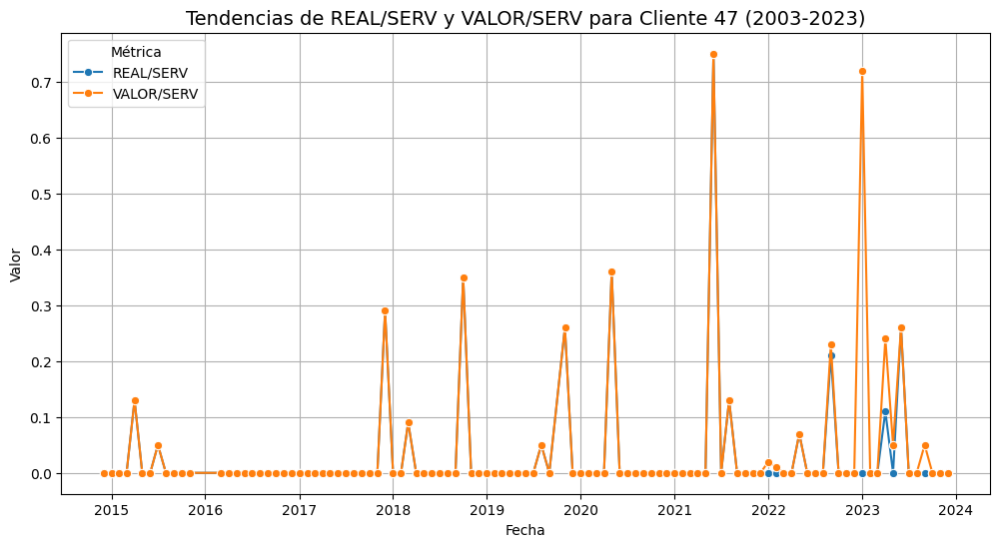

Gráfico generado para Cliente 47.


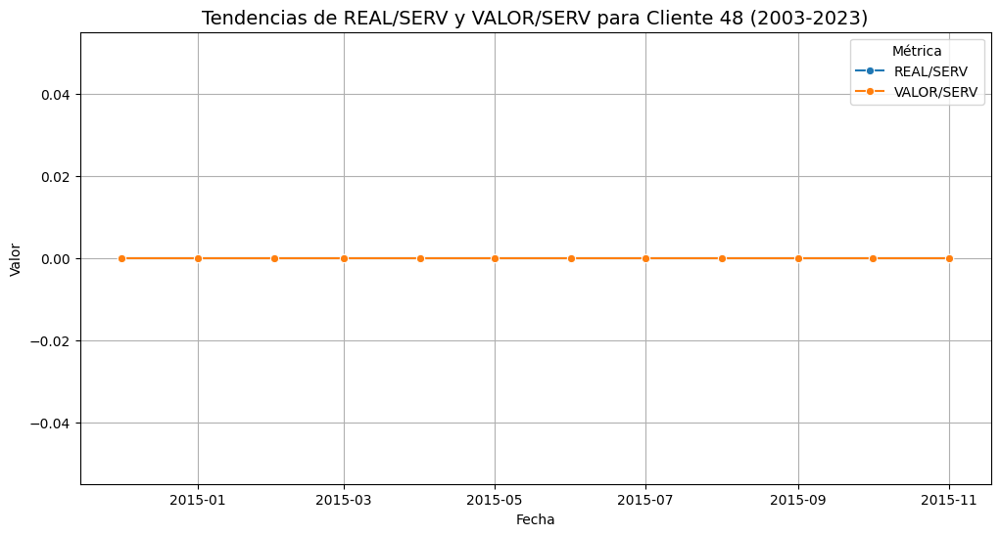

Gráfico generado para Cliente 48.


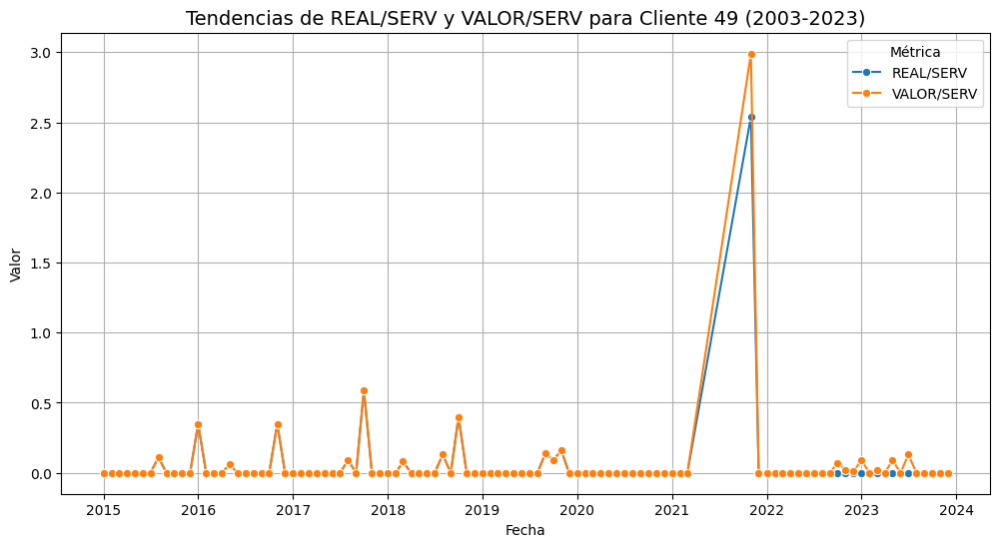

Gráfico generado para Cliente 49.


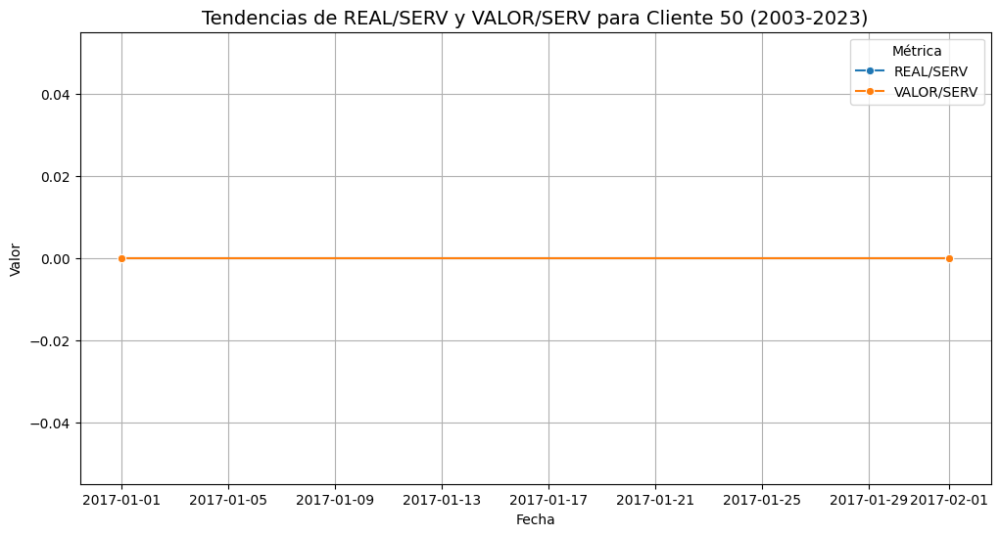

Gráfico generado para Cliente 50.


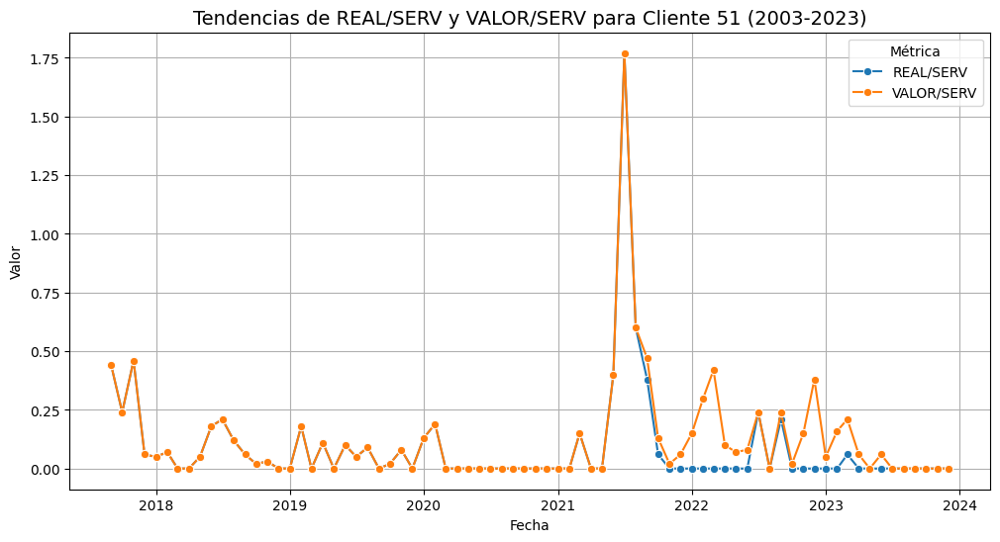

Gráfico generado para Cliente 51.


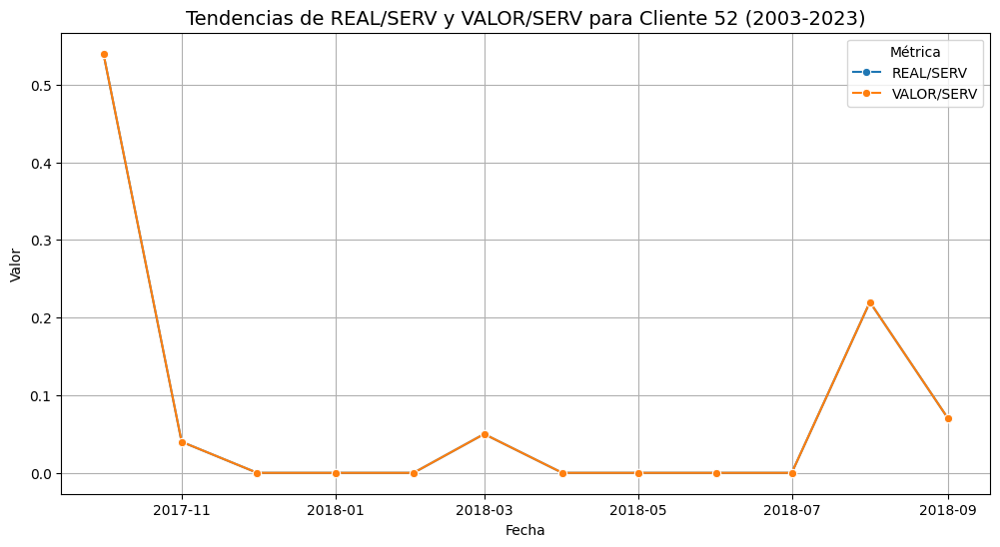

Gráfico generado para Cliente 52.


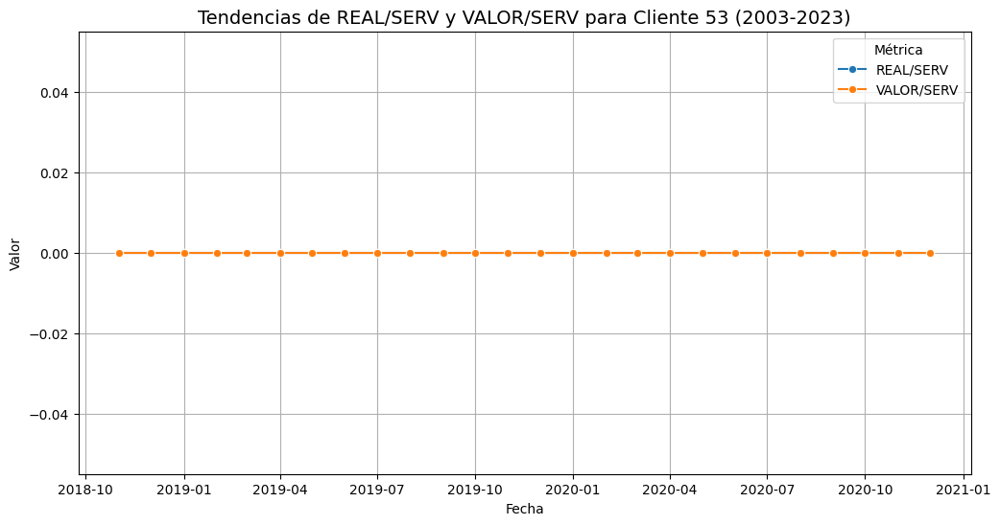

Gráfico generado para Cliente 53.


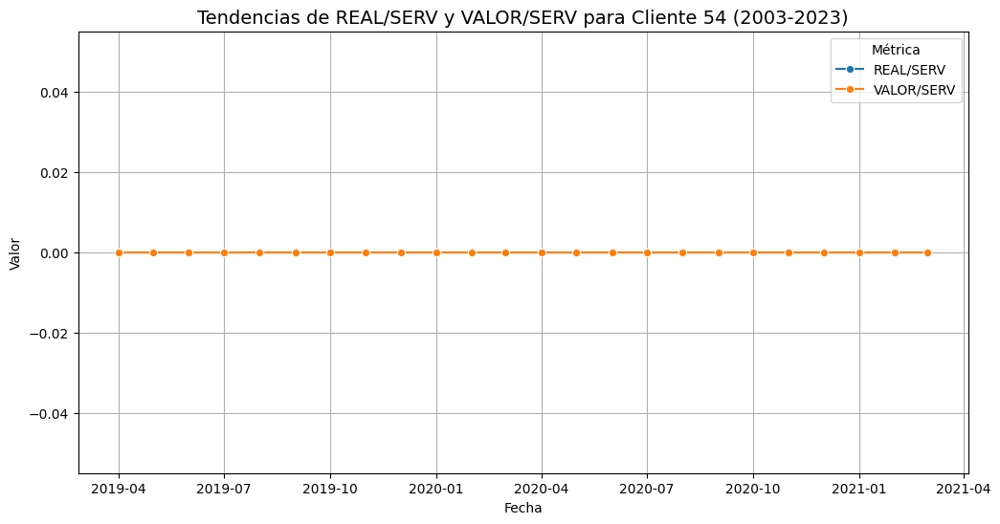

Gráfico generado para Cliente 54.


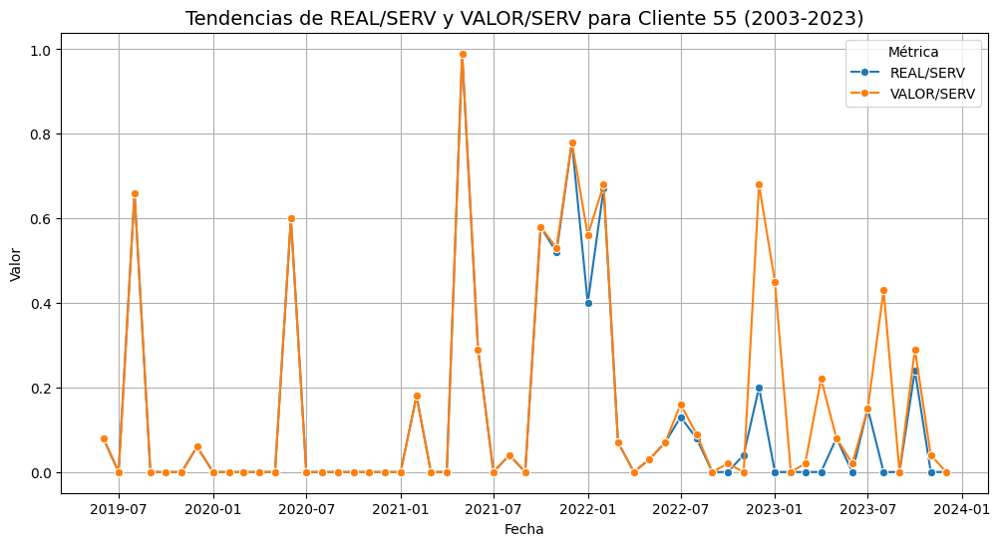

Gráfico generado para Cliente 55.


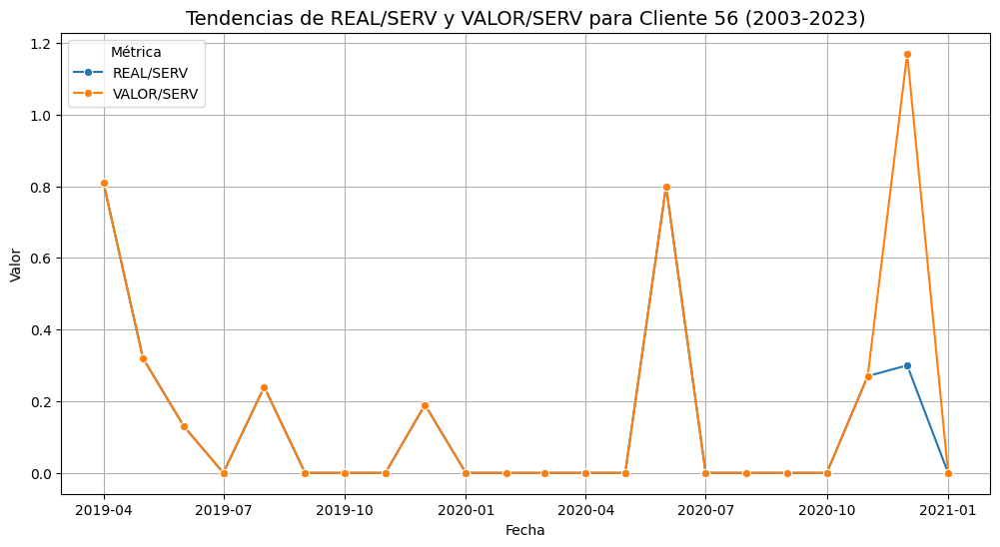

Gráfico generado para Cliente 56.


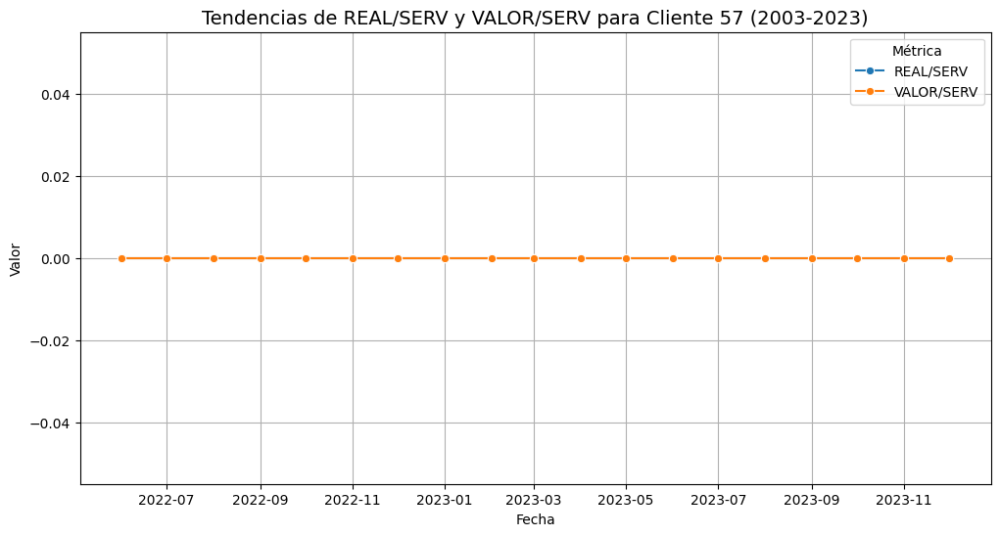

Gráfico generado para Cliente 57.


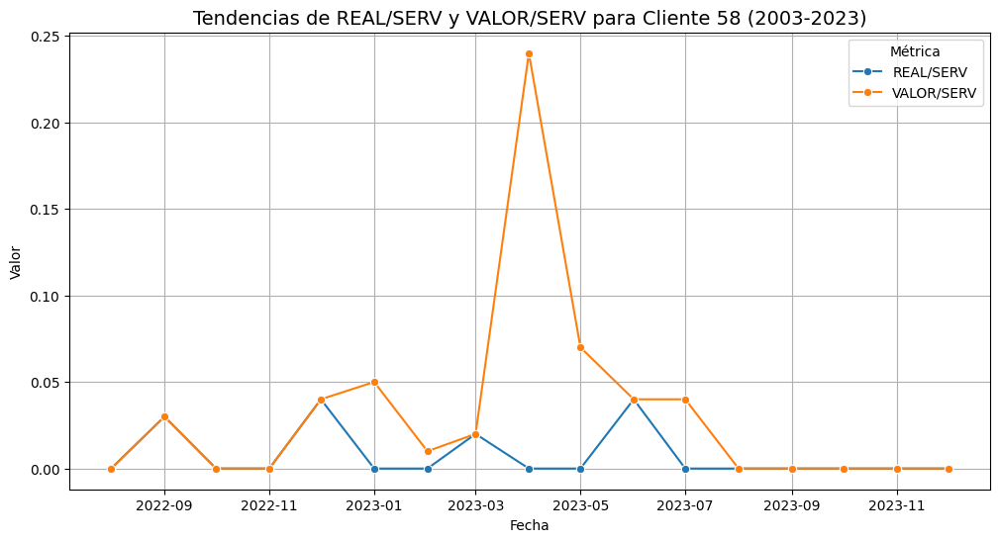

Gráfico generado para Cliente 58.


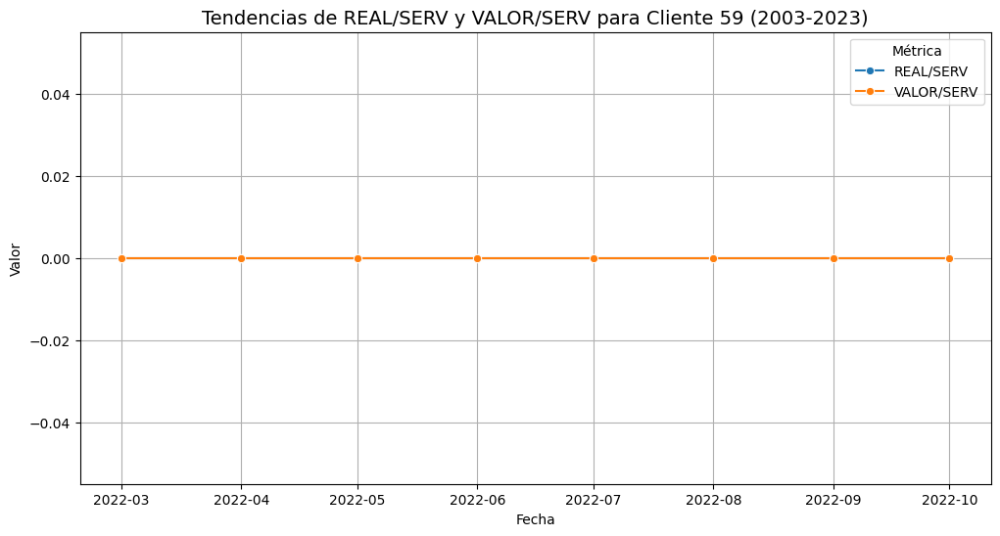

Gráfico generado para Cliente 59.


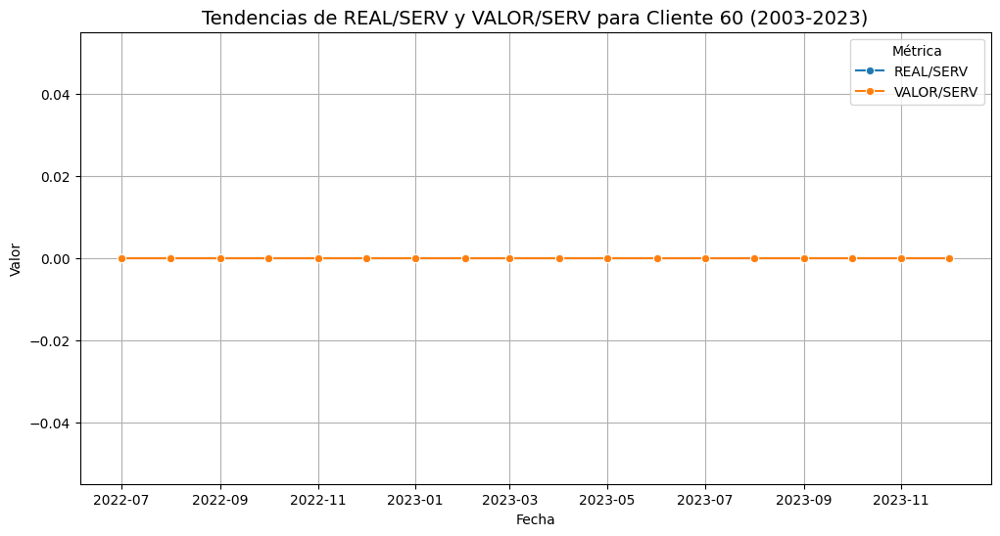

Gráfico generado para Cliente 60.


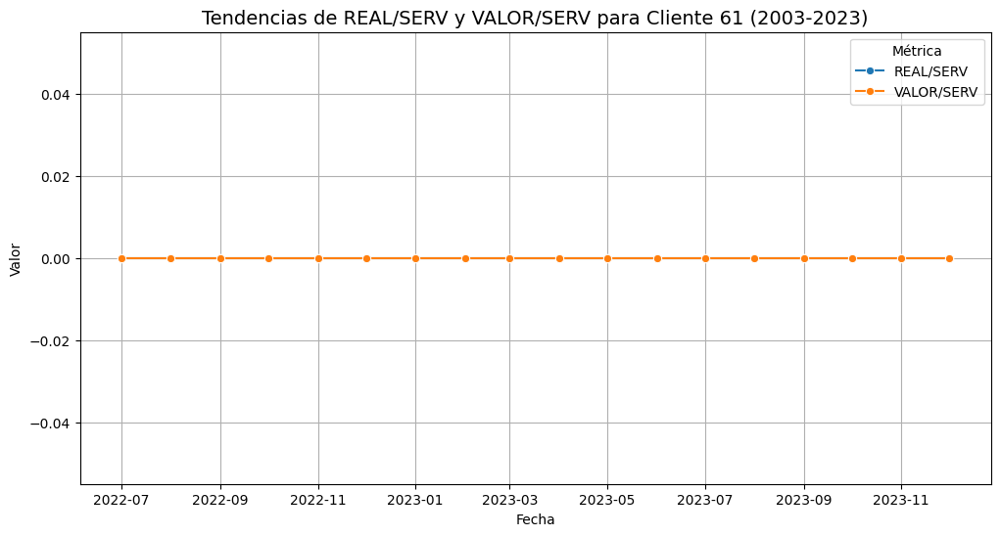

Gráfico generado para Cliente 61.


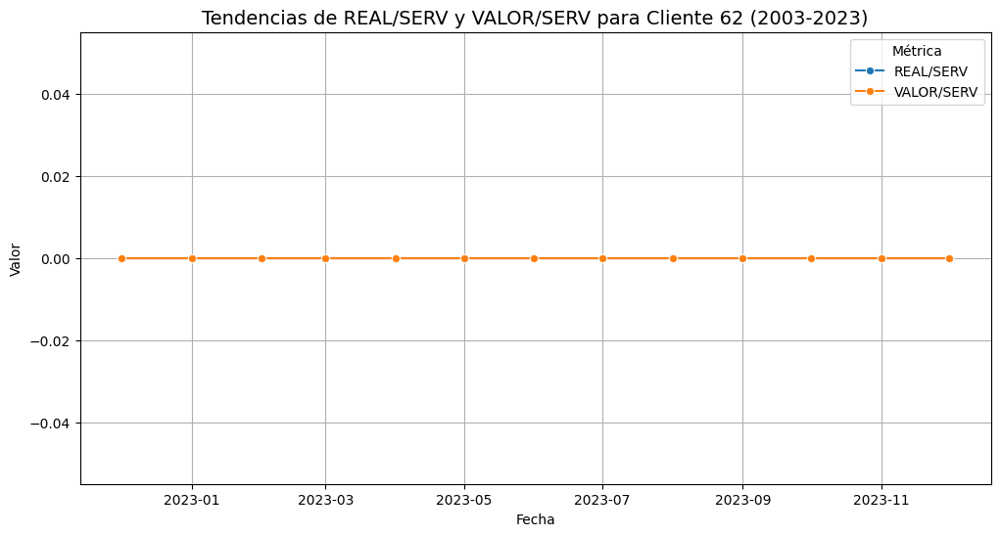

Gráfico generado para Cliente 62.


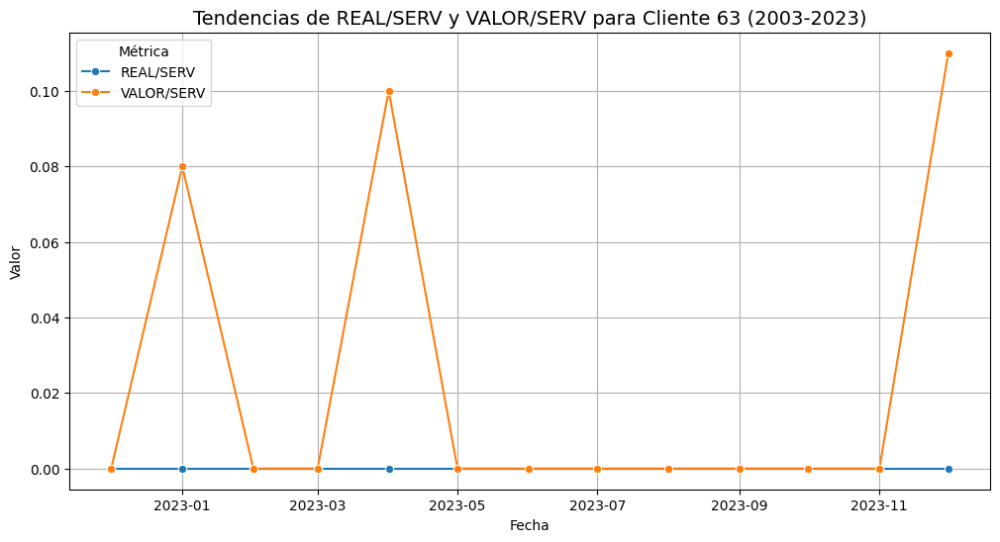

Gráfico generado para Cliente 63.


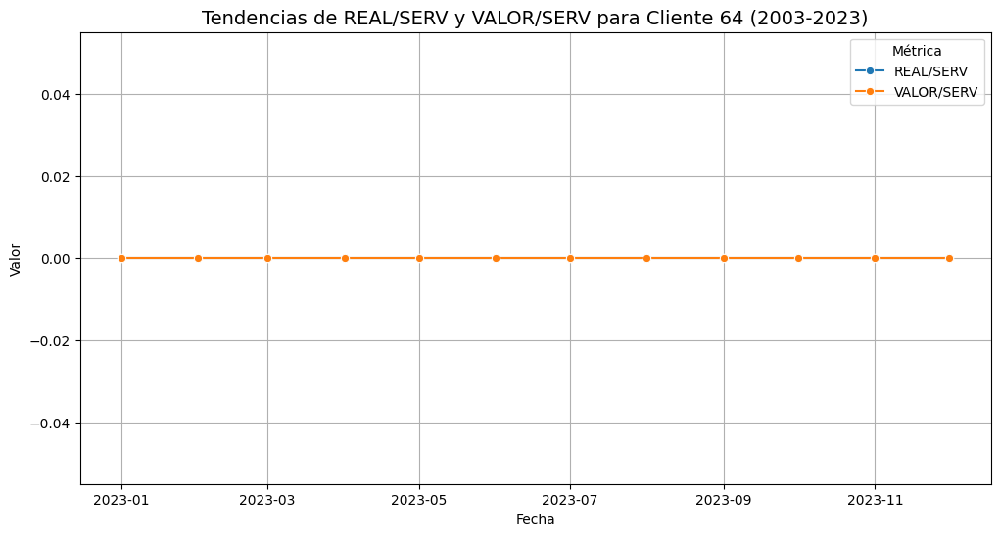

Gráfico generado para Cliente 64.


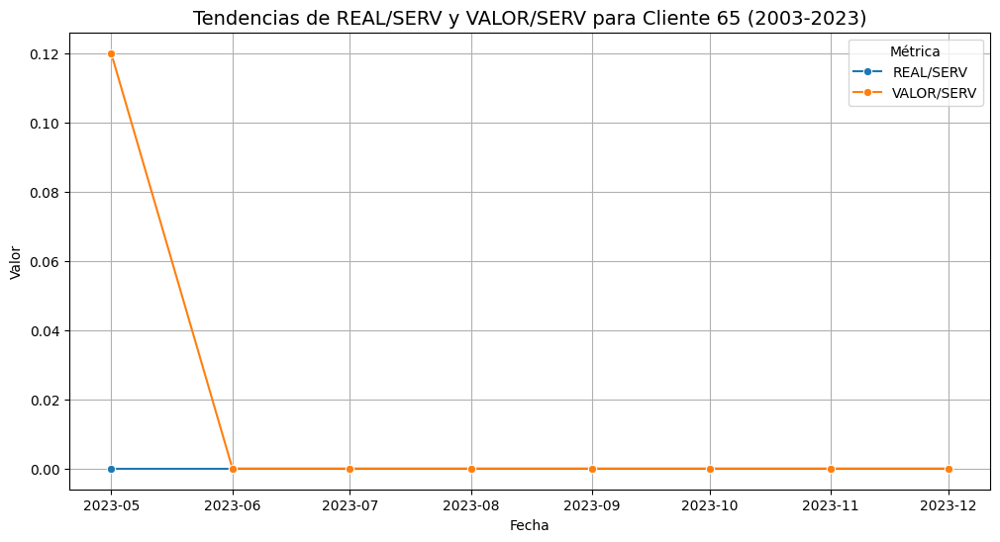

Gráfico generado para Cliente 65.


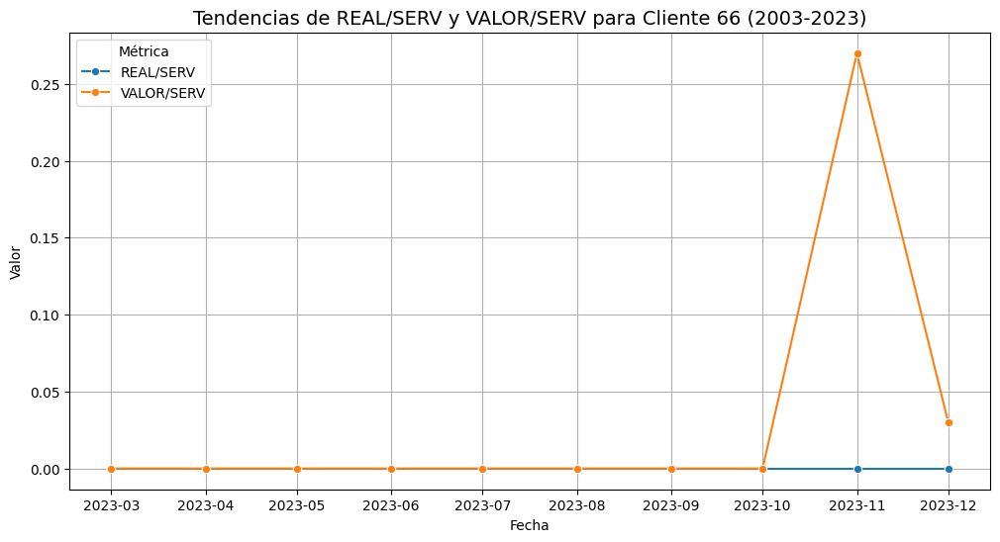

Gráfico generado para Cliente 66.


In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# Iterar sobre todos los clientes únicos
clientes_unicos = data_larga['Cliente'].unique()

for cliente in clientes_unicos:
    # Filtrar datos para el cliente actual y las métricas relevantes
    cliente_data = data_larga[
        (data_larga['Cliente'] == cliente) &
        (data_larga['Métrica'].isin(['REAL/SERV', 'VALOR/SERV']))  # Filtrar métricas específicas
    ]
    
    # Continuar solo si hay datos válidos
    if cliente_data.empty:
        print(f"No se encontraron datos válidos para el Cliente {cliente}.")
        continue

    # Crear el gráfico
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=cliente_data, x='Date', y='Valor', hue='Métrica', marker='o')
    plt.title(f'Tendencias de REAL/SERV y VALOR/SERV para Cliente {cliente} (2003-2023)', fontsize=14)
    plt.xlabel('Fecha')
    plt.ylabel('Valor')
    plt.legend(title='Métrica')
    plt.grid()

    # Mostrar el gráfico
    plt.show()

    print(f"Gráfico generado para Cliente {cliente}.")


------------------

## 5. Confirmar estructura de la tabla limpia: ##

In [21]:
# Validar estructura de la tabla larga tras la limpieza
print("\nEstructura de la tabla:")
print(data_larga.info())  # Información de tipos de datos y nulos
print("\nVista previa de los datos:")
print(data_larga.head(5))  # Mostrar primeras 5 filas



Estructura de la tabla:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66780 entries, 0 to 66779
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Date     60420 non-null  datetime64[ns]
 1   Cliente  66780 non-null  object        
 2   Métrica  66780 non-null  object        
 3   Valor    16122 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 2.0+ MB
None

Vista previa de los datos:
        Date Cliente Métrica  Valor
0 2003-01-01       1    REAL  18.65
1 2003-02-01       1    REAL   5.90
2 2003-03-01       1    REAL   0.00
3 2003-04-01       1    REAL   0.00
4 2003-05-01       1    REAL   0.00


------------------------

## 6. Guardar y verificar la tabla larga ##


In [22]:
# Guardar la tabla larga en un archivo CSV
output_file = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv"

data_larga.to_csv(output_file, index=False, encoding="utf-8")
print(f"Archivo guardado correctamente en: {output_file}")

# Verificar la carga del archivo guardado
print("\nVerificando el archivo guardado...")
df_verificar = pd.read_csv(output_file)
print("Primeras 5 filas del archivo verificado:")
print(df_verificar.head())


Archivo guardado correctamente en: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv

Verificando el archivo guardado...
Primeras 5 filas del archivo verificado:
         Date  Cliente Métrica  Valor
0  2003-01-01      1.0    REAL  18.65
1  2003-02-01      1.0    REAL   5.90
2  2003-03-01      1.0    REAL   0.00
3  2003-04-01      1.0    REAL   0.00
4  2003-05-01      1.0    REAL   0.00


In [23]:
# Verificar el archivo CSV guardado
df_verificar = pd.read_csv(output_file)
print(df_verificar.head())


         Date  Cliente Métrica  Valor
0  2003-01-01      1.0    REAL  18.65
1  2003-02-01      1.0    REAL   5.90
2  2003-03-01      1.0    REAL   0.00
3  2003-04-01      1.0    REAL   0.00
4  2003-05-01      1.0    REAL   0.00


In [24]:
print("\nEstructura del archivo guardado:")
print(df_verificar.info())



Estructura del archivo guardado:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66780 entries, 0 to 66779
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Date     60420 non-null  object 
 1   Cliente  66780 non-null  float64
 2   Métrica  66780 non-null  object 
 3   Valor    16122 non-null  float64
dtypes: float64(2), object(2)
memory usage: 2.0+ MB
None


-------------------------

## 7. Importar la tabla larga a SQL Server ##

La tabla larga generada en Python será importada a una base de datos en SQL Server. Para esto, se utiliza la biblioteca `pyodbc` para establecer la conexión con SQL Server y cargar los datos desde el archivo CSV.

Esto permite realizar consultas estructuradas y análisis avanzado directamente en SQL Server.


In [25]:
pip install pyodbc sqlalchemy


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [26]:
from sqlalchemy import create_engine

# Configuración de la conexión
server = "DESKTOP-UFKKV4B\\SQLEXPRESS"
database = "Ideas en Verde Historical Records"

# Crear el motor de conexión utilizando SQLAlchemy con autenticación integrada
engine = create_engine(
    f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&Trusted_Connection=yes"
)


In [27]:
import pandas as pd
from sqlalchemy import create_engine

# Ruta al archivo CSV
csv_file = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv"

# Leer el archivo CSV
data_larga = pd.read_csv(csv_file)

# Configurar la conexión a SQL Server
server = "DESKTOP-UFKKV4B\\SQLEXPRESS"  # Tu servidor
database = "Ideas en Verde Historical Records"  # Nombre de la base de datos

# Crear el motor de conexión utilizando SQLAlchemy con autenticación integrada
engine = create_engine(
    f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&Trusted_Connection=yes"
)

# Nombre de la tabla en SQL Server
table_name = "tabla_larga"

# Cargar los datos en SQL Server
try:
    data_larga.to_sql(table_name, con=engine, if_exists='replace', index=False)
    print(f"Datos importados exitosamente a la tabla '{table_name}' en la base de datos '{database}'.")
except Exception as e:
    print(f"Error al importar los datos: {e}")


Datos importados exitosamente a la tabla 'tabla_larga' en la base de datos 'Ideas en Verde Historical Records'.


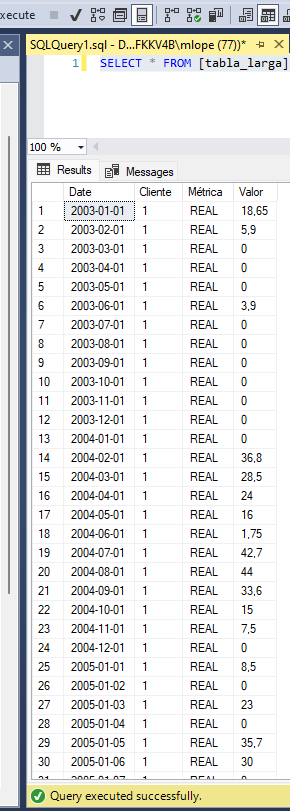

---------------------

## 8. Integración con Power BI: ##

6.1. Conexión de Power BI a SQL Server
Para integrar los datos procesados con Power BI, seguí los siguientes pasos:

Abrí Power BI Desktop
Inicié Power BI Desktop en mi computadora para conectar los datos procesados.

Conecté Power BI a la base de datos SQL Server

En Power BI, seleccioné "Obtener datos" → "SQL Server".
Configuré la conexión con los siguientes datos:
Servidor: DESKTOP-UFKKV4B\SQLEXPRESS
Base de datos: Ideas en Verde Historical Records
Modo de conexión: Elegí "DirectQuery" para trabajar con datos en tiempo real.
Importé la tabla tabla_larga
Una vez establecida la conexión, seleccioné la tabla tabla_larga y la cargué en el modelo de Power BI para su análisis.

6.2. Verificación de los Datos Importados
En el Panel de Datos de Power BI, verifiqué que las columnas Date, Cliente, Métrica, y Valor se hayan importado correctamente, manteniendo la estructura generada en Python.

Notas finales sobre la integración con Power BI
La integración con Power BI me permitió crear un flujo completo de análisis de datos, desde la carga y transformación hasta la visualización y la actualización automatizada. Opté por usar DirectQuery para garantizar análisis en tiempo real, aunque también consideré el modo Importar para mejorar el rendimiento en consultas más pesadas.

-------cambiar desde aquí--------------

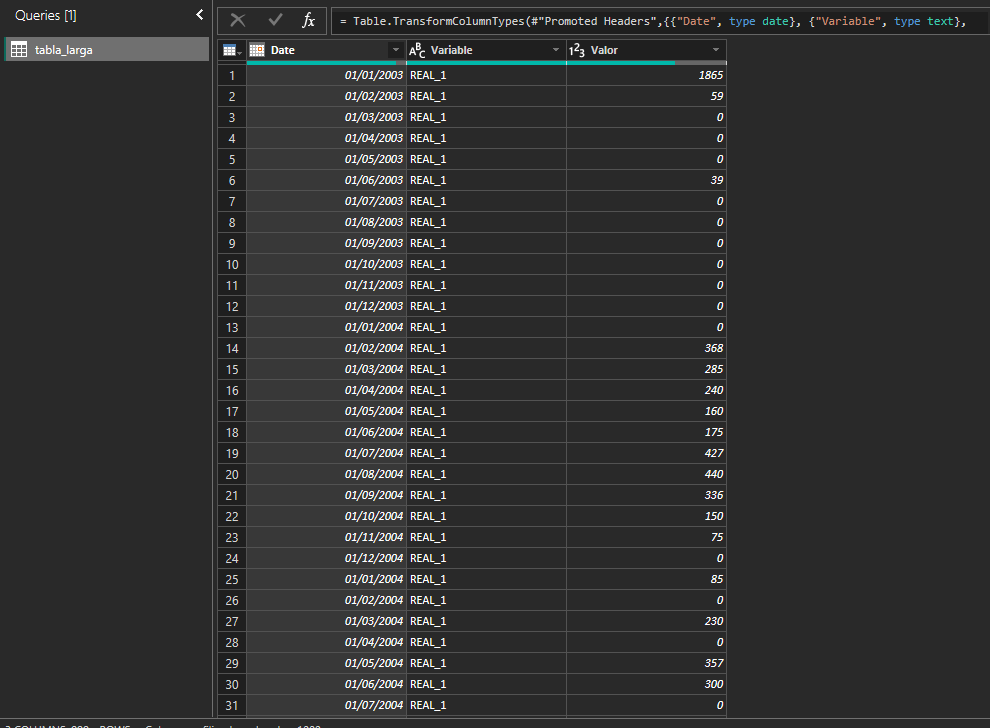

----------------

In [28]:
data_larga = pd.read_csv(
    "C:\\Users\\mlope\\OneDrive\\Escritorio\\MLopezCastro\\Ideas en Verde - Historical Records\\Data Base Cleaned\\tabla_larga\\tabla_larga.csv",
    decimal=','
)


Resolví un problema de configuración de cómo se representaban los valores, desde Power BI Desktop - Power Query

--------------

## Gráfico preliminar de Cliente 1: ##

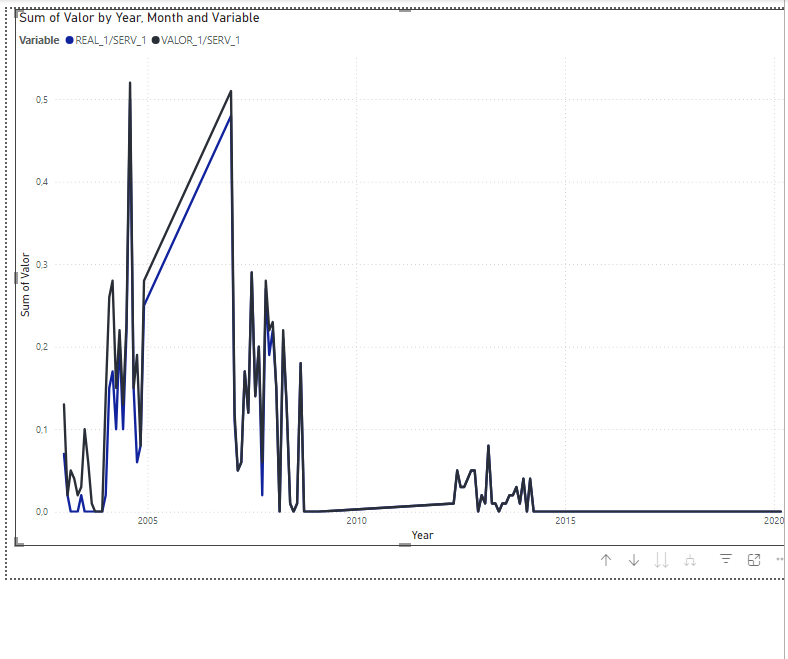

In [29]:
# Asegurarnos de que la columna Date esté en formato datetime
data_larga['Date'] = pd.to_datetime(data_larga['Date'], errors='coerce')

# Filtrar los años 2005 y 2006
data_2005_2006 = data_larga[(data_larga['Date'].dt.year == 2005) | (data_larga['Date'].dt.year == 2006)]

# Mostrar un resumen de los datos filtrados
print("Datos para los años 2005 y 2006:")
print(data_2005_2006.head(20))  # Mostrar las primeras 20 filas
print("\nCantidad de registros por año:")
print(data_2005_2006['Date'].dt.year.value_counts())

# Verificar si hay valores nulos en columnas importantes
print("\nValores nulos en las columnas principales:")
print(data_2005_2006.isnull().sum())


Datos para los años 2005 y 2006:
Empty DataFrame
Columns: [Date, Cliente, Métrica, Valor]
Index: []

Cantidad de registros por año:
Series([], Name: count, dtype: int64)

Valores nulos en las columnas principales:
Date       0
Cliente    0
Métrica    0
Valor      0
dtype: int64


In [30]:
print("Columnas actuales en 'data_larga':")
print(data_larga.columns)


Columnas actuales en 'data_larga':
Index(['Date', 'Cliente', 'Métrica', 'Valor'], dtype='object')


In [31]:
# Filtrar los datos para Cliente 1 en 2005 y 2006
data_cliente1_2005_2006 = data_larga[
    ((data_larga['Date'].dt.year == 2005) | (data_larga['Date'].dt.year == 2006)) &
    (data_larga['Métrica'].str.contains('REAL_1|VALOR_1'))
]

# Mostrar los datos filtrados
print("\nDatos del Cliente 1 para 2005 y 2006:")
print(data_cliente1_2005_2006)



Datos del Cliente 1 para 2005 y 2006:
Empty DataFrame
Columns: [Date, Cliente, Métrica, Valor]
Index: []


In [32]:
# Mostrar todas las fechas únicas para verificar problemas de formato
print("Fechas únicas en el dataset:")
print(data_larga['Date'].unique())

# Buscar registros donde el año no se pudo detectar correctamente
print("\nRegistros con fechas nulas o mal formateadas:")
print(data_larga[data_larga['Date'].isnull()])


Fechas únicas en el dataset:
<DatetimeArray>
['2003-01-01 00:00:00', '2003-02-01 00:00:00', '2003-03-01 00:00:00',
 '2003-04-01 00:00:00', '2003-05-01 00:00:00', '2003-06-01 00:00:00',
 '2003-07-01 00:00:00', '2003-08-01 00:00:00', '2003-09-01 00:00:00',
 '2003-10-01 00:00:00',
 ...
 '2023-03-01 00:00:00', '2023-04-01 00:00:00', '2023-05-01 00:00:00',
 '2023-06-01 00:00:00', '2023-07-01 00:00:00', '2023-08-01 00:00:00',
 '2023-09-01 00:00:00', '2023-10-01 00:00:00', '2023-11-01 00:00:00',
 '2023-12-01 00:00:00']
Length: 229, dtype: datetime64[ns]

Registros con fechas nulas o mal formateadas:
      Date Cliente     Métrica Valor
24     NaT       1        REAL   8.5
25     NaT       1        REAL   0.0
26     NaT       1        REAL  23.0
27     NaT       1        REAL   0.0
28     NaT       1        REAL  35.7
...    ...     ...         ...   ...
66571  NaT      66  VALOR/SERV   NaN
66572  NaT      66  VALOR/SERV   NaN
66573  NaT      66  VALOR/SERV   NaN
66574  NaT      66  VALOR/SERV

---------------------------------

# 9. Corrijo errores en la columna Date de las tablas 2005 y 2006 de los archivos csv de forma manual y vuelvo a ejecutar todos los códigos, ya con los datos correctos. #

In [73]:
import pandas as pd

# Rutas a los archivos
rutas = {
    "2004": r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2004_cleaned.csv",
    "2005": r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2005_cleaned.csv",
    "2006": r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2006_cleaned.csv",
    "2007": r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2007_cleaned.csv",
}

# Cargar archivos y verificar formatos de fechas
for año, ruta in rutas.items():
    print(f"\n--- {año} ---")
    df = pd.read_csv(ruta)
    print(f"Primeras filas de {año}:")
    print(df.head())
    print(f"Tipo de datos de 'Date': {df['Date'].dtype}")



--- 2004 ---
Primeras filas de 2004:
         Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
0  01/01/2004     0.0           0.00     29.9            0.12     0.0   
1  02/01/2004    36.8           0.15     43.8            0.18     0.0   
2  03/01/2004    28.5           0.11     37.5            0.15     0.0   
3  04/01/2004    24.0           0.10     24.0            0.10     0.0   
4  05/01/2004    16.0           0.06     18.5            0.07     6.9   

   REAL_2/SERV_2  VALOR_2  VALOR_2/SERV_2  REAL_3  ...  VALOR_6  \
0           0.00      0.0            0.00     0.0  ...      NaN   
1           0.00      5.0            0.06    28.1  ...      NaN   
2           0.00      0.0            0.00    17.0  ...      NaN   
3           0.00      7.0            0.08     2.0  ...      NaN   
4           0.08      6.9            0.08    21.9  ...      NaN   

   VALOR_6/SERV_6  REAL_7  REAL_7/SERV_7  VALOR_7  VALOR_7/SERV_7  REAL_8  \
0             NaN     NaN            NaN   

Veo que en los años 2005 y 2006 está mal el formato de la columna Date y se repite la fila 1 en ambas tablas.

## Procesamiento de datos corregidos (2005 y 2006): ##

En esta sección, se procesan los archivos corregidos correspondientes a los años 2005 y 2006. El objetivo es verificar que los datos sean válidos, en particular la columna de fechas (Date), y analizar la distribución de registros por mes.

## Pasos realizados en el código: ##

Carga de archivos corregidos: Se cargan los archivos correspondientes a 2005 y 2006 desde las rutas indicadas.

Conversión de fechas: La columna Date se convierte al formato de fecha utilizando pd.to_datetime. Cualquier fecha inválida se convertirá en un valor nulo (NaT).

Verificación de fechas:

Se imprime el rango de fechas mínimo y máximo para cada año.

Se verifica si hay fechas inválidas (NaT) y se imprime una advertencia en caso de encontrarlas.

Análisis de distribución por mes: Se agrupan los registros por mes y se imprime el conteo de registros para cada mes en los años respectivos.

In [82]:
import pandas as pd

# Rutas de los archivos corregidos
ruta_2005 = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2005_cleaned.csv"
ruta_2006 = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2006_cleaned.csv"

# Cargar los archivos corregidos
df_2005 = pd.read_csv(ruta_2005)
df_2006 = pd.read_csv(ruta_2006)

# Asegurarnos de que la columna 'Date' esté en formato datetime
df_2005['Date'] = pd.to_datetime(df_2005['Date'], errors='coerce')
df_2006['Date'] = pd.to_datetime(df_2006['Date'], errors='coerce')

# Verificar el rango de fechas y distribución por mes
print("--- 2005 ---")
print(f"Rango de fechas: {df_2005['Date'].min()} a {df_2005['Date'].max()}")
if df_2005['Date'].isnull().sum() > 0:
    print(f"Advertencia: {df_2005['Date'].isnull().sum()} fechas inválidas en 2005.")
else:
    print("Todas las fechas son válidas en 2005.")
print("Registros por mes en 2005:")
print(df_2005['Date'].dt.to_period('M').value_counts().sort_index())

print("\n--- 2006 ---")
print(f"Rango de fechas: {df_2006['Date'].min()} a {df_2006['Date'].max()}")
if df_2006['Date'].isnull().sum() > 0:
    print(f"Advertencia: {df_2006['Date'].isnull().sum()} fechas inválidas en 2006.")
else:
    print("Todas las fechas son válidas en 2006.")
print("Registros por mes en 2006:")
print(df_2006['Date'].dt.to_period('M').value_counts().sort_index())


--- 2005 ---
Rango de fechas: 2005-01-01 00:00:00 a 2005-12-01 00:00:00
Todas las fechas son válidas en 2005.
Registros por mes en 2005:
Date
2005-01    1
2005-02    1
2005-03    1
2005-04    1
2005-05    1
2005-06    1
2005-07    1
2005-08    1
2005-09    1
2005-10    1
2005-11    1
2005-12    1
Freq: M, Name: count, dtype: int64

--- 2006 ---
Rango de fechas: 2006-01-01 00:00:00 a 2006-12-01 00:00:00
Todas las fechas son válidas en 2006.
Registros por mes en 2006:
Date
2006-01    1
2006-02    1
2006-03    1
2006-04    1
2006-05    1
2006-06    1
2006-07    1
2006-08    1
2006-09    1
2006-10    1
2006-11    1
2006-12    1
Freq: M, Name: count, dtype: int64


## Resultado esperado: ##

Rango de fechas: Se mostrará el rango de fechas más temprano y más tardío para los años 2005 y 2006.

Fechas inválidas:

Si existen fechas inválidas, se mostrará un mensaje con el número de casos.

Si no hay fechas inválidas, se imprimirá que todas las fechas son válidas.

Registros por mes: Una tabla con el conteo de registros por cada mes del año analizado.

## Exploración de múltiples archivos de datos (2004-2007): ## 

En esta sección, se cargan y exploran tablas correspondientes a los años 2004, 2005, 2006 y 2007. El objetivo es verificar la integridad de los datos y realizar un análisis preliminar de las tablas, observando:

Las primeras filas de cada archivo.

Los tipos de datos en cada tabla.

El número total de registros por año.

Pasos realizados en el código

Carga de archivos:

Se cargan las tablas de los años 2004 a 2007 desde las rutas especificadas.

Los datos se almacenan en un diccionario archivos, donde cada clave corresponde al año y cada valor es un DataFrame.

Exploración de datos:

Se recorren las tablas cargadas para:

Mostrar las primeras 5 filas de cada archivo usando .head().

Identificar los tipos de datos de las columnas con .dtypes.

Contar el número total de registros en cada archivo con len().

In [83]:
import pandas as pd

# Rutas a los archivos
ruta_2004 = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2004_cleaned.csv"
ruta_2005 = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2005_cleaned.csv"
ruta_2006 = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2006_cleaned.csv"
ruta_2007 = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2007_cleaned.csv"

# Cargar las tablas
archivos = {
    "2004": pd.read_csv(ruta_2004),
    "2005": pd.read_csv(ruta_2005),
    "2006": pd.read_csv(ruta_2006),
    "2007": pd.read_csv(ruta_2007)
}

# Verificar las primeras filas de cada tabla
for año, df in archivos.items():
    print(f"--- {año} ---")
    print(df.head(), "\n")
    print(f"Tipo de datos:\n{df.dtypes}\n")
    print(f"Número de registros: {len(df)}\n")


--- 2004 ---
         Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
0  01/01/2004     0.0           0.00     29.9            0.12     0.0   
1  02/01/2004    36.8           0.15     43.8            0.18     0.0   
2  03/01/2004    28.5           0.11     37.5            0.15     0.0   
3  04/01/2004    24.0           0.10     24.0            0.10     0.0   
4  05/01/2004    16.0           0.06     18.5            0.07     6.9   

   REAL_2/SERV_2  VALOR_2  VALOR_2/SERV_2  REAL_3  ...  VALOR_6  \
0           0.00      0.0            0.00     0.0  ...      NaN   
1           0.00      5.0            0.06    28.1  ...      NaN   
2           0.00      0.0            0.00    17.0  ...      NaN   
3           0.00      7.0            0.08     2.0  ...      NaN   
4           0.08      6.9            0.08    21.9  ...      NaN   

   VALOR_6/SERV_6  REAL_7  REAL_7/SERV_7  VALOR_7  VALOR_7/SERV_7  REAL_8  \
0             NaN     NaN            NaN      NaN             NaN   

## Resultado esperado: ##

Primeras filas:

Una vista de las primeras cinco filas de cada archivo, para tener una idea del contenido.

Tipos de datos:

Confirmación de los tipos de datos (int64, float64, datetime, etc.) de cada columna por año.

Número de registros:

Una salida con el número total de filas por archivo, permitiendo identificar cualquier inconsistencia entre los años.

Notas adicionales

Esta exploración es útil para validar la consistencia de las tablas antes de realizar cualquier análisis más detallado o combinar los datos.

Si se detectan inconsistencias, como tipos de datos incorrectos o cantidades inesperadas de registros, será necesario realizar un preprocesamiento adicional.


## Procesamiento y normalización de fechas en múltiples archivos CSV: ##

Este código automatiza el procesamiento de múltiples archivos CSV en una carpeta específica, asegurando que:

La columna Date se convierta al formato datetime.

Se detecten y manejen fechas inválidas.

Los archivos se guarden nuevamente con las fechas corregidas.

Pasos realizados en el código

Cargar archivos CSV:

Se define la ruta de la carpeta que contiene los archivos CSV.

Se obtienen todos los nombres de archivos con extensión .csv dentro de esta carpeta.

Procesamiento de fechas:

Cada archivo se carga como un DataFrame.

La columna Date se convierte a formato datetime, manejando errores con errors='coerce' y asegurando un formato específico ('%d/%m/%Y').

Se calcula el rango de fechas (min y max) y se cuenta el número de fechas inválidas.

Guardado de archivos:

Después de normalizar las fechas, los archivos se guardan en el mismo lugar, sobrescribiendo los originales.

Reporte:

Se imprime el estado de procesamiento para cada archivo:

Nombre del archivo procesado.

Rango de fechas detectado.

Advertencias sobre fechas inválidas, si las hay.

Confirmación del guardado del archivo actualizado.


In [85]:
import pandas as pd
import os

# Ruta a la carpeta donde están los archivos
ruta_carpeta = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data"

# Obtener todos los archivos CSV de la carpeta
archivos_csv = [os.path.join(ruta_carpeta, f) for f in os.listdir(ruta_carpeta) if f.endswith('.csv')]

# Procesar cada archivo
for archivo in archivos_csv:
    print(f"Procesando: {archivo}")
    
    # Cargar el archivo
    df = pd.read_csv(archivo)
    
    # Convertir la columna `Date` a datetime, especificando el formato esperado
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce', format='%d/%m/%Y')
    
    # Verificar el rango de fechas y si hay errores
    rango_min = df['Date'].min()
    rango_max = df['Date'].max()
    fechas_invalidas = df['Date'].isna().sum()
    
    print(f"--- {archivo} ---")
    print(f"Rango de fechas: {rango_min} a {rango_max}")
    if fechas_invalidas > 0:
        print(f"Advertencia: {fechas_invalidas} fechas inválidas encontradas.")
    
    # Guardar el archivo nuevamente
    df.to_csv(archivo, index=False)
    print(f"Archivo actualizado: {archivo}")

print("Proceso completado. Todas las fechas han sido uniformizadas.")


Procesando: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2003_cleaned.csv
--- C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2003_cleaned.csv ---
Rango de fechas: NaT a NaT
Advertencia: 12 fechas inválidas encontradas.
Archivo actualizado: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2003_cleaned.csv
Procesando: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2004_cleaned.csv
--- C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2004_cleaned.csv ---
Rango de fechas: 2004-01-01 00:00:00 a 2004-01-12 00:00:00
Archivo actualizado: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2004_cleane

## Resultado esperado: ##

Consola:

Mensajes que muestran:

Nombre de cada archivo procesado.

Rango de fechas (min y max) encontrado en el archivo.

Número de fechas inválidas, si las hay.

Confirmación del guardado del archivo actualizado.

Archivos CSV:

Fechas en todos los archivos se convierten al formato datetime.

Archivos sobrescritos con las fechas corregidas.

Notas adicionales

Manejo de fechas inválidas: Si se detectan fechas inválidas, se imprimirán advertencias, y los valores nulos (NaT) serán preservados en los archivos corregidos.

Flexibilidad: El código puede ajustarse para:

Utilizar otros formatos de fecha si los datos varían entre archivos.

Guardar los archivos en una nueva carpeta en lugar de sobrescribir los originales.

In [111]:
# Verificar los primeros registros de la tabla consolidada
print("\nPrimeros 10 registros de la tabla larga:")
print(tabla_larga.head(10))

# Información general de la tabla larga
print("\nInformación general de la tabla larga:")
print(tabla_larga.info())

# Distribución de registros por año
print("\nDistribución de registros por año:")
print(tabla_larga['Año'].value_counts().sort_index())

# Verificar fechas mínimas y máximas
print(f"\nRango de fechas en la tabla larga: {tabla_larga['Date'].min()} a {tabla_larga['Date'].max()}")



Primeros 10 registros de la tabla larga:
        Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
0 2003-01-01   18.65           0.07    31.95            0.13     NaN   
1 2003-02-01    5.90           0.02     5.90            0.02     NaN   
2 2003-03-01    0.00           0.00    12.00            0.05     NaN   
3 2003-04-01    0.00           0.00    10.60            0.04     NaN   
4 2003-05-01    0.00           0.00     5.90            0.02    28.2   
5 2003-06-01    3.90           0.02     8.20            0.03     6.9   
6 2003-07-01    0.00           0.00    24.90            0.10     6.9   
7 2003-08-01    0.00           0.00    13.80            0.06     0.0   
8 2003-09-01    0.00           0.00     1.50            0.01     0.0   
9 2003-10-01    0.00           0.00     0.00            0.00     0.0   

   REAL_2/SERV_2  VALOR_2  VALOR_2/SERV_2  REAL_3  ...  VALOR_64  \
0            NaN      NaN             NaN    11.0  ...       NaN   
1            NaN      NaN    

In [112]:
# Guardar la tabla larga en el path especificado
ruta_tabla_larga = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga.csv"

tabla_larga.to_csv(ruta_tabla_larga, index=False)

print(f"Tabla larga guardada exitosamente en: {ruta_tabla_larga}")


Tabla larga guardada exitosamente en: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga.csv


In [113]:
import pandas as pd

# Cargar la tabla larga desde el CSV
ruta_tabla_larga = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga.csv"
tabla_larga = pd.read_csv(ruta_tabla_larga)

# Filtrar las filas de 2005 y 2006
filas_2005_2006 = tabla_larga[tabla_larga['Date'].str.contains("2005|2006", na=False)]

print(filas_2005_2006)


          Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
24  2005-01-01     8.5           0.02      8.5            0.02    0.00   
25  2005-01-02     0.0           0.00     30.0            0.08    6.50   
26  2005-01-03    23.0           0.06     38.0            0.10    0.00   
27  2005-01-04     0.0           0.00      6.5            0.02    1.75   
28  2005-01-05    35.7           0.10     35.7            0.10    0.00   
29  2005-01-06    30.0           0.08     36.0            0.10    0.00   
30  2005-01-07     0.0           0.00      0.0            0.00    0.00   
31  2005-01-08   119.0           0.32    123.0            0.33   55.50   
32  2005-01-09     5.5           0.01      5.5            0.01    4.00   
33  2005-01-10     0.0           0.00      0.0            0.00   12.00   
34  2005-01-11    17.5           0.05     17.5            0.05    0.00   
35  2005-01-12     0.0           0.00      0.0            0.00    0.00   
36  2006-01-01     0.0           0.00 

In [114]:
pip install pymysql sqlalchemy psycopg2


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## Importación de la tabla tabla_larga desde un archivo CSV a SQL Server: ##

Este código importa datos desde un archivo CSV (tabla_larga.csv) a una base de datos SQL Server utilizando la biblioteca pandas y SQLAlchemy. El proceso incluye establecer una conexión al servidor SQL y cargar los datos en una 
tabla de la base de datos.

Pasos realizados en el código

Definir ruta al archivo CSV:

Se especifica la ubicación del archivo tabla_larga.csv que contiene los datos a importar.

Leer el archivo CSV:

El archivo se carga como un DataFrame de pandas para su procesamiento.

Configurar la conexión a SQL Server:

Se especifican:

Nombre del servidor (server).

Nombre de la base de datos (database).

Se utiliza autenticación integrada con el controlador ODBC Driver 17 for SQL Server.

Cargar los datos en SQL Server:

Se carga el DataFrame en una tabla SQL (tabla_larga), reemplazando cualquier tabla existente con el mismo nombre.

Manejo de errores:

Se implementa un bloque try-except para capturar errores durante la conexión o importación de datos, mostrando un mensaje de error si ocurre algún problema.

In [115]:
import pandas as pd
from sqlalchemy import create_engine

# Ruta al archivo CSV de tabla_larga
csv_file = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv"

# Leer el archivo CSV
data_larga = pd.read_csv(csv_file)

# Configurar la conexión a SQL Server
server = "DESKTOP-UFKKV4B\\SQLEXPRESS"  # Nombre del servidor
database = "Ideas en Verde Historical Records"  # Nombre de la base de datos

# Crear el motor de conexión utilizando SQLAlchemy con autenticación integrada
engine = create_engine(
    f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&Trusted_Connection=yes"
)

# Nombre de la tabla en SQL Server
table_name = "tabla_larga"

# Cargar los datos en SQL Server
try:
    data_larga.to_sql(table_name, con=engine, if_exists='replace', index=False)
    print(f"Datos importados exitosamente a la tabla '{table_name}' en la base de datos '{database}'.")
except Exception as e:
    print(f"Error al importar los datos: {e}")


Datos importados exitosamente a la tabla 'tabla_larga' en la base de datos 'Ideas en Verde Historical Records'.


In [116]:
import pandas as pd

# Cargar tabla_larga desde el archivo CSV
csv_file = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv"
tabla_larga = pd.read_csv(csv_file)

# Filtrar datos para 2005 y 2006
datos_2005 = tabla_larga[tabla_larga['Date'].str.contains("2005", na=False)]
datos_2006 = tabla_larga[tabla_larga['Date'].str.contains("2006", na=False)]

print("Datos para 2005:")
print(datos_2005)

print("\nDatos para 2006:")
print(datos_2006)


Datos para 2005:
          Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
24  2005-01-01     8.5           0.02      8.5            0.02    0.00   
25  2005-01-02     0.0           0.00     30.0            0.08    6.50   
26  2005-01-03    23.0           0.06     38.0            0.10    0.00   
27  2005-01-04     0.0           0.00      6.5            0.02    1.75   
28  2005-01-05    35.7           0.10     35.7            0.10    0.00   
29  2005-01-06    30.0           0.08     36.0            0.10    0.00   
30  2005-01-07     0.0           0.00      0.0            0.00    0.00   
31  2005-01-08   119.0           0.32    123.0            0.33   55.50   
32  2005-01-09     5.5           0.01      5.5            0.01    4.00   
33  2005-01-10     0.0           0.00      0.0            0.00   12.00   
34  2005-01-11    17.5           0.05     17.5            0.05    0.00   
35  2005-01-12     0.0           0.00      0.0            0.00    0.00   

    REAL_2/SERV_2  V

In [117]:
import pandas as pd

# Verificar 2005
ruta_2005 = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2005_cleaned.csv"
df_2005 = pd.read_csv(ruta_2005)

print("Primeras filas de 2005:")
print(df_2005.head())

print("\nTipo de datos de la columna 'Date' en 2005:")
print(df_2005['Date'].dtype)

print("\nRango de fechas en 2005:")
print(df_2005['Date'].min(), "a", df_2005['Date'].max())

# Verificar 2006
ruta_2006 = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2006_cleaned.csv"
df_2006 = pd.read_csv(ruta_2006)

print("\nPrimeras filas de 2006:")
print(df_2006.head())

print("\nTipo de datos de la columna 'Date' en 2006:")
print(df_2006['Date'].dtype)

print("\nRango de fechas en 2006:")
print(df_2006['Date'].min(), "a", df_2006['Date'].max())


Primeras filas de 2005:
         Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
0  2005-01-01     8.5           0.02      8.5            0.02    0.00   
1  2005-01-02     0.0           0.00     30.0            0.08    6.50   
2  2005-01-03    23.0           0.06     38.0            0.10    0.00   
3  2005-01-04     0.0           0.00      6.5            0.02    1.75   
4  2005-01-05    35.7           0.10     35.7            0.10    0.00   

   REAL_2/SERV_2  VALOR_2  VALOR_2/SERV_2  REAL_3  ...  VALOR_11  \
0           0.00     5.00            0.08     0.0  ...       NaN   
1           0.10     6.50            0.10     0.0  ...       NaN   
2           0.00    10.00            0.16    28.0  ...       NaN   
3           0.03     1.75            0.03     0.0  ...       NaN   
4           0.00     5.00            0.08     0.0  ...       NaN   

   VALOR_11/SERV_11  REAL_12  REAL_12/SERV_12  VALOR_12  VALOR_12/SERV_12  \
0               NaN      NaN              NaN      

In [118]:
import pandas as pd
import os

# Directorio donde se encuentran los archivos _cleaned
directorio = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data"

# Crear una lista para almacenar DataFrames
dataframes = []

# Procesar todos los archivos _cleaned.csv
for archivo in os.listdir(directorio):
    if archivo.endswith("_cleaned.csv"):
        ruta_archivo = os.path.join(directorio, archivo)
        df = pd.read_csv(ruta_archivo)
        print(f"Procesando archivo: {archivo}")
        print(f"Primeras filas del archivo:\n{df.head()}\n")
        dataframes.append(df)

# Concatenar todos los DataFrames en una tabla larga
tabla_larga = pd.concat(dataframes, ignore_index=True)

# Verificar si los años 2005 y 2006 están presentes
print("\nVerificando datos para 2005 en tabla larga:")
datos_2005 = tabla_larga[tabla_larga['Date'].str.contains("2005", na=False)]
print(datos_2005)

print("\nVerificando datos para 2006 en tabla larga:")
datos_2006 = tabla_larga[tabla_larga['Date'].str.contains("2006", na=False)]
print(datos_2006)

# Guardar la tabla larga nuevamente si es necesario
output_csv = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv"
tabla_larga.to_csv(output_csv, index=False)
print(f"\nTabla larga corregida guardada en {output_csv}")


Procesando archivo: 2003_cleaned.csv
Primeras filas del archivo:
         Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
0  01/01/2003   18.65           0.07    31.95            0.13     NaN   
1  02/01/2003    5.90           0.02     5.90            0.02     NaN   
2  03/01/2003    0.00           0.00    12.00            0.05     NaN   
3  04/01/2003    0.00           0.00    10.60            0.04     NaN   
4  05/01/2003    0.00           0.00     5.90            0.02    28.2   

   REAL_2/SERV_2  VALOR_2  VALOR_2/SERV_2  REAL_3  REAL_3/SERV_3  VALOR_3  \
0            NaN      NaN             NaN    11.0           0.04     18.0   
1            NaN      NaN             NaN     7.4           0.02     33.8   
2            NaN      NaN             NaN     0.0           0.00     56.7   
3            NaN      NaN             NaN     0.0           0.00      5.9   
4           1.07     45.2            1.72     0.0           0.00     12.7   

   VALOR_3/SERV_3  REAL_4  REAL_4

## Importación de la tabla tabla_larga desde un archivo CSV a SQL Server utilizando SQLAlchemy: ##

El código realiza la importación de datos desde un archivo CSV (tabla_larga.csv) hacia una base de datos SQL Server. Se utiliza la biblioteca pandas para manejar los datos y SQLAlchemy para conectarse al servidor de base de datos. El archivo se carga en una tabla llamada tabla_larga.

Pasos realizados

Especificar la ruta del archivo CSV:

Se define la ubicación del archivo tabla_larga.csv que contiene los datos a importar.

Leer el archivo CSV:

Se carga el archivo en un DataFrame de pandas.

Configurar la conexión a SQL Server:

Se establecen los parámetros necesarios:

Nombre del servidor SQL (DESKTOP-UFKKV4B\SQLEXPRESS).

Nombre de la base de datos (Ideas en Verde Historical Records).

Se utiliza autenticación integrada con el controlador ODBC Driver 17 for SQL Server.

Importar los datos al servidor SQL:

Se cargan los datos del DataFrame en una tabla llamada tabla_larga.

Si la tabla ya existe, se reemplaza utilizando el argumento if_exists='replace'.

Manejo de errores:

Se implementa un bloque try-except para capturar posibles errores durante el proceso de conexión o carga.


In [119]:
import pandas as pd
from sqlalchemy import create_engine

# Ruta al archivo CSV
csv_file = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv"

# Leer el archivo CSV
tabla_larga = pd.read_csv(csv_file)

# Configurar la conexión a SQL Server
server = "DESKTOP-UFKKV4B\\SQLEXPRESS"  # Tu servidor
database = "Ideas en Verde Historical Records"  # Nombre de la base de datos

# Crear el motor de conexión utilizando SQLAlchemy con autenticación integrada
engine = create_engine(
    f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&Trusted_Connection=yes"
)

# Nombre de la tabla en SQL Server
table_name = "tabla_larga"

# Cargar los datos en SQL Server
try:
    tabla_larga.to_sql(table_name, con=engine, if_exists='replace', index=False)
    print(f"Datos importados exitosamente a la tabla '{table_name}' en la base de datos '{database}'.")
except Exception as e:
    print(f"Error al importar los datos: {e}")


Datos importados exitosamente a la tabla 'tabla_larga' en la base de datos 'Ideas en Verde Historical Records'.


In [120]:
import pandas as pd

# Ruta al archivo CSV de la tabla larga
csv_file = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv"

# Leer el archivo CSV
tabla_larga = pd.read_csv(csv_file)

# Convertir la columna 'Date' al formato uniforme 'YYYY-MM-DD'
tabla_larga['Date'] = pd.to_datetime(tabla_larga['Date'], dayfirst=True, errors='coerce').dt.strftime('%Y-%m-%d')

# Guardar la tabla larga con el formato uniforme
tabla_larga.to_csv(csv_file, index=False)
print(f"Tabla larga actualizada guardada en: {csv_file}")


Tabla larga actualizada guardada en: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv


In [121]:
import pandas as pd

# Ruta del archivo
csv_file = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv"

# Cargar la tabla larga
tabla_larga = pd.read_csv(csv_file)

# Mostrar las primeras filas de la tabla
print("Primeras filas de la tabla larga:")
print(tabla_larga.head())

# Verificar el tipo de datos de la columna 'Date'
print("\nTipo de datos de la columna 'Date':")
print(tabla_larga['Date'].dtype)

# Convertir 'Date' al formato de fecha estándar si es necesario
try:
    tabla_larga['Date'] = pd.to_datetime(tabla_larga['Date'], errors='coerce', dayfirst=True)
    print("\nPrimeras filas después de convertir 'Date':")
    print(tabla_larga.head())
except Exception as e:
    print(f"\nError al convertir la columna 'Date': {e}")

# Revisar si hay fechas inválidas
fechas_invalidas = tabla_larga[tabla_larga['Date'].isna()]
if not fechas_invalidas.empty:
    print("\nFilas con fechas inválidas:")
    print(fechas_invalidas)
else:
    print("\nNo hay fechas inválidas.")

# Guardar una versión corregida de la tabla si se modificó
output_path = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga_corregida.csv"
tabla_larga.to_csv(output_path, index=False)
print(f"\nTabla corregida guardada en: {output_path}")


Primeras filas de la tabla larga:
         Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
0  2003-01-01   18.65           0.07    31.95            0.13     NaN   
1  2003-01-02    5.90           0.02     5.90            0.02     NaN   
2  2003-01-03    0.00           0.00    12.00            0.05     NaN   
3  2003-01-04    0.00           0.00    10.60            0.04     NaN   
4  2003-01-05    0.00           0.00     5.90            0.02    28.2   

   REAL_2/SERV_2  VALOR_2  VALOR_2/SERV_2  REAL_3  ...  VALOR_64  \
0            NaN      NaN             NaN    11.0  ...       NaN   
1            NaN      NaN             NaN     7.4  ...       NaN   
2            NaN      NaN             NaN     0.0  ...       NaN   
3            NaN      NaN             NaN     0.0  ...       NaN   
4           1.07     45.2            1.72     0.0  ...       NaN   

   VALOR_64/SERV_64  REAL_65  REAL_65/SERV_65  VALOR_65  VALOR_65/SERV_65  \
0               NaN      NaN             

In [123]:
import pandas as pd
from sqlalchemy import create_engine

# Ruta al archivo CSV
csv_file = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv"

# Leer el archivo CSV
tabla_larga = pd.read_csv(csv_file)

# Verificar y corregir la columna 'Date'
print("Verificando el tipo de datos de la columna 'Date'...")
print(tabla_larga['Date'].dtype)

# Convertir 'Date' al formato de fecha estándar si es necesario
try:
    tabla_larga['Date'] = pd.to_datetime(tabla_larga['Date'], errors='coerce', dayfirst=True)
    print("\nPrimeras filas después de convertir 'Date':")
    print(tabla_larga.head())
except Exception as e:
    print(f"\nError al convertir la columna 'Date': {e}")

# Revisar si hay fechas inválidas
fechas_invalidas = tabla_larga[tabla_larga['Date'].isna()]
if not fechas_invalidas.empty:
    print("\nFilas con fechas inválidas encontradas. Revísalas antes de continuar:")
    print(fechas_invalidas)
else:
    print("\nNo hay fechas inválidas. Todo está en orden.")

# Guardar una versión corregida si fue necesario
output_path = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga_corregida.csv"
tabla_larga.to_csv(output_path, index=False)
print(f"\nTabla corregida guardada en: {output_path}")

# Configurar la conexión a SQL Server
server = "DESKTOP-UFKKV4B\\SQLEXPRESS"  # Tu servidor
database = "Ideas en Verde Historical Records"  # Nombre de la base de datos
table_name = "tabla_larga"

# Crear el motor de conexión utilizando SQLAlchemy
engine = create_engine(
    f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&Trusted_Connection=yes"
)

# Cargar los datos en SQL Server
try:
    tabla_larga.to_sql(table_name, con=engine, if_exists='replace', index=False)
    print(f"Datos importados exitosamente a la tabla '{table_name}' en la base de datos '{database}'.")
except Exception as e:
    print(f"Error al importar los datos a SQL: {e}")


Verificando el tipo de datos de la columna 'Date'...
object

Primeras filas después de convertir 'Date':
        Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
0 2003-01-01   18.65           0.07    31.95            0.13     NaN   
1 2003-02-01    5.90           0.02     5.90            0.02     NaN   
2 2003-03-01    0.00           0.00    12.00            0.05     NaN   
3 2003-04-01    0.00           0.00    10.60            0.04     NaN   
4 2003-05-01    0.00           0.00     5.90            0.02    28.2   

   REAL_2/SERV_2  VALOR_2  VALOR_2/SERV_2  REAL_3  ...  VALOR_64  \
0            NaN      NaN             NaN    11.0  ...       NaN   
1            NaN      NaN             NaN     7.4  ...       NaN   
2            NaN      NaN             NaN     0.0  ...       NaN   
3            NaN      NaN             NaN     0.0  ...       NaN   
4           1.07     45.2            1.72     0.0  ...       NaN   

   VALOR_64/SERV_64  REAL_65  REAL_65/SERV_65  VALOR_

In [124]:
import pandas as pd

# Cargar la tabla corregida
file_path = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga_corregida.csv"
tabla_larga = pd.read_csv(file_path)

# Verificar y convertir la columna 'Date' al formato de fecha
tabla_larga['Date'] = pd.to_datetime(tabla_larga['Date'], errors='coerce', dayfirst=True)

# Filtrar filas con fechas inválidas
fechas_invalidas = tabla_larga[tabla_larga['Date'].isna()]

# Mostrar las filas con fechas inválidas
print("Filas con fechas inválidas:")
print(fechas_invalidas)

# Guardar las filas inválidas en un archivo separado para revisarlas
invalid_rows_path = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\fechas_invalidas.csv"
fechas_invalidas.to_csv(invalid_rows_path, index=False)
print(f"Las filas con fechas inválidas se guardaron en: {invalid_rows_path}")

# Eliminar filas con fechas inválidas (opcional, si no quieres conservarlas)
tabla_larga_sin_invalidas = tabla_larga.dropna(subset=['Date'])

# Guardar la tabla limpia nuevamente
tabla_limpia_path = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga_limpia.csv"
tabla_larga_sin_invalidas.to_csv(tabla_limpia_path, index=False)
print(f"Tabla sin fechas inválidas guardada en: {tabla_limpia_path}")


Filas con fechas inválidas:
    Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
12   NaT     0.0           0.00     29.9            0.12     0.0   
13   NaT    36.8           0.15     43.8            0.18     0.0   
14   NaT    28.5           0.11     37.5            0.15     0.0   
15   NaT    24.0           0.10     24.0            0.10     0.0   
16   NaT    16.0           0.06     18.5            0.07     6.9   
..   ...     ...            ...      ...             ...     ...   
247  NaT     NaN            NaN      NaN             NaN     NaN   
248  NaT     NaN            NaN      NaN             NaN     NaN   
249  NaT     NaN            NaN      NaN             NaN     NaN   
250  NaT     NaN            NaN      NaN             NaN     NaN   
251  NaT     NaN            NaN      NaN             NaN     NaN   

     REAL_2/SERV_2  VALOR_2  VALOR_2/SERV_2  REAL_3  ...  VALOR_64  \
12            0.00      0.0            0.00     0.0  ...       NaN   
13            0

In [125]:
import os
import pandas as pd

# Directorio donde están los archivos originales
data_dir = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data"

# Crear lista para almacenar los problemas de fechas
problemas_fechas = []

# Recorrer todos los archivos del directorio
for file in sorted(os.listdir(data_dir)):
    if file.endswith("_cleaned.csv"):
        file_path = os.path.join(data_dir, file)
        print(f"Procesando archivo: {file}")
        
        # Leer el archivo
        df = pd.read_csv(file_path)
        
        # Verificar si la columna 'Date' existe
        if 'Date' not in df.columns:
            print(f"Advertencia: El archivo {file} no tiene columna 'Date'.")
            continue
        
        # Intentar convertir la columna 'Date' a formato datetime
        df['Date'] = pd.to_datetime(df['Date'], errors='coerce', dayfirst=True)
        
        # Filtrar filas con fechas inválidas
        fechas_invalidas = df[df['Date'].isna()]
        
        if not fechas_invalidas.empty:
            print(f"Se encontraron {len(fechas_invalidas)} filas con fechas inválidas en {file}.")
            problemas_fechas.append((file, fechas_invalidas))
        else:
            print(f"No se encontraron problemas de fechas en {file}.")
        
        # Guardar el archivo corregido
        df.to_csv(file_path, index=False)
        print(f"Archivo corregido guardado: {file_path}")

# Guardar los problemas encontrados en un archivo resumen
if problemas_fechas:
    resumen_path = os.path.join(data_dir, "problemas_fechas_resumen.csv")
    resumen = pd.concat([p[1].assign(Archivo=p[0]) for p in problemas_fechas])
    resumen.to_csv(resumen_path, index=False)
    print(f"Resumen de problemas de fechas guardado en: {resumen_path}")
else:
    print("No se encontraron problemas de fechas en ningún archivo.")


Procesando archivo: 2003_cleaned.csv
No se encontraron problemas de fechas en 2003_cleaned.csv.
Archivo corregido guardado: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2003_cleaned.csv
Procesando archivo: 2004_cleaned.csv
No se encontraron problemas de fechas en 2004_cleaned.csv.
Archivo corregido guardado: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2004_cleaned.csv
Procesando archivo: 2005_cleaned.csv
No se encontraron problemas de fechas en 2005_cleaned.csv.
Archivo corregido guardado: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data\2005_cleaned.csv
Procesando archivo: 2006_cleaned.csv
No se encontraron problemas de fechas en 2006_cleaned.csv.
Archivo corregido guardado: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleane

In [126]:
import os
import pandas as pd

# Directorio con los archivos corregidos
data_dir = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\cleaned_data"

# Crear lista para almacenar los DataFrames
dataframes = []

# Procesar cada archivo
for file in sorted(os.listdir(data_dir)):
    if file.endswith("_cleaned.csv"):
        file_path = os.path.join(data_dir, file)
        print(f"Cargando archivo: {file}")
        
        # Leer archivo
        df = pd.read_csv(file_path)
        
        # Convertir Date a datetime por seguridad
        df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
        
        # Agregar a la lista
        dataframes.append(df)

# Concatenar todos los DataFrames
tabla_larga = pd.concat(dataframes, ignore_index=True)

# Guardar la tabla larga
tabla_larga_path = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv"
tabla_larga.to_csv(tabla_larga_path, index=False)
print(f"Tabla larga guardada en: {tabla_larga_path}")


Cargando archivo: 2003_cleaned.csv
Cargando archivo: 2004_cleaned.csv
Cargando archivo: 2005_cleaned.csv
Cargando archivo: 2006_cleaned.csv
Cargando archivo: 2007_cleaned.csv
Cargando archivo: 2008_cleaned.csv
Cargando archivo: 2009_cleaned.csv
Cargando archivo: 2010_cleaned.csv
Cargando archivo: 2011_cleaned.csv
Cargando archivo: 2012_cleaned.csv
Cargando archivo: 2013_cleaned.csv
Cargando archivo: 2014_cleaned.csv
Cargando archivo: 2015_cleaned.csv
Cargando archivo: 2016_cleaned.csv
Cargando archivo: 2017_cleaned.csv
Cargando archivo: 2018_cleaned.csv
Cargando archivo: 2019_cleaned.csv
Cargando archivo: 2020_cleaned.csv
Cargando archivo: 2021_cleaned.csv
Cargando archivo: 2022_cleaned.csv
Cargando archivo: 2023_cleaned.csv
Tabla larga guardada en: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv


In [127]:
import pandas as pd

# Ruta al archivo
tabla_larga_path = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv"

# Leer la tabla larga
tabla_larga = pd.read_csv(tabla_larga_path)

# Convertir la columna 'Date' a formato datetime
tabla_larga['Date'] = pd.to_datetime(tabla_larga['Date'], errors='coerce')

# Verificar el tipo y el rango de fechas
print(tabla_larga['Date'].dtypes)
print(tabla_larga['Date'].min(), "a", tabla_larga['Date'].max())


datetime64[ns]
2003-01-01 00:00:00 a 2023-12-01 00:00:00


In [128]:
# Filas con fechas inválidas
fechas_invalidas = tabla_larga[tabla_larga['Date'].isna()]
print(f"Filas con fechas inválidas: {len(fechas_invalidas)}")
print(fechas_invalidas)

# Guardar fechas inválidas para revisión manual
fechas_invalidas.to_csv(r"C:\Users\mlope\fechas_invalidas.csv", index=False)


Filas con fechas inválidas: 0
Empty DataFrame
Columns: [Date, REAL_1, REAL_1/SERV_1, VALOR_1, VALOR_1/SERV_1, REAL_2, REAL_2/SERV_2, VALOR_2, VALOR_2/SERV_2, REAL_3, REAL_3/SERV_3, VALOR_3, VALOR_3/SERV_3, REAL_4, REAL_4/SERV_4, VALOR_4, VALOR_4/SERV_4, REAL_5, REAL_5/SERV_5, VALOR_5, VALOR_5/SERV_5, REAL_6, REAL_6/SERV_6, VALOR_6, VALOR_6/SERV_6, REAL_7, REAL_7/SERV_7, VALOR_7, VALOR_7/SERV_7, REAL_8, REAL_8/SERV_8, VALOR_8, VALOR_8/SERV_8, REAL_9, REAL_9/SERV_9, VALOR_9, VALOR_9/SERV_9, REAL_10, REAL_10/SERV_10, VALOR_10, VALOR_10/SERV_10, REAL_11, REAL_11/SERV_11, VALOR_11, VALOR_11/SERV_11, REAL_12, REAL_12/SERV_12, VALOR_12, VALOR_12/SERV_12, REAL_13, REAL_13/SERV_13, VALOR_13, VALOR_13/SERV_13, REAL_14, REAL_14/SERV_14, VALOR_14, VALOR_14/SERV_14, REAL_15, REAL_15/SERV_15, VALOR_15, VALOR_15/SERV_15, REAL_16, REAL_16/SERV_16, VALOR_16, VALOR_16/SERV_16, REAL_17, REAL_17/SERV_17, VALOR_17, VALOR_17/SERV_17, REAL_18, REAL_18/SERV_18, VALOR_18, VALOR_18/SERV_18, REAL_19, REAL_19/SER

In [129]:
# Guardar la tabla larga con formato consistente en las fechas
tabla_larga['Date'] = tabla_larga['Date'].dt.strftime('%Y-%m-%d')

tabla_larga_path_corregida = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga_corregida.csv"
tabla_larga.to_csv(tabla_larga_path_corregida, index=False)
print(f"Tabla corregida guardada en: {tabla_larga_path_corregida}")


Tabla corregida guardada en: C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga_corregida.csv


In [130]:
import pandas as pd

# Ruta del archivo corregido
tabla_corregida_path = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga_corregida.csv"

# Leer la tabla
tabla_larga = pd.read_csv(tabla_corregida_path)

# Convertir la columna 'Date' a formato datetime y verificar
tabla_larga['Date'] = pd.to_datetime(tabla_larga['Date'], errors='coerce')

# Comprobar si todas las fechas son válidas
fechas_invalidas = tabla_larga[tabla_larga['Date'].isna()]
if fechas_invalidas.empty:
    print("¡Todas las fechas son válidas!")
else:
    print(f"Se encontraron fechas inválidas ({len(fechas_invalidas)}):")
    print(fechas_invalidas)
    fechas_invalidas.to_csv(r"C:\Users\mlope\fechas_invalidas.csv", index=False)

# Mostrar primeras filas y rango de fechas
print(tabla_larga.head())
print("Rango de fechas:", tabla_larga['Date'].min(), "a", tabla_larga['Date'].max())

# Guardar la tabla con formato consistente (opcional)
tabla_larga.to_csv(tabla_corregida_path, index=False)


¡Todas las fechas son válidas!
        Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
0 2003-01-01   18.65           0.07    31.95            0.13     NaN   
1 2003-01-02    5.90           0.02     5.90            0.02     NaN   
2 2003-01-03    0.00           0.00    12.00            0.05     NaN   
3 2003-01-04    0.00           0.00    10.60            0.04     NaN   
4 2003-01-05    0.00           0.00     5.90            0.02    28.2   

   REAL_2/SERV_2  VALOR_2  VALOR_2/SERV_2  REAL_3  ...  VALOR_64  \
0            NaN      NaN             NaN    11.0  ...       NaN   
1            NaN      NaN             NaN     7.4  ...       NaN   
2            NaN      NaN             NaN     0.0  ...       NaN   
3            NaN      NaN             NaN     0.0  ...       NaN   
4           1.07     45.2            1.72     0.0  ...       NaN   

   VALOR_64/SERV_64  REAL_65  REAL_65/SERV_65  VALOR_65  VALOR_65/SERV_65  \
0               NaN      NaN              NaN     

In [131]:
from sqlalchemy import create_engine

# Configuración de conexión a SQL Server
server = "DESKTOP-UFKKV4B\\SQLEXPRESS"
database = "Ideas en Verde Historical Records"
engine = create_engine(f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&Trusted_Connection=yes")

# Leer la tabla corregida
tabla_larga_corregida = pd.read_csv(tabla_corregida_path)

# Subir la tabla a SQL
tabla_larga_corregida.to_sql("tabla_larga", con=engine, if_exists='replace', index=False)
print("¡Tabla cargada exitosamente en SQL!")


¡Tabla cargada exitosamente en SQL!


In [132]:
import pandas as pd

# Ruta al archivo corregido manualmente
tabla_corregida_path = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga_corregida_manual.csv"

# Leer la tabla corregida
tabla_larga = pd.read_csv(tabla_corregida_path)

# Convertir la columna 'Date' a formato datetime para asegurarnos que esté uniforme
tabla_larga['Date'] = pd.to_datetime(tabla_larga['Date'], errors='coerce')

# Verificar si hay fechas inválidas
fechas_invalidas = tabla_larga[tabla_larga['Date'].isna()]
if fechas_invalidas.empty:
    print("¡Todas las fechas son válidas!")
else:
    print(f"Se encontraron fechas inválidas ({len(fechas_invalidas)}):")
    print(fechas_invalidas)
    fechas_invalidas.to_csv(r"C:\Users\mlope\fechas_invalidas.csv", index=False)

# Mostrar primeras filas y rango de fechas
print(tabla_larga.head())
print("Rango de fechas:", tabla_larga['Date'].min(), "a", tabla_larga['Date'].max())

# Guardar la tabla corregida nuevamente (asegurando formato de fechas)
tabla_larga.to_csv(tabla_corregida_path, index=False)


¡Todas las fechas son válidas!
        Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
0 2003-01-01   18.65           0.07    31.95            0.13     NaN   
1 2003-02-01    5.90           0.02     5.90            0.02     NaN   
2 2003-03-01    0.00           0.00    12.00            0.05     NaN   
3 2003-04-01    0.00           0.00    10.60            0.04     NaN   
4 2003-05-01    0.00           0.00     5.90            0.02    28.2   

   REAL_2/SERV_2  VALOR_2  VALOR_2/SERV_2  REAL_3  ...  VALOR_64  \
0            NaN      NaN             NaN    11.0  ...       NaN   
1            NaN      NaN             NaN     7.4  ...       NaN   
2            NaN      NaN             NaN     0.0  ...       NaN   
3            NaN      NaN             NaN     0.0  ...       NaN   
4           1.07     45.2            1.72     0.0  ...       NaN   

   VALOR_64/SERV_64  REAL_65  REAL_65/SERV_65  VALOR_65  VALOR_65/SERV_65  \
0               NaN      NaN              NaN     

In [133]:
from sqlalchemy import create_engine

# Configuración de conexión a SQL Server
server = "DESKTOP-UFKKV4B\\SQLEXPRESS"
database = "Ideas en Verde Historical Records"
engine = create_engine(f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&Trusted_Connection=yes")

# Leer la tabla corregida
tabla_larga_corregida = pd.read_csv(tabla_corregida_path)

# Subir la tabla a SQL
tabla_larga_corregida.to_sql("tabla_larga", con=engine, if_exists='replace', index=False)
print("¡Tabla cargada exitosamente en SQL!")


¡Tabla cargada exitosamente en SQL!


In [135]:
print(data_larga.columns)


Index(['Date', 'REAL_1', 'REAL_1/SERV_1', 'VALOR_1', 'VALOR_1/SERV_1',
       'REAL_2', 'REAL_2/SERV_2', 'VALOR_2', 'VALOR_2/SERV_2', 'REAL_3',
       ...
       'VALOR_64', 'VALOR_64/SERV_64', 'REAL_65', 'REAL_65/SERV_65',
       'VALOR_65', 'VALOR_65/SERV_65', 'REAL_66', 'REAL_66/SERV_66',
       'VALOR_66', 'VALOR_66/SERV_66'],
      dtype='object', length=266)


In [137]:
# Mostrar las columnas del DataFrame
print("Columnas disponibles en el DataFrame:")
print(data_larga.columns)

# Mostrar las primeras filas para identificar la estructura de los datos
print("\nPrimeras filas del DataFrame:")
print(data_larga.head())


Columnas disponibles en el DataFrame:
Index(['Date', 'REAL_1', 'REAL_1/SERV_1', 'VALOR_1', 'VALOR_1/SERV_1',
       'REAL_2', 'REAL_2/SERV_2', 'VALOR_2', 'VALOR_2/SERV_2', 'REAL_3',
       ...
       'VALOR_64', 'VALOR_64/SERV_64', 'REAL_65', 'REAL_65/SERV_65',
       'VALOR_65', 'VALOR_65/SERV_65', 'REAL_66', 'REAL_66/SERV_66',
       'VALOR_66', 'VALOR_66/SERV_66'],
      dtype='object', length=266)

Primeras filas del DataFrame:
        Date  REAL_1  REAL_1/SERV_1  VALOR_1  VALOR_1/SERV_1  REAL_2  \
0 2003-01-01   18.65           0.07    31.95            0.13     NaN   
1 2003-02-01    5.90           0.02     5.90            0.02     NaN   
2 2003-03-01    0.00           0.00    12.00            0.05     NaN   
3 2003-04-01    0.00           0.00    10.60            0.04     NaN   
4 2003-05-01    0.00           0.00     5.90            0.02    28.2   

   REAL_2/SERV_2  VALOR_2  VALOR_2/SERV_2  REAL_3  ...  VALOR_64  \
0            NaN      NaN             NaN    11.0  ...       Na

In [138]:
import pandas as pd
from sqlalchemy import create_engine

# Configuración de la conexión SQL
server = "DESKTOP-UFKKV4B\\SQLEXPRESS"
database = "Ideas en Verde Historical Records"
engine = create_engine(f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&Trusted_Connection=yes")

# Cargar la tabla ancha desde SQL
query = "SELECT * FROM tabla_larga"  # Nombre de tu tabla en SQL
data = pd.read_sql(query, engine)

# Convertir la columna Date a datetime
data['Date'] = pd.to_datetime(data['Date'])

# Transformar la tabla a formato largo
data_larga = data.melt(
    id_vars=['Date'],  # Mantener la columna Date constante
    var_name='Métrica',  # Crear una columna con los nombres de las métricas
    value_name='Valor'  # Los valores de las métricas
)

# Crear columna Cliente basada en la métrica
data_larga['Cliente'] = data_larga['Métrica'].str.extract(r'_(\d+)')[0]  # Extraer número del cliente
data_larga['Cliente'] = "Cliente " + data_larga['Cliente']

# Revisar el resultado
print("Primeras filas de la tabla larga:")
print(data_larga.head())


Primeras filas de la tabla larga:
        Date Métrica  Valor    Cliente
0 2003-01-01  REAL_1  18.65  Cliente 1
1 2003-02-01  REAL_1   5.90  Cliente 1
2 2003-03-01  REAL_1   0.00  Cliente 1
3 2003-04-01  REAL_1   0.00  Cliente 1
4 2003-05-01  REAL_1   0.00  Cliente 1


In [142]:
# Mostrar las primeras 300 filas
print(data_larga.head(300))

# Contar el número total de filas
print(f"Número total de filas en el DataFrame: {len(data_larga)}")


          Date        Métrica  Valor    Cliente
0   2003-01-01         REAL_1  18.65  Cliente 1
1   2003-02-01         REAL_1   5.90  Cliente 1
2   2003-03-01         REAL_1   0.00  Cliente 1
3   2003-04-01         REAL_1   0.00  Cliente 1
4   2003-05-01         REAL_1   0.00  Cliente 1
..         ...            ...    ...        ...
295 2006-08-01  REAL_1/SERV_1   0.00  Cliente 1
296 2006-09-01  REAL_1/SERV_1   0.00  Cliente 1
297 2006-10-01  REAL_1/SERV_1   0.00  Cliente 1
298 2006-11-01  REAL_1/SERV_1   0.00  Cliente 1
299 2006-12-01  REAL_1/SERV_1   0.25  Cliente 1

[300 rows x 4 columns]
Número total de filas en el DataFrame: 66780


In [143]:
import pandas as pd
from sqlalchemy import create_engine

# Cargar la tabla ancha desde el archivo CSV original
file_path = r"C:\Users\mlope\OneDrive\Escritorio\MLopezCastro\Ideas en Verde - Historical Records\Data Base Cleaned\tabla_larga\tabla_larga.csv"
data_ancha = pd.read_csv(file_path)

# Transformar la tabla a formato largo
data_larga_cliente = data_ancha.melt(
    id_vars=['Date'],  # Columnas que permanecerán fijas
    var_name='Métrica',  # Nombre para las columnas transformadas
    value_name='Valor'  # Nombre para los valores correspondientes
)

# Crear la columna `Cliente` basada en `Métrica`
data_larga_cliente['Cliente'] = data_larga_cliente['Métrica'].str.extract(r'_(\d+)$')[0]
data_larga_cliente['Cliente'] = data_larga_cliente['Cliente'].fillna('0').astype(int)
data_larga_cliente['Cliente'] = data_larga_cliente['Cliente'].apply(lambda x: f"Cliente {x}")

# Configurar la conexión a SQL Server
server = "DESKTOP-UFKKV4B\\SQLEXPRESS"  # Cambiar por tu servidor
database = "Ideas en Verde Historical Records"  # Cambiar por tu base de datos
engine = create_engine(
    f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&Trusted_Connection=yes"
)

# Cargar los datos a SQL Server con un nuevo nombre
table_name = "tabla_larga_cliente"  # Nombre de la nueva tabla en SQL

try:
    data_larga_cliente.to_sql(table_name, con=engine, if_exists='replace', index=False)
    print(f"Datos importados exitosamente a la tabla '{table_name}' en la base de datos '{database}'.")
except Exception as e:
    print(f"Error al importar los datos: {e}")


Datos importados exitosamente a la tabla 'tabla_larga_cliente' en la base de datos 'Ideas en Verde Historical Records'.


In [145]:
print("Valores únicos en la columna 'Métrica':")
print(data_larga_cliente['Métrica'].unique())


Valores únicos en la columna 'Métrica':
['REAL_1' 'REAL_1/SERV_1' 'VALOR_1' 'VALOR_1/SERV_1' 'REAL_2'
 'REAL_2/SERV_2' 'VALOR_2' 'VALOR_2/SERV_2' 'REAL_3' 'REAL_3/SERV_3'
 'VALOR_3' 'VALOR_3/SERV_3' 'REAL_4' 'REAL_4/SERV_4' 'VALOR_4'
 'VALOR_4/SERV_4' 'REAL_5' 'REAL_5/SERV_5' 'VALOR_5' 'VALOR_5/SERV_5'
 'REAL_6' 'REAL_6/SERV_6' 'VALOR_6' 'VALOR_6/SERV_6' 'REAL_7'
 'REAL_7/SERV_7' 'VALOR_7' 'VALOR_7/SERV_7' 'REAL_8' 'REAL_8/SERV_8'
 'VALOR_8' 'VALOR_8/SERV_8' 'REAL_9' 'REAL_9/SERV_9' 'VALOR_9'
 'VALOR_9/SERV_9' 'REAL_10' 'REAL_10/SERV_10' 'VALOR_10'
 'VALOR_10/SERV_10' 'REAL_11' 'REAL_11/SERV_11' 'VALOR_11'
 'VALOR_11/SERV_11' 'REAL_12' 'REAL_12/SERV_12' 'VALOR_12'
 'VALOR_12/SERV_12' 'REAL_13' 'REAL_13/SERV_13' 'VALOR_13'
 'VALOR_13/SERV_13' 'REAL_14' 'REAL_14/SERV_14' 'VALOR_14'
 'VALOR_14/SERV_14' 'REAL_15' 'REAL_15/SERV_15' 'VALOR_15'
 'VALOR_15/SERV_15' 'REAL_16' 'REAL_16/SERV_16' 'VALOR_16'
 'VALOR_16/SERV_16' 'REAL_17' 'REAL_17/SERV_17' 'VALOR_17'
 'VALOR_17/SERV_17' 'REAL_18' 'R

In [147]:
# Crear la columna 'Métrica General'
data_larga_cliente['Métrica General'] = data_larga_cliente['Métrica'].str.extract(r'([^_]+)')[0]


In [148]:
# Filtrar las métricas relevantes
data_filtrada = data_larga_cliente[
    data_larga_cliente['Métrica General'].isin(['REAL', 'VALOR'])
]


In [152]:
# Verificar si la columna 'Date' está en formato datetime
print(data_larga_cliente['Date'].dtype)

# Mostrar las primeras filas para verificar el contenido de la columna 'Date'
print(data_larga_cliente['Date'].head())

# Buscar valores no válidos o nulos en la columna 'Date'
print("Valores nulos en 'Date':", data_larga_cliente['Date'].isna().sum())
print("Rango de fechas:", data_larga_cliente['Date'].min(), "-", data_larga_cliente['Date'].max())


object
0    2003-01-01
1    2003-01-02
2    2003-01-03
3    2003-01-04
4    2003-01-05
Name: Date, dtype: object
Valores nulos en 'Date': 0
Rango de fechas: 2003-01-01 - 2023-12-01


In [153]:
# Convertir 'Date' a formato datetime
data_larga_cliente['Date'] = pd.to_datetime(data_larga_cliente['Date'])

# Confirmar el cambio de tipo
print(data_larga_cliente['Date'].dtype)


datetime64[ns]


# 10. Creación de gráficos de relaciones de Real/Servicio y Valor/Servicio para todos los clientes con los años 2005 y 2006 corregidos: #

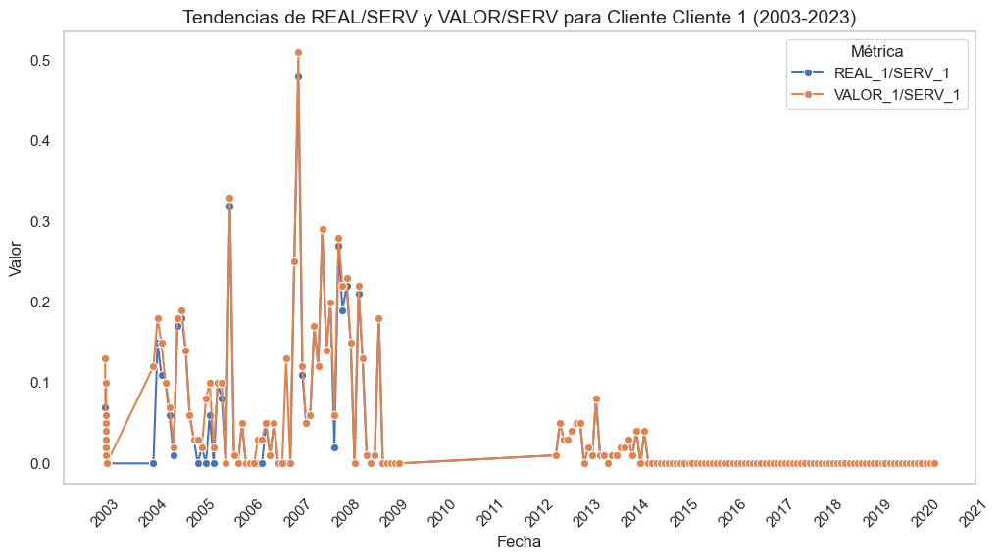

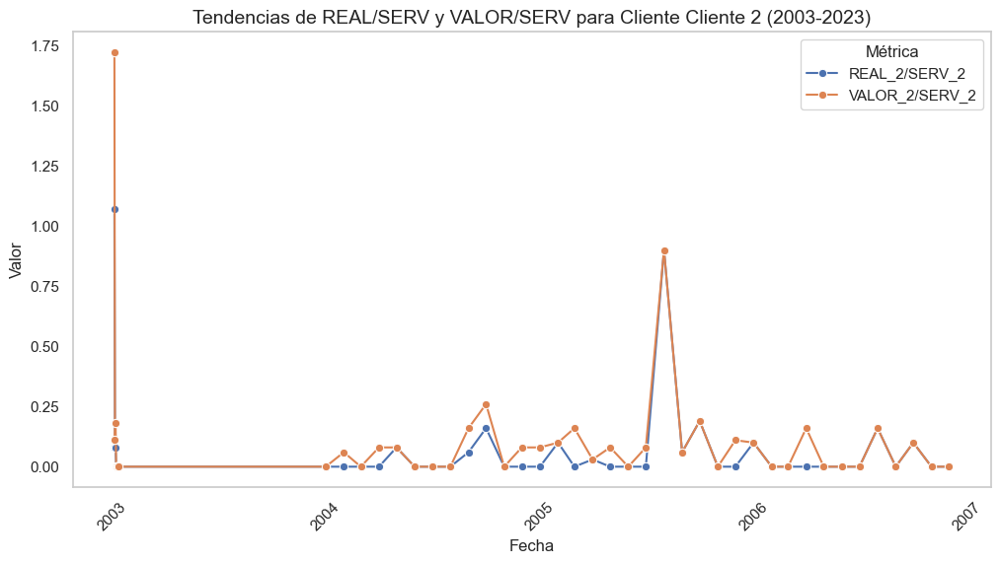

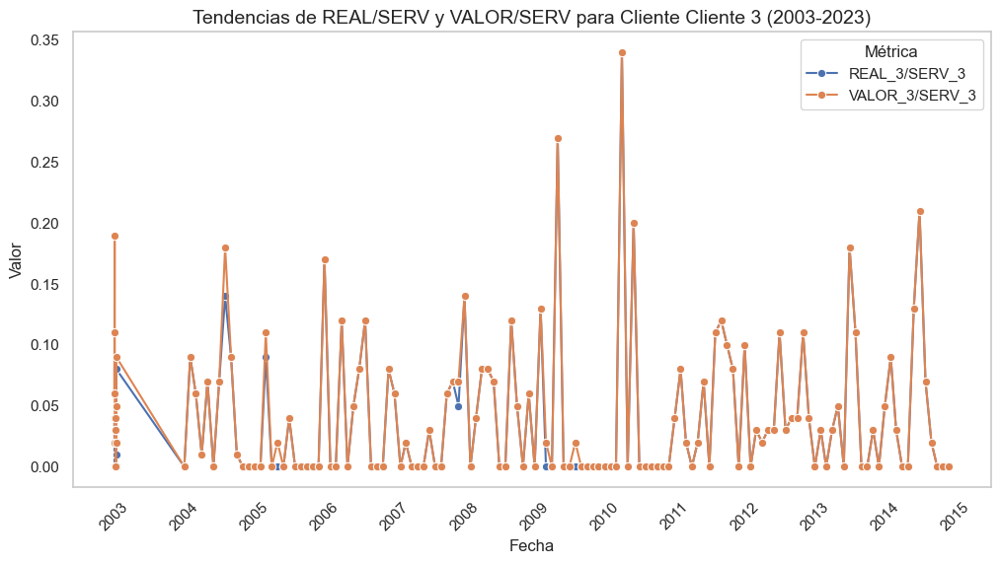

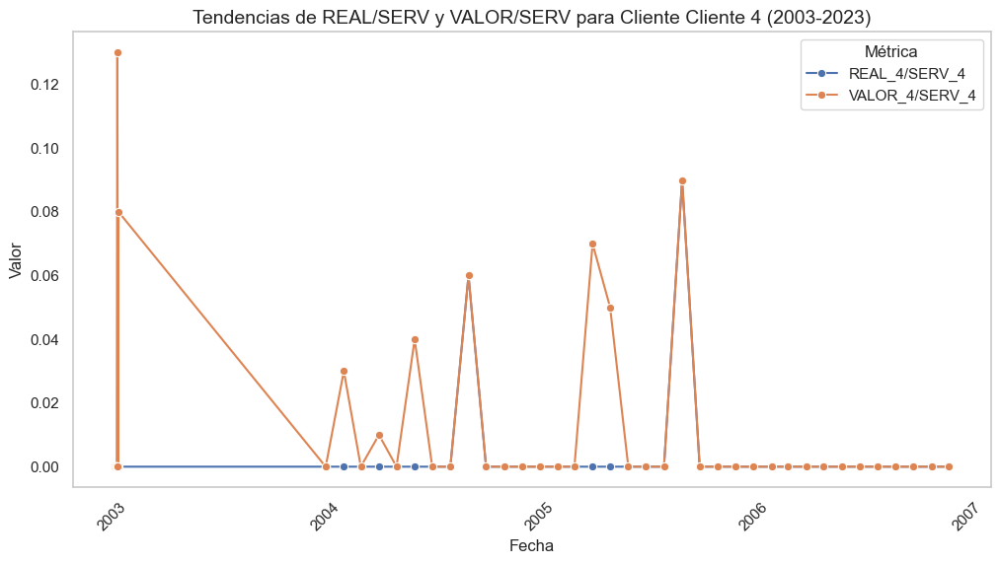

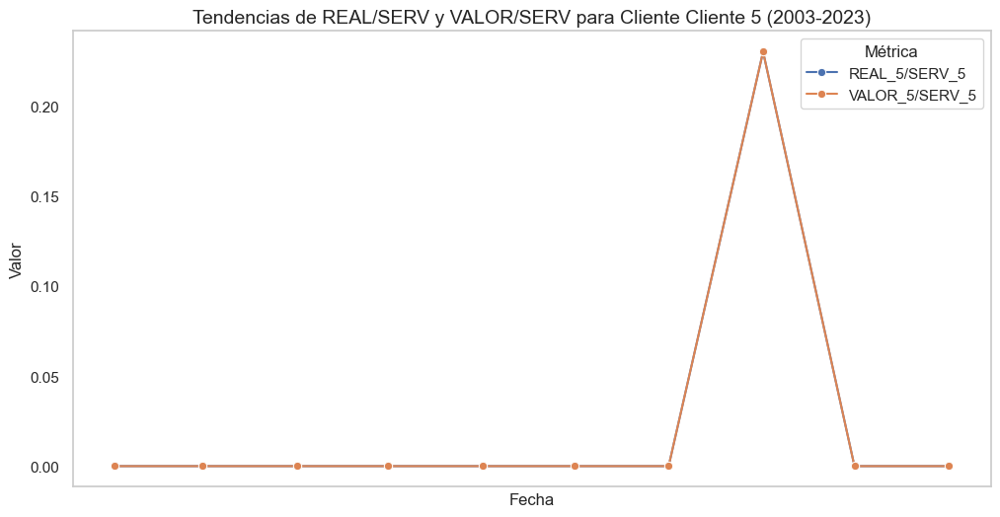

...

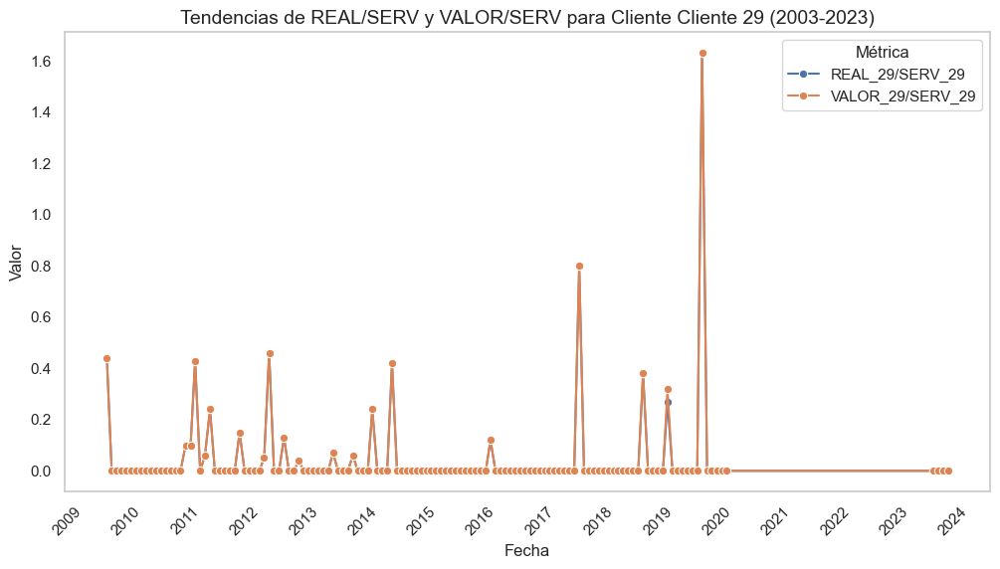

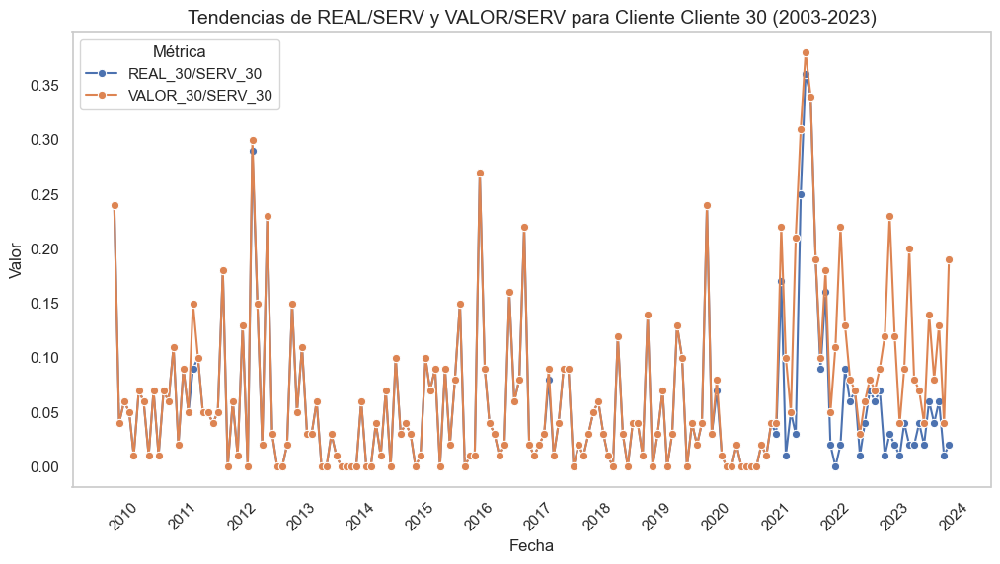

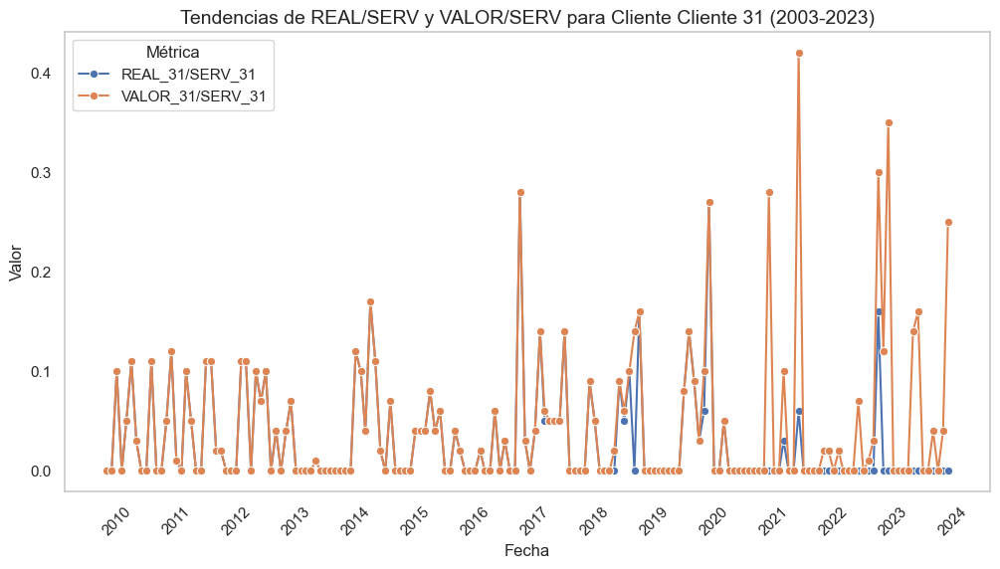

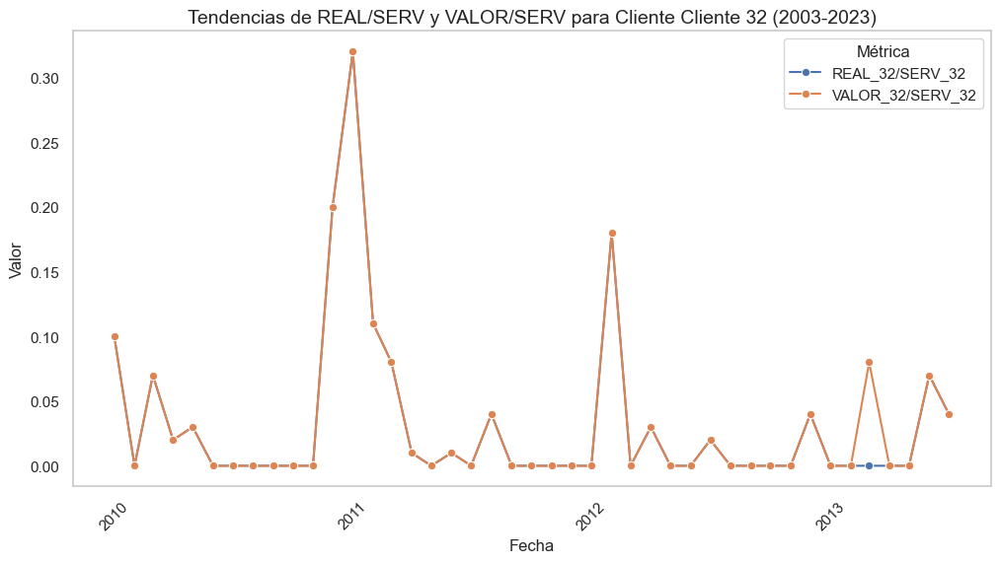

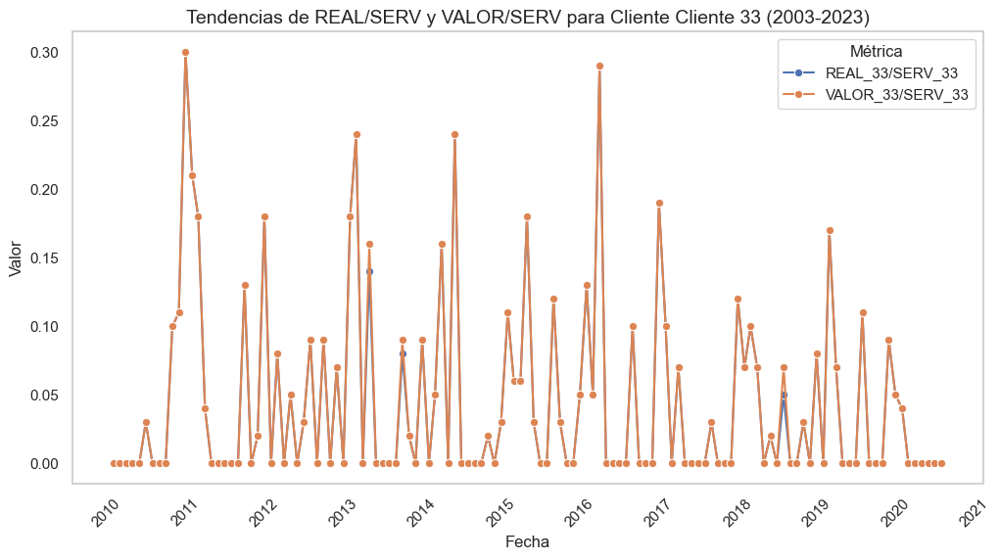

No se encontraron datos válidos para el Cliente Cliente 0.


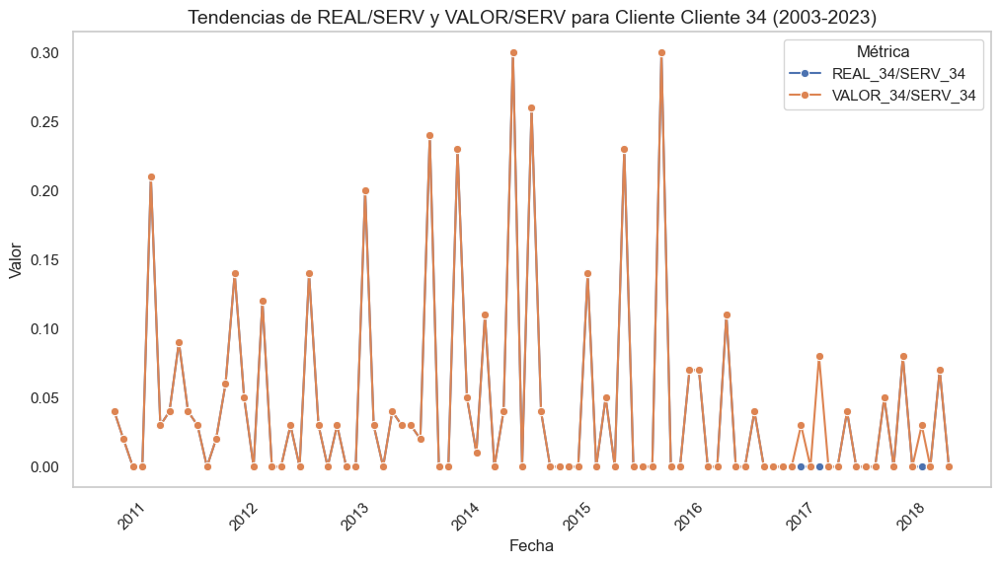

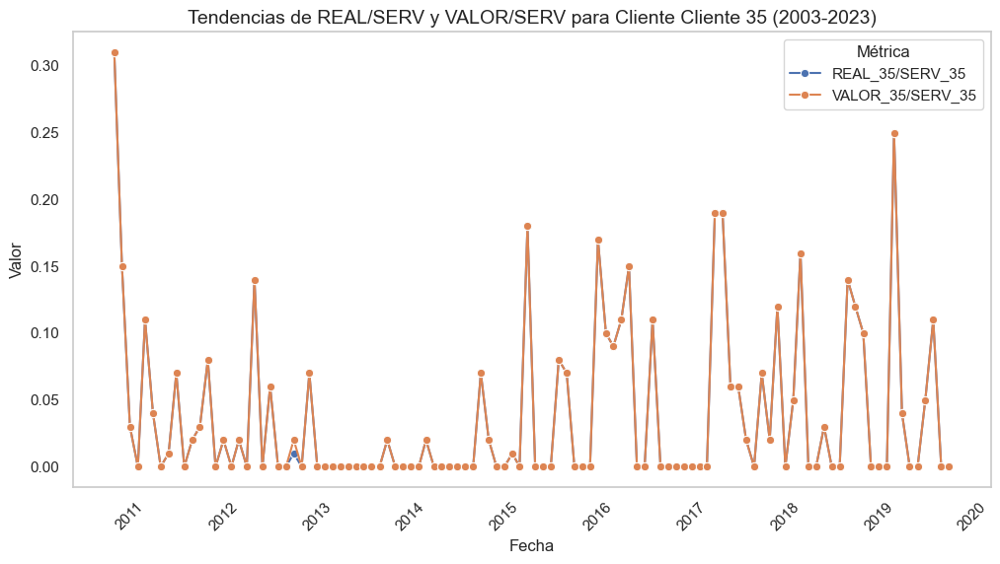

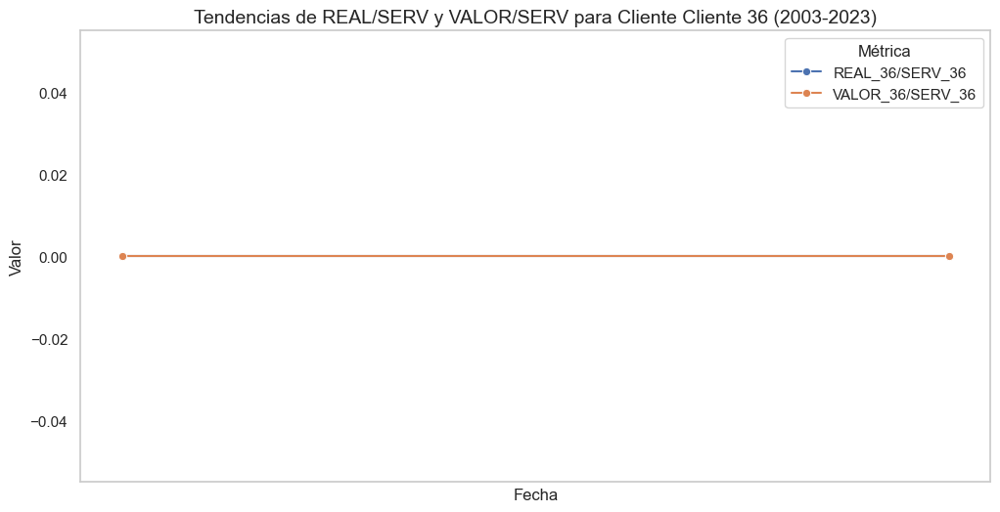

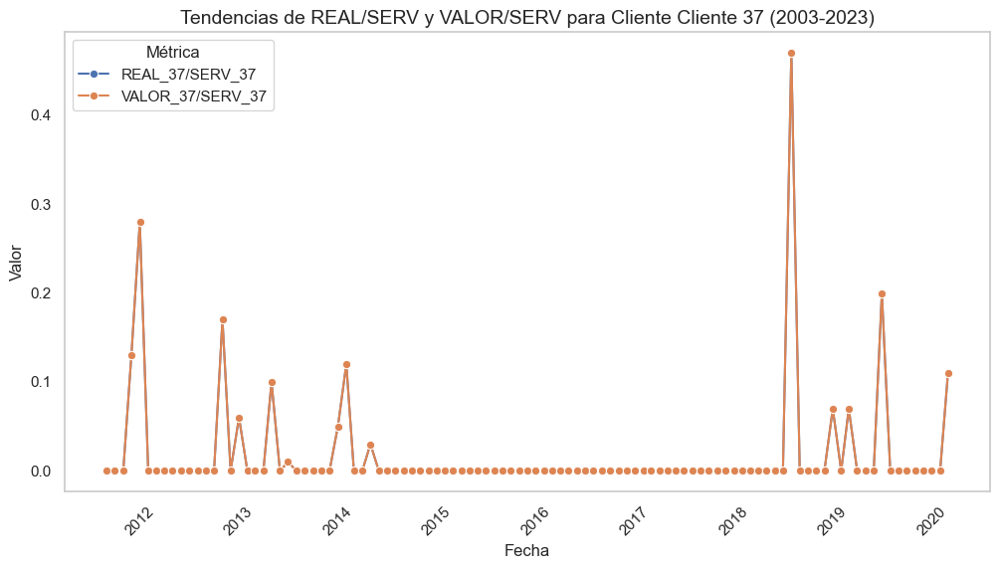

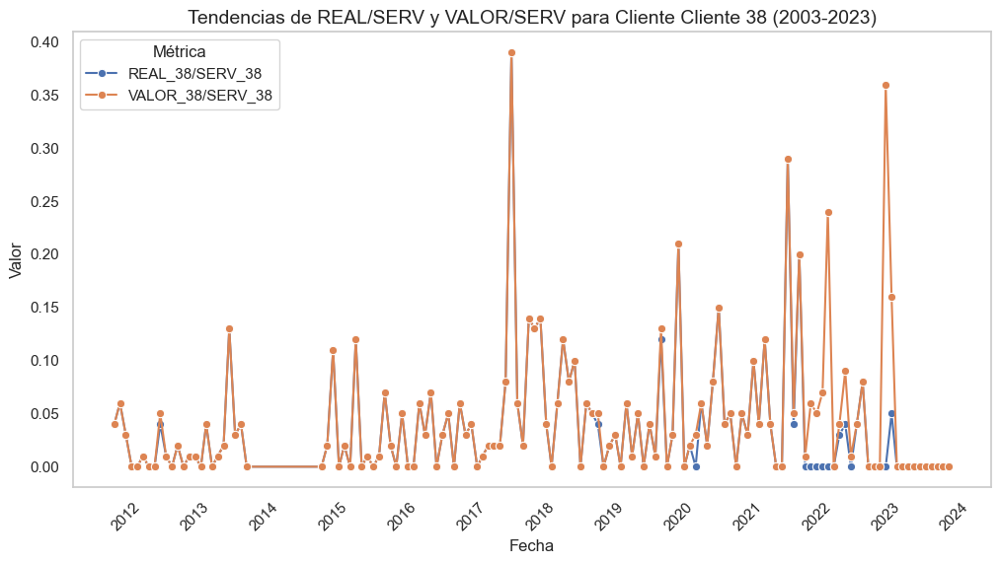

...

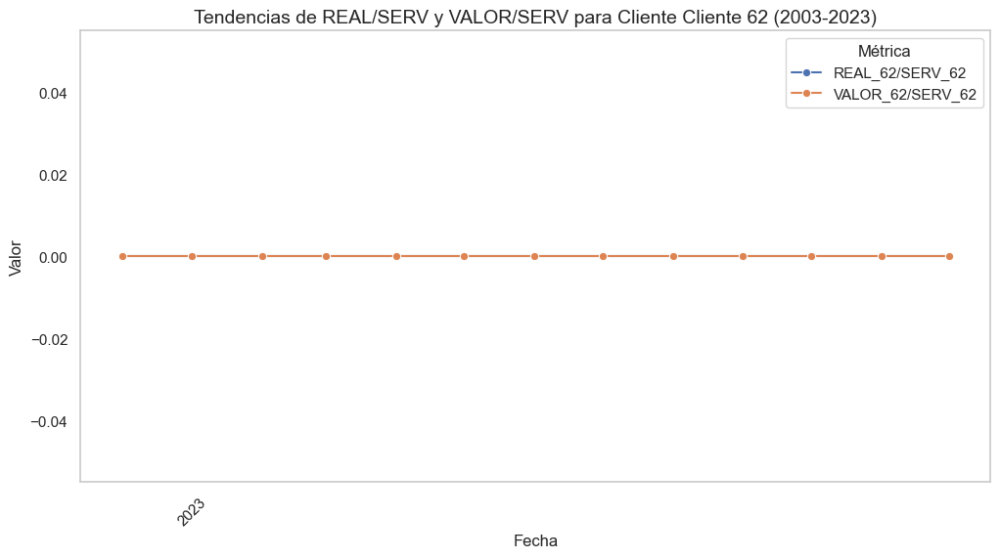

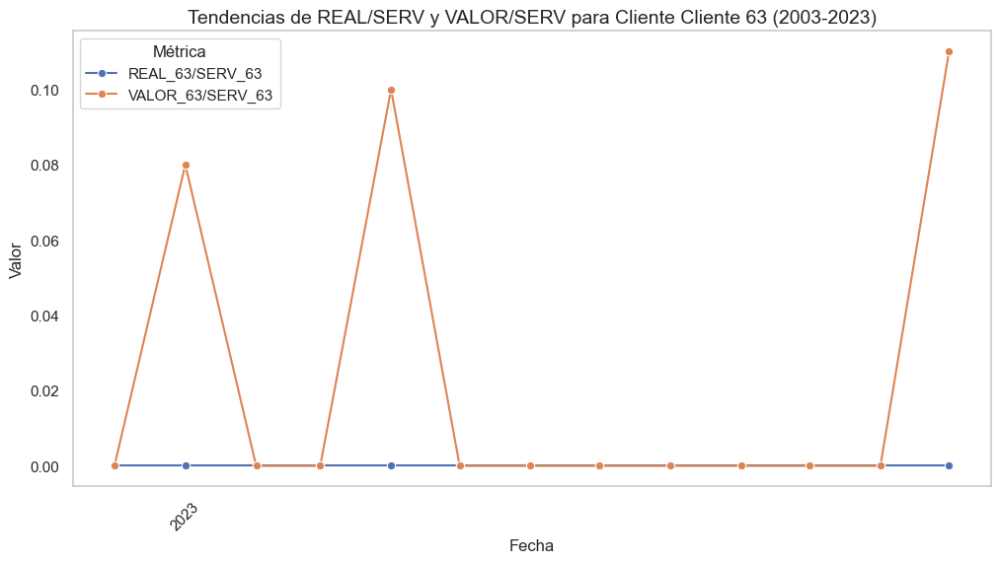

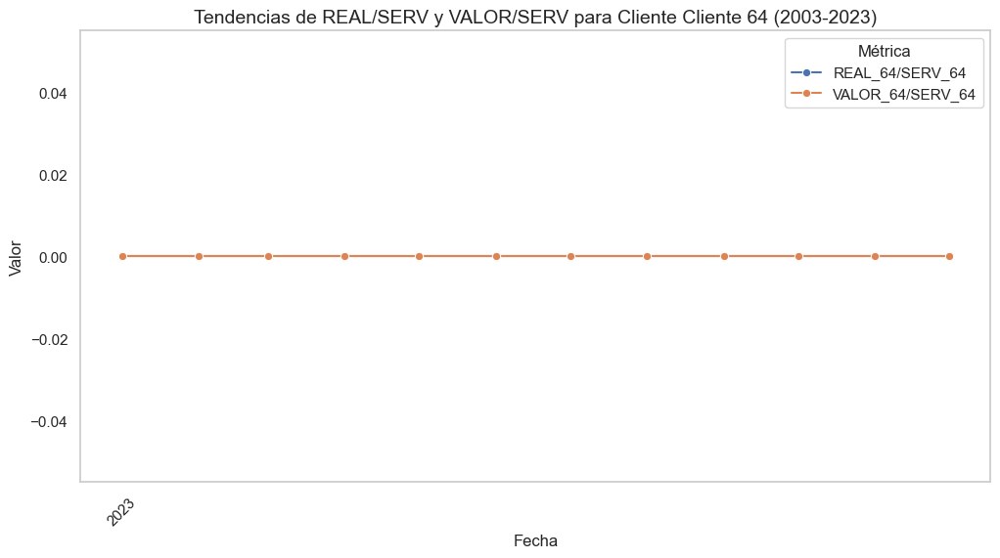

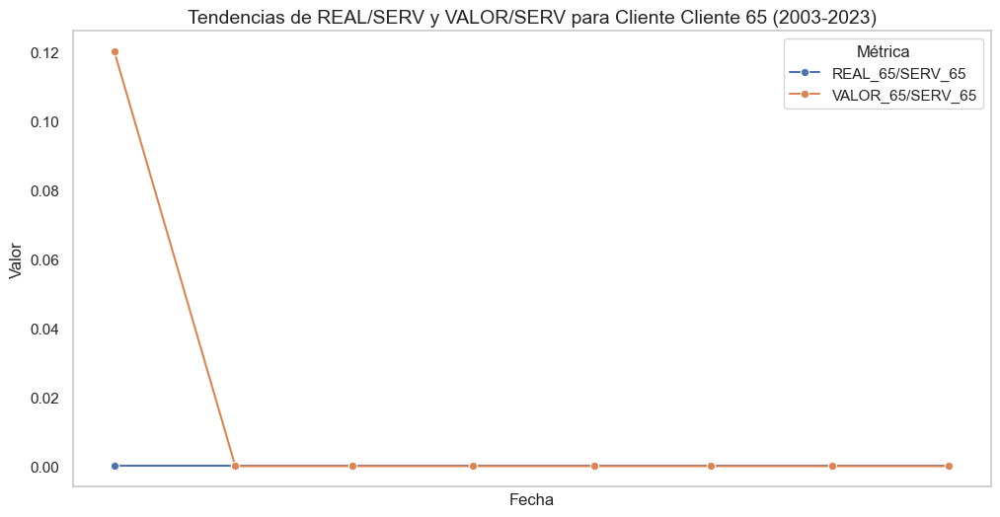

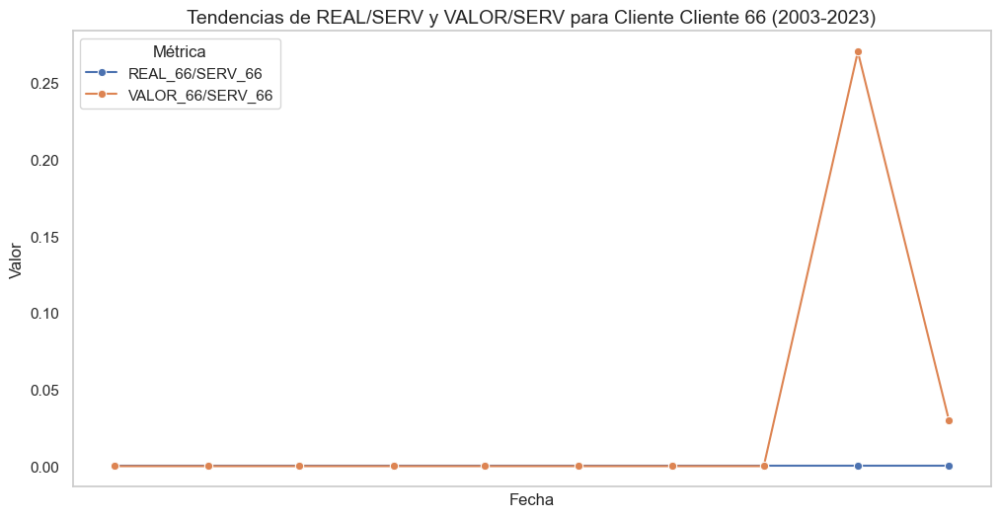

In [154]:
import matplotlib.dates as mdates

# Configurar eje X con fechas legibles
for cliente in data_larga_cliente['Cliente'].unique():
    cliente_data = data_larga_cliente[
        (data_larga_cliente['Cliente'] == cliente) &
        (data_larga_cliente['Métrica'].str.contains('/SERV_'))  # Filtrar solo métricas relevantes
    ]

    if cliente_data.empty:
        print(f"No se encontraron datos válidos para el Cliente {cliente}.")
        continue

    plt.figure(figsize=(12, 6))
    sns.lineplot(
        data=cliente_data,
        x='Date',
        y='Valor',
        hue='Métrica',
        marker='o'
    )
    plt.title(f'Tendencias de REAL/SERV y VALOR/SERV para Cliente {cliente} (2003-2023)', fontsize=14)
    plt.xlabel('Fecha')
    plt.ylabel('Valor')
    plt.legend(title='Métrica')
    plt.grid()

    # Formatear el eje X
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.YearLocator(1))  # Mostrar un año por etiqueta
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Formato: solo el año
    plt.xticks(rotation=45)  # Rotar etiquetas para mayor legibilidad

    plt.show()


--------------

# La tabla tabla_larga_corregida_manual se renombró como tabla_larga_cliente en SQL: #

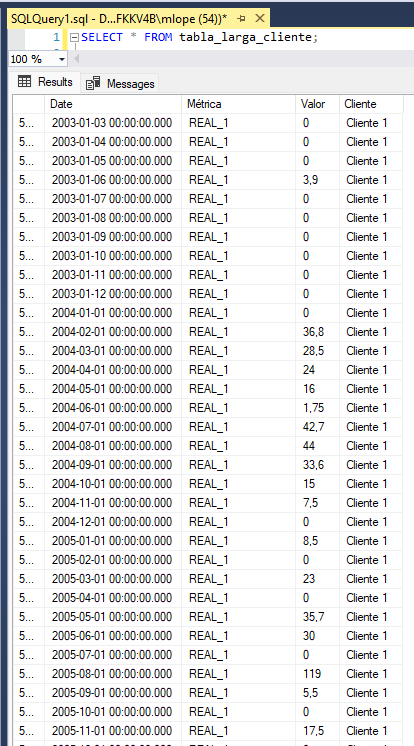

--------------------------